In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperature
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperature
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperature
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)

#Since the NaN values of GHI are gone which is used in data preparation, simulate these in solar activity instead
df['solar_activity'].loc[df['Year'] > 2020] = np.nan
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['GHI'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['temperatures'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df) 

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)     

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  1

C:\Users\User\AppData\Local\Temp\ipykernel_40008\547837095.py:375: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['solar_activity'].loc[df['Year'] > 2020] = np.nan


Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Fold 1:
(84, 1, 1, 1981)
(11, 1, 1, 1981)
(10, 1, 1, 1981)
(84, 1, 1981)
(11, 1, 1981)
(10, 1, 1981)
(84, 1981)
(11, 1981)
(10, 1981)
[[0.39307412 0.69695044 0.32924264 ... 0.28675577 0.28888214 0.44896719]
 [0.45747266 0.51683609 0.42215989 ... 0.44744836 0.28584447 0.55801944]
 [0.38487242 0.62674714 0.3411641  ... 0.35905225 0.21111786 0.59720535]
 ...
 [0.54100851 0.46473952 0.46949509 ... 0.33961118 0.4845079  0.34568651]
 [0.44896719 0.51620076 0.3997195  ... 0.41585662 0.27855407 0.57776428]
 [0.46780073 0.52414231 0.42356241 ... 0.48876063 0.37788578 0.5227825 ]]
Fold 2:
(84, 1, 1, 1981)
(11, 1, 1, 1981)
(10, 1, 1, 1981)
(84, 1, 1981)
(11, 1, 1981)
(10, 1, 1981)
(84, 1981)
(11, 1981)
(10, 1981)
[[0.38166311 0.62313675 0.34639831 ... 0.38227231 0.23789217 0.60767591]
 [0.39415169 0.71548931 0.32450565 ... 0.28754188 0.28967408 0.45019799]
 [0.45872677 0.53175632 0.4180791  ... 0.44867499 0.28662808 0.55954919]
 ...
 [0.54249162 0.47861309 0.465

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 1981)
(11, 1981)


[I 2025-05-24 01:14:49,027] A new study created in memory with name: no-name-a254aacd-e5f9-4c99-b1d9-1645c3bf35fb
[I 2025-05-24 01:17:23,834] Trial 0 finished with value: 23.75640449523926 and parameters: {'lr': 0.27455954898223045, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.2769771450430655}. Best is trial 0 with value: 23.75640449523926.


Cross Validation Accuracies:
[28.386796951293945, 17.246631622314453, 31.058330535888672, 20.8266544342041, 21.263608932495117]
Mean Cross Validation Accuracy:
23.75640449523926
Standard Deviation of Cross Validation Accuracy:
5.1367940623513855


[I 2025-05-24 01:22:40,737] Trial 1 finished with value: 2.9136954307556153 and parameters: {'lr': 0.03542932017961702, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.33099190087815533}. Best is trial 1 with value: 2.9136954307556153.


Cross Validation Accuracies:
[2.6969120502471924, 2.974562883377075, 2.999066114425659, 3.1494665145874023, 2.748469591140747]
Mean Cross Validation Accuracy:
2.9136954307556153
Standard Deviation of Cross Validation Accuracy:
0.16785447061739509


[I 2025-05-24 01:24:30,955] Trial 2 finished with value: 0.06556683331727982 and parameters: {'lr': 0.048170241691823955, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.4651473786935112}. Best is trial 2 with value: 0.06556683331727982.


Cross Validation Accuracies:
[0.056738827377557755, 0.04835420474410057, 0.07386302202939987, 0.08049244433641434, 0.06838566809892654]
Mean Cross Validation Accuracy:
0.06556683331727982
Standard Deviation of Cross Validation Accuracy:
0.011608227360263358


[I 2025-05-24 01:29:29,402] Trial 3 finished with value: 0.06684169620275497 and parameters: {'lr': 0.5743086885622539, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.1817819697434338}. Best is trial 2 with value: 0.06556683331727982.


Cross Validation Accuracies:
[0.06932682543992996, 0.05234504118561745, 0.07568491995334625, 0.08021990209817886, 0.05663179233670235]
Mean Cross Validation Accuracy:
0.06684169620275497
Standard Deviation of Cross Validation Accuracy:
0.010749418684271008


[I 2025-05-24 01:32:36,443] Trial 4 finished with value: 0.06394352242350579 and parameters: {'lr': 0.009607739326532786, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.33321987368146055}. Best is trial 4 with value: 0.06394352242350579.


Cross Validation Accuracies:
[0.05246889218688011, 0.048714831471443176, 0.07553674280643463, 0.08031662553548813, 0.06268052011728287]
Mean Cross Validation Accuracy:
0.06394352242350579
Standard Deviation of Cross Validation Accuracy:
0.0123907756526297


[I 2025-05-24 01:35:46,465] Trial 5 finished with value: 0.0924864411354065 and parameters: {'lr': 0.0015031393917400294, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4763431211580783}. Best is trial 4 with value: 0.06394352242350579.


Cross Validation Accuracies:
[0.06186594069004059, 0.08547300845384598, 0.10951998829841614, 0.0864206925034523, 0.11915257573127747]
Mean Cross Validation Accuracy:
0.0924864411354065
Standard Deviation of Cross Validation Accuracy:
0.020123722594038457


[I 2025-05-24 01:39:25,278] Trial 6 finished with value: 4.921090459823608 and parameters: {'lr': 0.05629717055531064, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.18480077321433305}. Best is trial 4 with value: 0.06394352242350579.


Cross Validation Accuracies:
[5.4950432777404785, 5.543609142303467, 4.683703422546387, 5.0100932121276855, 3.8730032444000244]
Mean Cross Validation Accuracy:
4.921090459823608
Standard Deviation of Cross Validation Accuracy:
0.6131414606353895


[I 2025-05-24 01:42:23,063] Trial 7 finished with value: 1.793049931526184 and parameters: {'lr': 0.09984030087893872, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4899956942058238}. Best is trial 4 with value: 0.06394352242350579.


Cross Validation Accuracies:
[1.9641616344451904, 1.8719676733016968, 1.9014703035354614, 1.687362551689148, 1.5402874946594238]
Mean Cross Validation Accuracy:
1.793049931526184
Standard Deviation of Cross Validation Accuracy:
0.15641027693668969


[I 2025-05-24 01:47:15,824] Trial 8 finished with value: 2.4693719863891603 and parameters: {'lr': 0.7452845246627954, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.24048531170363222}. Best is trial 4 with value: 0.06394352242350579.


Cross Validation Accuracies:
[1.4550007581710815, 4.408240795135498, 2.2485806941986084, 2.855778217315674, 1.379259467124939]
Mean Cross Validation Accuracy:
2.4693719863891603
Standard Deviation of Cross Validation Accuracy:
1.1112664055777706


[I 2025-05-24 01:53:18,329] Trial 9 finished with value: 0.06560355946421623 and parameters: {'lr': 0.03293608465099239, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.45049139942360017}. Best is trial 4 with value: 0.06394352242350579.


Cross Validation Accuracies:
[0.05907050147652626, 0.05372307449579239, 0.07350528240203857, 0.08261244744062424, 0.0591064915060997]
Mean Cross Validation Accuracy:
0.06560355946421623
Standard Deviation of Cross Validation Accuracy:
0.010749680529094375


[I 2025-05-24 01:56:29,911] Trial 10 finished with value: 0.06114573702216149 and parameters: {'lr': 0.004581236126477221, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3444997980336939}. Best is trial 10 with value: 0.06114573702216149.


Cross Validation Accuracies:
[0.04564683139324188, 0.04818272963166237, 0.07382512837648392, 0.08097866177558899, 0.05709533393383026]
Mean Cross Validation Accuracy:
0.06114573702216149
Standard Deviation of Cross Validation Accuracy:
0.013991234905250054


[I 2025-05-24 01:59:07,301] Trial 11 finished with value: 0.0649661049246788 and parameters: {'lr': 0.00456524424043338, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3627616845363944}. Best is trial 10 with value: 0.06114573702216149.


Cross Validation Accuracies:
[0.05076343193650246, 0.048969414085149765, 0.08035502582788467, 0.08078022301197052, 0.0639624297618866]
Mean Cross Validation Accuracy:
0.0649661049246788
Standard Deviation of Cross Validation Accuracy:
0.013751528054008295


[I 2025-05-24 02:01:45,815] Trial 12 finished with value: 0.06143757477402687 and parameters: {'lr': 0.007413701059526083, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.38158486663021657}. Best is trial 10 with value: 0.06114573702216149.


Cross Validation Accuracies:
[0.04950827732682228, 0.0521048866212368, 0.06715130805969238, 0.08107379078865051, 0.057349611073732376]
Mean Cross Validation Accuracy:
0.06143757477402687
Standard Deviation of Cross Validation Accuracy:
0.011526893600521516


[I 2025-05-24 02:04:30,652] Trial 13 finished with value: 0.06170491874217987 and parameters: {'lr': 0.007833455576434006, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.39621961406469747}. Best is trial 10 with value: 0.06114573702216149.


Cross Validation Accuracies:
[0.051183149218559265, 0.055478427559137344, 0.07137885689735413, 0.07874985784292221, 0.05173430219292641]
Mean Cross Validation Accuracy:
0.06170491874217987
Standard Deviation of Cross Validation Accuracy:
0.011251711417478641


[I 2025-05-24 02:07:10,632] Trial 14 finished with value: 0.0609745480120182 and parameters: {'lr': 0.0011856222224690622, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.40028591626678933}. Best is trial 14 with value: 0.0609745480120182.


Cross Validation Accuracies:
[0.05213545262813568, 0.049941834062337875, 0.07051877677440643, 0.07569799572229385, 0.056578680872917175]
Mean Cross Validation Accuracy:
0.0609745480120182
Standard Deviation of Cross Validation Accuracy:
0.010266900674999175


[I 2025-05-24 02:09:45,982] Trial 15 finished with value: 0.06283268705010414 and parameters: {'lr': 0.0012497264091543851, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1265478044347118}. Best is trial 14 with value: 0.0609745480120182.


Cross Validation Accuracies:
[0.054266806691884995, 0.050981953740119934, 0.06686233729124069, 0.08190910518169403, 0.060143232345581055]
Mean Cross Validation Accuracy:
0.06283268705010414
Standard Deviation of Cross Validation Accuracy:
0.010965356015200952


[I 2025-05-24 02:12:18,400] Trial 16 finished with value: 0.1651138946413994 and parameters: {'lr': 0.002877065002542183, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4152315040586685}. Best is trial 14 with value: 0.0609745480120182.


Cross Validation Accuracies:
[0.22418655455112457, 0.18659251928329468, 0.1117190346121788, 0.13696712255477905, 0.1661042422056198]
Mean Cross Validation Accuracy:
0.1651138946413994
Standard Deviation of Cross Validation Accuracy:
0.03897471772842402


[I 2025-05-24 02:15:01,879] Trial 17 finished with value: 0.06498455479741097 and parameters: {'lr': 0.0024545326108117867, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2949077094990697}. Best is trial 14 with value: 0.0609745480120182.


Cross Validation Accuracies:
[0.05799982696771622, 0.053500089794397354, 0.07763302326202393, 0.08054939657449722, 0.055240437388420105]
Mean Cross Validation Accuracy:
0.06498455479741097
Standard Deviation of Cross Validation Accuracy:
0.011643669845771082


[I 2025-05-24 02:17:53,753] Trial 18 finished with value: 0.061916190385818484 and parameters: {'lr': 0.01557457600055952, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4284849147743299}. Best is trial 14 with value: 0.0609745480120182.


Cross Validation Accuracies:
[0.0531536303460598, 0.050262656062841415, 0.0732908844947815, 0.07513012737035751, 0.057743653655052185]
Mean Cross Validation Accuracy:
0.061916190385818484
Standard Deviation of Cross Validation Accuracy:
0.010334303848258192


[I 2025-05-24 02:20:46,223] Trial 19 finished with value: 0.0764956682920456 and parameters: {'lr': 0.0010915738348020313, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3450491638700112}. Best is trial 14 with value: 0.0609745480120182.


Cross Validation Accuracies:
[0.07004052400588989, 0.06310049444437027, 0.07155364006757736, 0.08092636615037918, 0.09685731679201126]
Mean Cross Validation Accuracy:
0.0764956682920456
Standard Deviation of Cross Validation Accuracy:
0.011659768662233142


[I 2025-05-24 02:23:23,114] Trial 20 finished with value: 0.06015301942825317 and parameters: {'lr': 0.003128166359835344, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2268178469119963}. Best is trial 20 with value: 0.06015301942825317.


Cross Validation Accuracies:
[0.04928559437394142, 0.05044431984424591, 0.06845235079526901, 0.07723475992679596, 0.055348072201013565]
Mean Cross Validation Accuracy:
0.06015301942825317
Standard Deviation of Cross Validation Accuracy:
0.010918901523314815


[I 2025-05-24 02:26:20,788] Trial 21 finished with value: 0.06036801263689995 and parameters: {'lr': 0.003143257055657138, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.24834010332358533}. Best is trial 20 with value: 0.06015301942825317.


Cross Validation Accuracies:
[0.04985060915350914, 0.04999051243066788, 0.068666011095047, 0.07751069217920303, 0.05582223832607269]
Mean Cross Validation Accuracy:
0.06036801263689995
Standard Deviation of Cross Validation Accuracy:
0.010969964365933667


[I 2025-05-24 02:28:33,726] Trial 22 finished with value: 0.06029716357588768 and parameters: {'lr': 0.0025778105475094733, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23826383924803246}. Best is trial 20 with value: 0.06015301942825317.


Cross Validation Accuracies:
[0.04981835186481476, 0.04982467740774155, 0.06882879137992859, 0.07738081365823746, 0.05563318356871605]
Mean Cross Validation Accuracy:
0.06029716357588768
Standard Deviation of Cross Validation Accuracy:
0.011007914825690478


[I 2025-05-24 02:30:40,521] Trial 23 finished with value: 0.06073827371001243 and parameters: {'lr': 0.015295738515627015, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23759920743514745}. Best is trial 20 with value: 0.06015301942825317.


Cross Validation Accuracies:
[0.053188785910606384, 0.05123613774776459, 0.06489375978708267, 0.07852307707071304, 0.05584960803389549]
Mean Cross Validation Accuracy:
0.06073827371001243
Standard Deviation of Cross Validation Accuracy:
0.01004740465082183


[I 2025-05-24 02:33:02,720] Trial 24 finished with value: 0.060454299300909044 and parameters: {'lr': 0.003142674932589341, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2252631451482534}. Best is trial 20 with value: 0.06015301942825317.


Cross Validation Accuracies:
[0.05048586055636406, 0.0500434972345829, 0.06816613674163818, 0.07767672836780548, 0.05589927360415459]
Mean Cross Validation Accuracy:
0.060454299300909044
Standard Deviation of Cross Validation Accuracy:
0.010812838012682617


[I 2025-05-24 02:35:34,216] Trial 25 finished with value: 0.060134421288967135 and parameters: {'lr': 0.016193524557277485, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.18662609664221602}. Best is trial 25 with value: 0.060134421288967135.


Cross Validation Accuracies:
[0.04768305644392967, 0.051723215728998184, 0.06393946707248688, 0.0822264775633812, 0.055099889636039734]
Mean Cross Validation Accuracy:
0.060134421288967135
Standard Deviation of Cross Validation Accuracy:
0.012277366967613002


[I 2025-05-24 02:38:22,648] Trial 26 finished with value: 0.0623211219906807 and parameters: {'lr': 0.01730174402432747, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1055095584927794}. Best is trial 25 with value: 0.060134421288967135.


Cross Validation Accuracies:
[0.053115442395210266, 0.0500214658677578, 0.07658947259187698, 0.07702068984508514, 0.05485853925347328]
Mean Cross Validation Accuracy:
0.0623211219906807
Standard Deviation of Cross Validation Accuracy:
0.011927944857779822


[I 2025-05-24 02:41:09,354] Trial 27 finished with value: 0.060410875082015994 and parameters: {'lr': 0.0019888224693286297, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.18592237249952911}. Best is trial 25 with value: 0.060134421288967135.


Cross Validation Accuracies:
[0.05031718313694, 0.0499044768512249, 0.06877260655164719, 0.07767124474048615, 0.05538886412978172]
Mean Cross Validation Accuracy:
0.060410875082015994
Standard Deviation of Cross Validation Accuracy:
0.011002968043102558


[I 2025-05-24 02:43:29,661] Trial 28 finished with value: 0.06558509767055512 and parameters: {'lr': 0.08613588507773572, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.14606899226087272}. Best is trial 25 with value: 0.060134421288967135.


Cross Validation Accuracies:
[0.05730455741286278, 0.05909468233585358, 0.0675724521279335, 0.08944982290267944, 0.054503973573446274]
Mean Cross Validation Accuracy:
0.06558509767055512
Standard Deviation of Cross Validation Accuracy:
0.012704005963283959


[I 2025-05-24 02:47:11,417] Trial 29 finished with value: 0.07345188036561012 and parameters: {'lr': 0.18646011808198198, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.2111675399050558}. Best is trial 25 with value: 0.060134421288967135.


Cross Validation Accuracies:
[0.050246063619852066, 0.0738920345902443, 0.08072803914546967, 0.10192679613828659, 0.060466468334198]
Mean Cross Validation Accuracy:
0.07345188036561012
Standard Deviation of Cross Validation Accuracy:
0.01772618349817838


[I 2025-05-24 02:49:37,058] Trial 30 finished with value: 0.06125596091151238 and parameters: {'lr': 0.005047168978690425, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.2703744177799953}. Best is trial 25 with value: 0.060134421288967135.


Cross Validation Accuracies:
[0.04424184188246727, 0.050399914383888245, 0.06946197897195816, 0.08010391145944595, 0.062072157859802246]
Mean Cross Validation Accuracy:
0.06125596091151238
Standard Deviation of Cross Validation Accuracy:
0.01288863175258386


[I 2025-05-24 02:52:10,257] Trial 31 finished with value: 0.06044751107692718 and parameters: {'lr': 0.003574335219382458, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.25892951183628643}. Best is trial 25 with value: 0.060134421288967135.


Cross Validation Accuracies:
[0.04996635019779205, 0.048974666744470596, 0.06956552714109421, 0.07822687178850174, 0.05550413951277733]
Mean Cross Validation Accuracy:
0.06044751107692718
Standard Deviation of Cross Validation Accuracy:
0.011533964601393817


[I 2025-05-24 02:54:37,095] Trial 32 finished with value: 0.06032668501138687 and parameters: {'lr': 0.0020804960908018264, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.29370278149841683}. Best is trial 25 with value: 0.060134421288967135.


Cross Validation Accuracies:
[0.04972798004746437, 0.04935836419463158, 0.06906746327877045, 0.07791615277528763, 0.055563464760780334]
Mean Cross Validation Accuracy:
0.06032668501138687
Standard Deviation of Cross Validation Accuracy:
0.011323563542844629


[I 2025-05-24 02:57:15,430] Trial 33 finished with value: 0.06065194383263588 and parameters: {'lr': 0.001825789401896067, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.28933630015708955}. Best is trial 25 with value: 0.060134421288967135.


Cross Validation Accuracies:
[0.050890401005744934, 0.04965123161673546, 0.06901171058416367, 0.0780438780784607, 0.055662497878074646]
Mean Cross Validation Accuracy:
0.06065194383263588
Standard Deviation of Cross Validation Accuracy:
0.011077572256616678


[I 2025-05-24 03:00:03,793] Trial 34 finished with value: 0.05913354828953743 and parameters: {'lr': 0.010711033854085991, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.20605728307345433}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.047837767750024796, 0.05029488727450371, 0.06890866160392761, 0.07582249492406845, 0.05280392989516258]
Mean Cross Validation Accuracy:
0.05913354828953743
Standard Deviation of Cross Validation Accuracy:
0.011134221442321958


[I 2025-05-24 03:03:11,634] Trial 35 finished with value: 0.07068194076418877 and parameters: {'lr': 0.020297971543715716, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.2089724622499452}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.075153648853302, 0.05108604207634926, 0.08513563126325607, 0.07477931678295135, 0.06725506484508514]
Mean Cross Validation Accuracy:
0.07068194076418877
Standard Deviation of Cross Validation Accuracy:
0.011326398866940916


[I 2025-05-24 03:05:24,036] Trial 36 finished with value: 0.06221873685717583 and parameters: {'lr': 0.010808973226700562, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1566041854311677}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05211574211716652, 0.05416351184248924, 0.07165911793708801, 0.07691537588834763, 0.056239936500787735]
Mean Cross Validation Accuracy:
0.06221873685717583
Standard Deviation of Cross Validation Accuracy:
0.010077848978844254


[I 2025-05-24 03:07:26,232] Trial 37 finished with value: 0.06452054157853127 and parameters: {'lr': 0.0257080728889493, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.1658080930294185}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05581697076559067, 0.04729637876152992, 0.08255703002214432, 0.07942619919776917, 0.05750612914562225]
Mean Cross Validation Accuracy:
0.06452054157853127
Standard Deviation of Cross Validation Accuracy:
0.013922064903310312


[I 2025-05-24 03:09:49,809] Trial 38 finished with value: 0.40480507016181944 and parameters: {'lr': 0.006174165219832113, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.21571643430747794}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.40590962767601013, 0.4014016091823578, 0.3723083436489105, 0.3996005058288574, 0.4448052644729614]
Mean Cross Validation Accuracy:
0.40480507016181944
Standard Deviation of Cross Validation Accuracy:
0.023220438681561234


[I 2025-05-24 03:11:18,818] Trial 39 finished with value: 0.06139614582061768 and parameters: {'lr': 0.011269740085512518, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3163670105568597}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.049281343817710876, 0.04953119531273842, 0.06986433267593384, 0.08151528984308243, 0.05678856745362282]
Mean Cross Validation Accuracy:
0.06139614582061768
Standard Deviation of Cross Validation Accuracy:
0.012532082040469465


[I 2025-05-24 03:14:02,370] Trial 40 finished with value: 0.06344045773148536 and parameters: {'lr': 0.04555620055823249, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.19636164596394126}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.050715282559394836, 0.055111613124608994, 0.0686449408531189, 0.087684266269207, 0.05504618585109711]
Mean Cross Validation Accuracy:
0.06344045773148536
Standard Deviation of Cross Validation Accuracy:
0.013539663459811935


[I 2025-05-24 03:16:15,917] Trial 41 finished with value: 0.06025336086750031 and parameters: {'lr': 0.002197364222006618, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.28332549637052307}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.04960919916629791, 0.04986818879842758, 0.06903445720672607, 0.07726400345563889, 0.05549095571041107]
Mean Cross Validation Accuracy:
0.06025336086750031
Standard Deviation of Cross Validation Accuracy:
0.011048077609122959


[I 2025-05-24 03:18:47,890] Trial 42 finished with value: 0.06044140011072159 and parameters: {'lr': 0.004066621745203917, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2638291802279001}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05011269077658653, 0.050732966512441635, 0.06861677765846252, 0.07756196707487106, 0.055182598531246185]
Mean Cross Validation Accuracy:
0.06044140011072159
Standard Deviation of Cross Validation Accuracy:
0.010849345830192581


[I 2025-05-24 03:20:48,178] Trial 43 finished with value: 0.06018171235918999 and parameters: {'lr': 0.00639709543724013, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.22868760942707847}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.04894290119409561, 0.049736324697732925, 0.06931102275848389, 0.07803194969892502, 0.054886363446712494]
Mean Cross Validation Accuracy:
0.06018171235918999
Standard Deviation of Cross Validation Accuracy:
0.011536316581640541


[I 2025-05-24 03:23:43,791] Trial 44 finished with value: 0.08532668277621269 and parameters: {'lr': 0.009110594001128238, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.17200971836983253}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.044940024614334106, 0.048171449452638626, 0.14813250303268433, 0.12274596840143204, 0.06264346837997437]
Mean Cross Validation Accuracy:
0.08532668277621269
Standard Deviation of Cross Validation Accuracy:
0.042121005996887936


[I 2025-05-24 03:26:32,541] Trial 45 finished with value: 0.0601502925157547 and parameters: {'lr': 0.006879864684702436, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1928751024341528}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05165623128414154, 0.047235067933797836, 0.06825336068868637, 0.07760883122682571, 0.05599797144532204]
Mean Cross Validation Accuracy:
0.0601502925157547
Standard Deviation of Cross Validation Accuracy:
0.011195125369748022


[I 2025-05-24 03:28:57,792] Trial 46 finished with value: 0.060184579342603683 and parameters: {'lr': 0.006176834645418555, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14418396126602084}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.04904922470450401, 0.050510063767433167, 0.06830798834562302, 0.07652494311332703, 0.056530676782131195]
Mean Cross Validation Accuracy:
0.060184579342603683
Standard Deviation of Cross Validation Accuracy:
0.01062017552060036


[I 2025-05-24 03:30:56,960] Trial 47 finished with value: 0.08029547780752182 and parameters: {'lr': 0.011748505127121736, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.19423181222100327}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.06798257678747177, 0.10366661101579666, 0.070403553545475, 0.09515287727117538, 0.06427177041769028]
Mean Cross Validation Accuracy:
0.08029547780752182
Standard Deviation of Cross Validation Accuracy:
0.015957249649686266


[I 2025-05-24 03:32:49,677] Trial 48 finished with value: 0.06572808027267456 and parameters: {'lr': 0.025021114569514464, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.12397463300918493}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05379323661327362, 0.05705978721380234, 0.0791870653629303, 0.0836975947022438, 0.05490271747112274]
Mean Cross Validation Accuracy:
0.06572808027267456
Standard Deviation of Cross Validation Accuracy:
0.012952343463700155


[I 2025-05-24 03:35:35,055] Trial 49 finished with value: 0.06030029281973839 and parameters: {'lr': 0.005897507163493075, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.20586343677810245}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.049454644322395325, 0.04923170432448387, 0.06817538291215897, 0.07907834649085999, 0.05556138604879379]
Mean Cross Validation Accuracy:
0.06030029281973839
Standard Deviation of Cross Validation Accuracy:
0.011638138370273565


[I 2025-05-24 03:37:17,388] Trial 50 finished with value: 0.06460933238267899 and parameters: {'lr': 0.008168268390834524, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.22568923323962325}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.055616650730371475, 0.0518067330121994, 0.07353091239929199, 0.08202406018972397, 0.06006830558180809]
Mean Cross Validation Accuracy:
0.06460933238267899
Standard Deviation of Cross Validation Accuracy:
0.011386510729220558


[I 2025-05-24 03:39:17,292] Trial 51 finished with value: 0.060873642563819885 and parameters: {'lr': 0.0062342105880792646, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14857891439560053}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.051437344402074814, 0.04908685386180878, 0.07047172635793686, 0.0770905464887619, 0.056281741708517075]
Mean Cross Validation Accuracy:
0.060873642563819885
Standard Deviation of Cross Validation Accuracy:
0.010992441492205737


[I 2025-05-24 03:41:17,685] Trial 52 finished with value: 0.06073442250490189 and parameters: {'lr': 0.013828964883458137, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.18012984300904158}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.04662466421723366, 0.04828793182969093, 0.07280050963163376, 0.08217871189117432, 0.053780294954776764]
Mean Cross Validation Accuracy:
0.06073442250490189
Standard Deviation of Cross Validation Accuracy:
0.014197241315692466


[I 2025-05-24 03:43:02,982] Trial 53 finished with value: 0.059829755872488025 and parameters: {'lr': 0.007220135824895528, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1356827293130202}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.04944777861237526, 0.049099620431661606, 0.06767816096544266, 0.07637955993413925, 0.056543659418821335]
Mean Cross Validation Accuracy:
0.059829755872488025
Standard Deviation of Cross Validation Accuracy:
0.010669706324852079


[I 2025-05-24 03:45:29,255] Trial 54 finished with value: 0.06186379715800285 and parameters: {'lr': 0.020321617972073543, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.13310142572103295}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.054229818284511566, 0.05653983727097511, 0.07031415402889252, 0.0738142654299736, 0.05442091077566147]
Mean Cross Validation Accuracy:
0.06186379715800285
Standard Deviation of Cross Validation Accuracy:
0.00844086444844136


[I 2025-05-24 03:48:16,666] Trial 55 finished with value: 0.0604045569896698 and parameters: {'lr': 0.004485926645607255, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1711253683562778}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05067886412143707, 0.04925739765167236, 0.06892916560173035, 0.07816582918167114, 0.054991528391838074]
Mean Cross Validation Accuracy:
0.0604045569896698
Standard Deviation of Cross Validation Accuracy:
0.011280787947142856


[I 2025-05-24 03:52:02,114] Trial 56 finished with value: 0.1970097929239273 and parameters: {'lr': 0.38783067355748657, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.10283003488047743}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.19011417031288147, 0.19556693732738495, 0.2142968773841858, 0.19432377815246582, 0.1907472014427185]
Mean Cross Validation Accuracy:
0.1970097929239273
Standard Deviation of Cross Validation Accuracy:
0.008887175704525808


[I 2025-05-24 03:54:54,838] Trial 57 finished with value: 0.060141570121049884 and parameters: {'lr': 0.008161005596362023, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2265369633430701}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05110873281955719, 0.0510946661233902, 0.06847307831048965, 0.07591685652732849, 0.05411451682448387]
Mean Cross Validation Accuracy:
0.060141570121049884
Standard Deviation of Cross Validation Accuracy:
0.010178778738223721


[I 2025-05-24 03:57:15,484] Trial 58 finished with value: 0.07027551308274269 and parameters: {'lr': 0.04203925949370278, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.25383304018554464}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.06251529604196548, 0.07263660430908203, 0.07576863467693329, 0.0847727507352829, 0.05568427965044975]
Mean Cross Validation Accuracy:
0.07027551308274269
Standard Deviation of Cross Validation Accuracy:
0.010188661323034752


[I 2025-05-24 03:59:33,687] Trial 59 finished with value: 0.06060063317418098 and parameters: {'lr': 0.008729802265305049, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.19720629389981606}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.052145782858133316, 0.04789001867175102, 0.06981194764375687, 0.07747974246740341, 0.055675674229860306]
Mean Cross Validation Accuracy:
0.06060063317418098
Standard Deviation of Cross Validation Accuracy:
0.011198679210419095


[I 2025-05-24 04:02:06,197] Trial 60 finished with value: 0.06080346629023552 and parameters: {'lr': 0.013331171609956168, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11811665895383001}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05008452758193016, 0.04950093850493431, 0.06643061339855194, 0.08134935796260834, 0.05665189400315285]
Mean Cross Validation Accuracy:
0.06080346629023552
Standard Deviation of Cross Validation Accuracy:
0.01194719032255114


[I 2025-05-24 04:04:25,613] Trial 61 finished with value: 0.05961838066577911 and parameters: {'lr': 0.007551349703198679, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23447128030187422}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05039072036743164, 0.050409432500600815, 0.0666702538728714, 0.07649236172437668, 0.054129134863615036]
Mean Cross Validation Accuracy:
0.05961838066577911
Standard Deviation of Cross Validation Accuracy:
0.010339694510593921


[I 2025-05-24 04:06:57,194] Trial 62 finished with value: 0.060382040590047835 and parameters: {'lr': 0.010152459241818101, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.24729624390370683}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.051139459013938904, 0.04933193698525429, 0.0689486712217331, 0.0772479996085167, 0.055242136120796204]
Mean Cross Validation Accuracy:
0.060382040590047835
Standard Deviation of Cross Validation Accuracy:
0.010879305637890054


[I 2025-05-24 04:09:17,649] Trial 63 finished with value: 0.060069408267736435 and parameters: {'lr': 0.0015231223695877111, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3088457927753934}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.050088558346033096, 0.04955102503299713, 0.06837207078933716, 0.0771164745092392, 0.05521891266107559]
Mean Cross Validation Accuracy:
0.060069408267736435
Standard Deviation of Cross Validation Accuracy:
0.010893279864691102


[I 2025-05-24 04:11:45,910] Trial 64 finished with value: 0.06037924438714981 and parameters: {'lr': 0.0014669345849398186, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3312209254378804}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.050267014652490616, 0.04929685965180397, 0.06857653707265854, 0.07793713361024857, 0.05581867694854736]
Mean Cross Validation Accuracy:
0.06037924438714981
Standard Deviation of Cross Validation Accuracy:
0.011147648167513138


[I 2025-05-24 04:14:19,223] Trial 65 finished with value: 0.0967207670211792 and parameters: {'lr': 0.05989353695120193, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.304469514681262}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.08619194477796555, 0.10276475548744202, 0.10178780555725098, 0.09557083249092102, 0.09728849679231644]
Mean Cross Validation Accuracy:
0.0967207670211792
Standard Deviation of Cross Validation Accuracy:
0.005911098721091716


[I 2025-05-24 04:16:49,914] Trial 66 finished with value: 0.06674701869487762 and parameters: {'lr': 0.02832901068994291, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.35417654626710027}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.059270892292261124, 0.05681723356246948, 0.06831210851669312, 0.090264692902565, 0.0590701662003994]
Mean Cross Validation Accuracy:
0.06674701869487762
Standard Deviation of Cross Validation Accuracy:
0.012401271461224809


[I 2025-05-24 04:19:07,154] Trial 67 finished with value: 0.0614485502243042 and parameters: {'lr': 0.018227605067778936, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.31179562189268273}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05486728250980377, 0.04970040172338486, 0.07148419320583344, 0.07639233022928238, 0.05479854345321655]
Mean Cross Validation Accuracy:
0.0614485502243042
Standard Deviation of Cross Validation Accuracy:
0.010484134288294797


[I 2025-05-24 04:22:21,413] Trial 68 finished with value: 0.06779991462826729 and parameters: {'lr': 0.033631951305582775, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.18476101873638034}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.06076320633292198, 0.050028953701257706, 0.09048768132925034, 0.07708165049552917, 0.06063808128237724]
Mean Cross Validation Accuracy:
0.06779991462826729
Standard Deviation of Cross Validation Accuracy:
0.014265339472758693


[I 2025-05-24 04:24:49,354] Trial 69 finished with value: 0.060570582002401355 and parameters: {'lr': 0.007550769161062564, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1643449313864076}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.04871337115764618, 0.04956641420722008, 0.07016829401254654, 0.07769346982240677, 0.056711360812187195]
Mean Cross Validation Accuracy:
0.060570582002401355
Standard Deviation of Cross Validation Accuracy:
0.011505547437672467


[I 2025-05-24 04:27:14,149] Trial 70 finished with value: 0.05973911434412003 and parameters: {'lr': 0.0035501976252427228, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2757291166406658}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.04951333627104759, 0.048243630677461624, 0.06870392709970474, 0.0772777795791626, 0.05495689809322357]
Mean Cross Validation Accuracy:
0.05973911434412003
Standard Deviation of Cross Validation Accuracy:
0.011380289277255325


[I 2025-05-24 04:29:51,545] Trial 71 finished with value: 0.0607750840485096 and parameters: {'lr': 0.004955372981638461, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2687359584161841}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05181773751974106, 0.04856313765048981, 0.07004087418317795, 0.0774744302034378, 0.05597924068570137]
Mean Cross Validation Accuracy:
0.0607750840485096
Standard Deviation of Cross Validation Accuracy:
0.01110935492318951


[I 2025-05-24 04:32:24,318] Trial 72 finished with value: 0.06002439185976982 and parameters: {'lr': 0.004001447362060834, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23590042476505033}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05001905933022499, 0.04858054965734482, 0.06870418041944504, 0.07731027156114578, 0.05550789833068848]
Mean Cross Validation Accuracy:
0.06002439185976982
Standard Deviation of Cross Validation Accuracy:
0.011185770278976012


[I 2025-05-24 04:35:00,604] Trial 73 finished with value: 0.06048927903175354 and parameters: {'lr': 0.0037523906251549053, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.283499203762207}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05032606050372124, 0.04972216114401817, 0.06969950348138809, 0.07691043615341187, 0.05578823387622833]
Mean Cross Validation Accuracy:
0.06048927903175354
Standard Deviation of Cross Validation Accuracy:
0.010916082627371902


[I 2025-05-24 04:37:43,536] Trial 74 finished with value: 0.06004868820309639 and parameters: {'lr': 0.002680034684182548, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23837496918951703}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05009012296795845, 0.04955517128109932, 0.06854583323001862, 0.07749699056148529, 0.05455532297492027]
Mean Cross Validation Accuracy:
0.06004868820309639
Standard Deviation of Cross Validation Accuracy:
0.011100528899680231


[I 2025-05-24 04:40:22,749] Trial 75 finished with value: 0.06415566578507423 and parameters: {'lr': 0.0028769640477198143, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.27431589329317435}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05438464507460594, 0.049626994878053665, 0.0753844678401947, 0.08182982355356216, 0.0595523975789547]
Mean Cross Validation Accuracy:
0.06415566578507423
Standard Deviation of Cross Validation Accuracy:
0.012379071456655035


[I 2025-05-24 04:44:05,386] Trial 76 finished with value: 0.08632121831178666 and parameters: {'lr': 0.0015373531580590274, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.249552969855037}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.08760412782430649, 0.06567517668008804, 0.08140140026807785, 0.10763909667730331, 0.08928629010915756]
Mean Cross Validation Accuracy:
0.08632121831178666
Standard Deviation of Cross Validation Accuracy:
0.01353035912478953


[I 2025-05-24 04:46:43,682] Trial 77 finished with value: 0.06030748933553696 and parameters: {'lr': 0.0017644280437363366, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23831993713837332}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05005136504769325, 0.04977339133620262, 0.06877830624580383, 0.07739944010972977, 0.05553494393825531]
Mean Cross Validation Accuracy:
0.06030748933553696
Standard Deviation of Cross Validation Accuracy:
0.010980182293851818


[I 2025-05-24 04:49:43,329] Trial 78 finished with value: 0.064048433303833 and parameters: {'lr': 0.0010654740240108591, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2060865090028308}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05647958442568779, 0.05384413152933121, 0.07286723703145981, 0.07848693430423737, 0.05856427922844887]
Mean Cross Validation Accuracy:
0.064048433303833
Standard Deviation of Cross Validation Accuracy:
0.009774792113318167


[I 2025-05-24 04:52:12,413] Trial 79 finished with value: 0.30906047224998473 and parameters: {'lr': 0.002357498558346716, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3195926793227559}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.3060583770275116, 0.3092229664325714, 0.2734867334365845, 0.3368348479270935, 0.3196994364261627]
Mean Cross Validation Accuracy:
0.30906047224998473
Standard Deviation of Cross Validation Accuracy:
0.02078043972702869


[I 2025-05-24 04:54:48,190] Trial 80 finished with value: 0.060266776382923125 and parameters: {'lr': 0.003488692429507004, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2147947183816718}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05017474666237831, 0.04959613457322121, 0.06889081001281738, 0.07690267264842987, 0.05576951801776886]
Mean Cross Validation Accuracy:
0.060266776382923125
Standard Deviation of Cross Validation Accuracy:
0.010835718655636246


[I 2025-05-24 04:57:40,273] Trial 81 finished with value: 0.060092920809984206 and parameters: {'lr': 0.004876141088174331, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23260167327700104}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05110979452729225, 0.04877597466111183, 0.06804247200489044, 0.07632721215486526, 0.056209150701761246]
Mean Cross Validation Accuracy:
0.060092920809984206
Standard Deviation of Cross Validation Accuracy:
0.0104938179693733


[I 2025-05-24 05:00:21,066] Trial 82 finished with value: 0.060575269907712934 and parameters: {'lr': 0.005423047653327773, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.25851038247107216}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05123898759484291, 0.04868972301483154, 0.07036127150058746, 0.07781446725130081, 0.05477190017700195]
Mean Cross Validation Accuracy:
0.060575269907712934
Standard Deviation of Cross Validation Accuracy:
0.01144611064796016


[I 2025-05-24 05:03:27,140] Trial 83 finished with value: 0.06019545942544937 and parameters: {'lr': 0.0026427454919683287, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.22844892574204814}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.04999827221035957, 0.04929545894265175, 0.06887295097112656, 0.07713484764099121, 0.05567576736211777]
Mean Cross Validation Accuracy:
0.06019545942544937
Standard Deviation of Cross Validation Accuracy:
0.011004199076843883


[I 2025-05-24 05:06:10,697] Trial 84 finished with value: 0.06028322875499725 and parameters: {'lr': 0.00416933680777466, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2389945323023755}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.049457963556051254, 0.05048755183815956, 0.06866517663002014, 0.0770978033542633, 0.055707648396492004]
Mean Cross Validation Accuracy:
0.06028322875499725
Standard Deviation of Cross Validation Accuracy:
0.01083572385803183


[I 2025-05-24 05:09:59,915] Trial 85 finished with value: 0.06051518619060516 and parameters: {'lr': 0.0031184848337225263, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.30193897306080836}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05008441582322121, 0.05007566511631012, 0.0691065862774849, 0.07753556221723557, 0.05577370151877403]
Mean Cross Validation Accuracy:
0.06051518619060516
Standard Deviation of Cross Validation Accuracy:
0.01098882708164695


[I 2025-05-24 05:12:43,721] Trial 86 finished with value: 0.06027279272675514 and parameters: {'lr': 0.0013515882723653125, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2177059023735555}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05036343261599541, 0.049383483827114105, 0.06870495527982712, 0.07730109244585037, 0.05561099946498871]
Mean Cross Validation Accuracy:
0.06027279272675514
Standard Deviation of Cross Validation Accuracy:
0.010950517240539248


[I 2025-05-24 05:15:11,776] Trial 87 finished with value: 0.06043248921632767 and parameters: {'lr': 0.0044636128897042665, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.27877178423344473}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05024457350373268, 0.05135437473654747, 0.06846299767494202, 0.07644643634557724, 0.05565406382083893]
Mean Cross Validation Accuracy:
0.06043248921632767
Standard Deviation of Cross Validation Accuracy:
0.010295384471669465


[I 2025-05-24 05:17:58,229] Trial 88 finished with value: 0.062084709852933885 and parameters: {'lr': 0.0017601572079105582, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.26116626671976584}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.05014779791235924, 0.05019589886069298, 0.07192687690258026, 0.08203138411045074, 0.0561215914785862]
Mean Cross Validation Accuracy:
0.062084709852933885
Standard Deviation of Cross Validation Accuracy:
0.012760333384370295


[I 2025-05-24 05:20:32,467] Trial 89 finished with value: 0.059774690121412274 and parameters: {'lr': 0.005256822962450628, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2919652044739917}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.049350813031196594, 0.04750750958919525, 0.06955836713314056, 0.07742080092430115, 0.05503595992922783]
Mean Cross Validation Accuracy:
0.059774690121412274
Standard Deviation of Cross Validation Accuracy:
0.011736286107401269


[I 2025-05-24 05:23:23,422] Trial 90 finished with value: 0.06874839067459107 and parameters: {'lr': 0.0035085738356079397, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.34303745871592295}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.0646384134888649, 0.04991544783115387, 0.08309664577245712, 0.08250989764928818, 0.06358154863119125]
Mean Cross Validation Accuracy:
0.06874839067459107
Standard Deviation of Cross Validation Accuracy:
0.012597772849840422


[I 2025-05-24 05:25:34,698] Trial 91 finished with value: 0.060437388718128204 and parameters: {'lr': 0.005217603480077866, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2902551532828527}. Best is trial 34 with value: 0.05913354828953743.


Cross Validation Accuracies:
[0.049030695110559464, 0.050414957106113434, 0.06942623853683472, 0.0783679410815239, 0.05494711175560951]
Mean Cross Validation Accuracy:
0.060437388718128204
Standard Deviation of Cross Validation Accuracy:
0.011515286055668449


[I 2025-05-24 05:27:50,922] Trial 92 finished with value: 0.05904808193445206 and parameters: {'lr': 0.009732454793797442, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.24295407842767164}. Best is trial 92 with value: 0.05904808193445206.


Cross Validation Accuracies:
[0.04839745908975601, 0.04714791849255562, 0.06649118661880493, 0.0777822881937027, 0.055421557277441025]
Mean Cross Validation Accuracy:
0.05904808193445206
Standard Deviation of Cross Validation Accuracy:
0.011615262627406238


[I 2025-05-24 05:30:38,947] Trial 93 finished with value: 0.06031775400042534 and parameters: {'lr': 0.00745226087541571, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2698483133787551}. Best is trial 92 with value: 0.05904808193445206.


Cross Validation Accuracies:
[0.05131324753165245, 0.05062497779726982, 0.06694305688142776, 0.07646985352039337, 0.056237634271383286]
Mean Cross Validation Accuracy:
0.06031775400042534
Standard Deviation of Cross Validation Accuracy:
0.009964571053908137


[I 2025-05-24 05:33:25,925] Trial 94 finished with value: 0.060875599086284635 and parameters: {'lr': 0.012348822416308509, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.24566060139719545}. Best is trial 92 with value: 0.05904808193445206.


Cross Validation Accuracies:
[0.04783110320568085, 0.05476175248622894, 0.07205463200807571, 0.07624292373657227, 0.05348758399486542]
Mean Cross Validation Accuracy:
0.060875599086284635
Standard Deviation of Cross Validation Accuracy:
0.011164642439352605


[I 2025-05-24 05:36:01,415] Trial 95 finished with value: 0.06203799620270729 and parameters: {'lr': 0.9882559577198005, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.323437690893148}. Best is trial 92 with value: 0.05904808193445206.


Cross Validation Accuracies:
[0.057368919253349304, 0.0553419254720211, 0.06775801628828049, 0.07600133866071701, 0.05371978133916855]
Mean Cross Validation Accuracy:
0.06203799620270729
Standard Deviation of Cross Validation Accuracy:
0.008526709842423312


[I 2025-05-24 05:38:46,930] Trial 96 finished with value: 0.06043350622057915 and parameters: {'lr': 0.010070841216996022, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2321175624157621}. Best is trial 92 with value: 0.05904808193445206.


Cross Validation Accuracies:
[0.04729008674621582, 0.05068244785070419, 0.06938626617193222, 0.07757458835840225, 0.05723414197564125]
Mean Cross Validation Accuracy:
0.06043350622057915
Standard Deviation of Cross Validation Accuracy:
0.011419607296100146


[I 2025-05-24 05:41:15,250] Trial 97 finished with value: 0.06570451334118843 and parameters: {'lr': 0.0025959741427055236, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3779824173964849}. Best is trial 92 with value: 0.05904808193445206.


Cross Validation Accuracies:
[0.06304931640625, 0.053214218467473984, 0.06985334306955338, 0.08329512178897858, 0.05911056697368622]
Mean Cross Validation Accuracy:
0.06570451334118843
Standard Deviation of Cross Validation Accuracy:
0.010326470444169879


[I 2025-05-24 05:43:27,988] Trial 98 finished with value: 0.06040680110454559 and parameters: {'lr': 0.005454724113263774, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.25572406124341096}. Best is trial 92 with value: 0.05904808193445206.


Cross Validation Accuracies:
[0.04926459863781929, 0.04909257963299751, 0.06911242753267288, 0.07776664197444916, 0.056797757744789124]
Mean Cross Validation Accuracy:
0.06040680110454559
Standard Deviation of Cross Validation Accuracy:
0.011334350301837737


[I 2025-05-24 05:45:31,550] Trial 99 finished with value: 0.06031776815652847 and parameters: {'lr': 0.006881585125772835, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.30562846089823914}. Best is trial 92 with value: 0.05904808193445206.


Cross Validation Accuracies:
[0.04987524449825287, 0.04879387840628624, 0.0694994330406189, 0.07777231931686401, 0.055647965520620346]
Mean Cross Validation Accuracy:
0.06031776815652847
Standard Deviation of Cross Validation Accuracy:
0.011424690089803121
Number of finished trials: 100
Best trial: {'lr': 0.009732454793797442, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.24295407842767164}
Best hyperparameters:  {'lr': 0.009732454793797442, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.24295407842767164}
Fold 1:
Epoch 1/100
84/84 [==============================] - 9s 33ms/step - loss: 0.1719 - val_loss: 0.1554
Epoch 2/100
84/84 [==============================] - 1s 16ms/step - loss: 0.0679 - val_loss: 0.1427
Epoch 3/100
84/84 [==============================] - 1s 16ms/step - loss: 0.0710 - val_loss: 0.1357
Epoch 4/100
84/84 [==============================] - 1s 16ms/step - loss: 0.0702 - val_loss

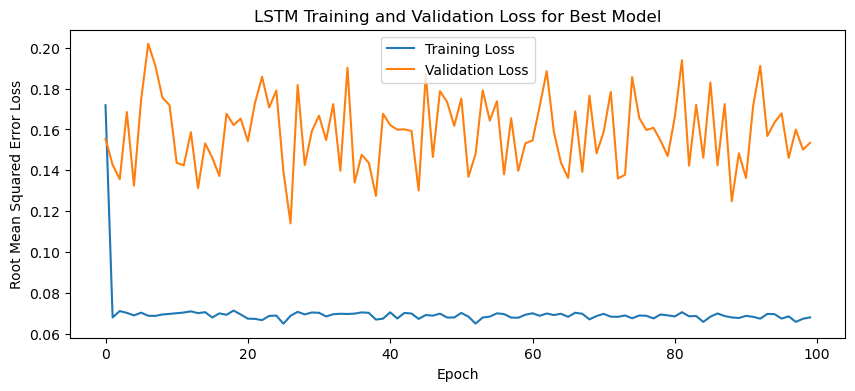

1/1 - 2s - loss: 0.0532 - 2s/epoch - 2s/step
Test Loss: 0.05316821113228798
1/1 [==============================] - 0s 32ms/step


IndexError: index 10 is out of bounds for axis 0 with size 10

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)
    
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

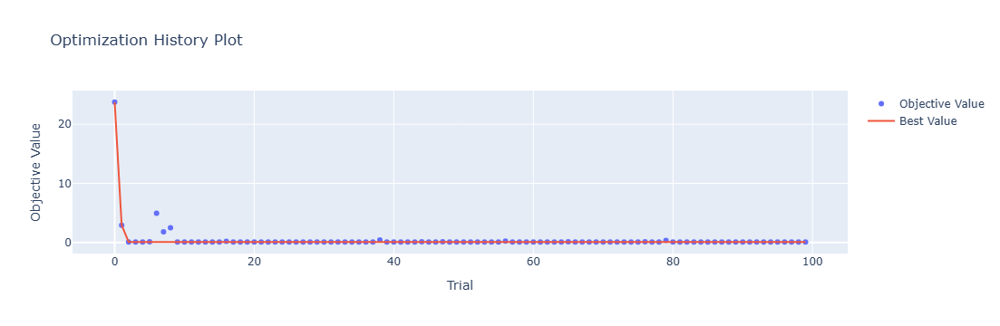

In [4]:
optuna.visualization.plot_optimization_history(study)

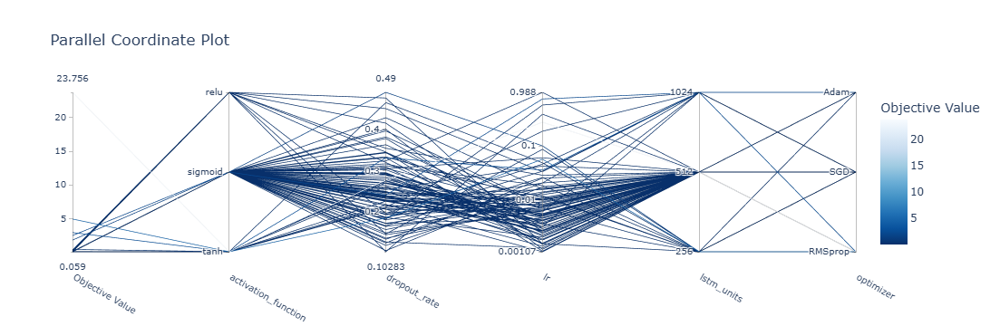

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

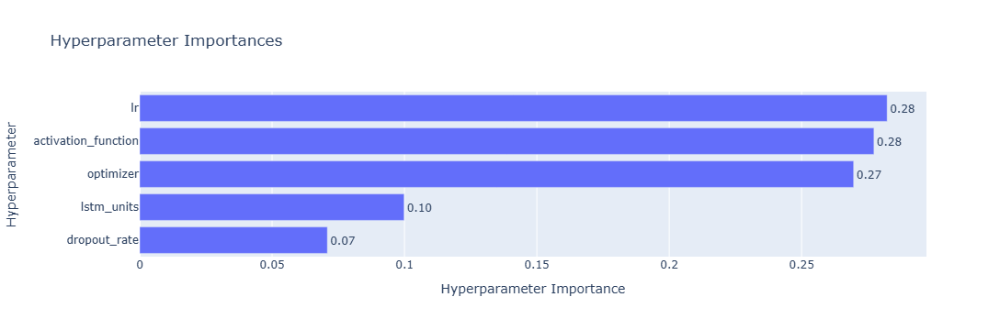

In [6]:
optuna.visualization.plot_param_importances(study)

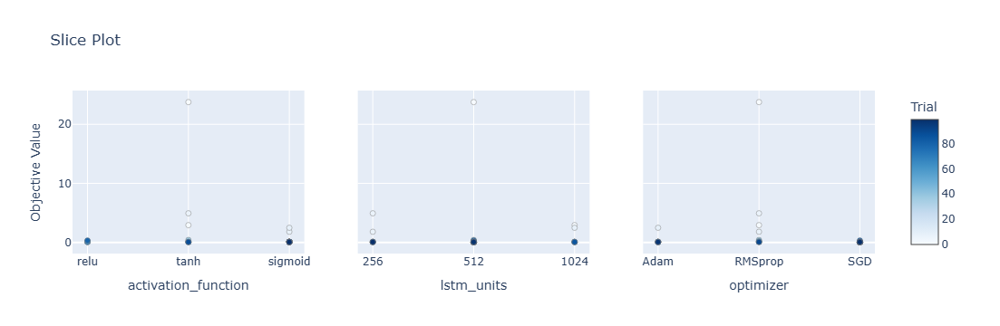

In [8]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

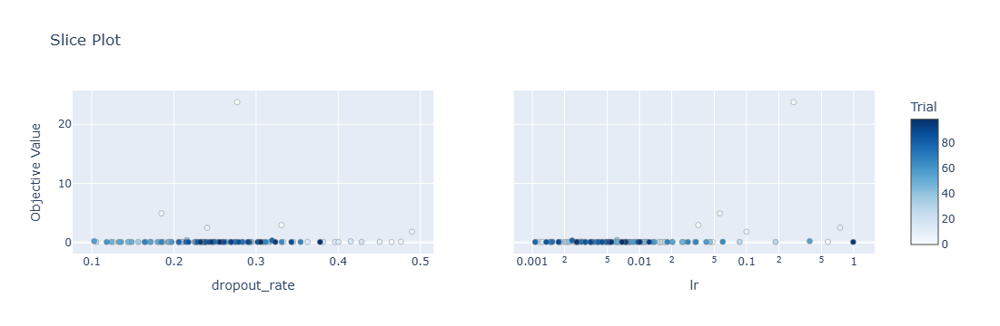

In [9]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[12.21  8.17 15.68 ... 23.86 20.59 15.82]
 [14.52 12.85 16.77 ... 26.49 23.17 21.15]
 [ 8.91  6.23 11.39 ... 22.62 16.72 14.05]
 ...
 [ 7.87  5.76 10.62 ... 21.07 15.24 12.04]
 [ 6.49  2.73  9.77 ... 21.93 16.5  11.44]
 [ 5.29  1.27  5.84 ... 22.11 15.37  9.87]]
Epoch 1/100
84/84 [==============================] - 46s 360ms/step - loss: 0.2049 - accuracy: 0.5119 - mae: 0.1590 - rmse: 0.2049 - mape: 32.6135 - pearson: 0.5952 - val_loss: 0.0693 - val_accuracy: 0.6000 - val_mae: 0.0538 - val_rmse: 0.0693 - val_mape: 12.7560 - val_pearson: 0.8271
Epoch 2/100
84/84 [==============================] - 21s 253ms/step - loss: 0.0686 - accuracy: 0.7024 - mae: 0.0537 - rmse: 0.0686 - mape: 12.1526 - pearson: 0.8143 - val_loss: 0.0794 - val_accuracy: 0.6000 - val_mae: 0.0620 - val_rmse: 0.0794 - val_mape: 14.3546 - val_pearson: 0.7551
Epoch 3/100
84/84 [==============================] - 22s 259ms/step - loss: 0.0697 - accuracy: 0.7262 - mae: 0.0549 - rmse: 0.0697 - mape: 12.2418 - pearson: 0.8123

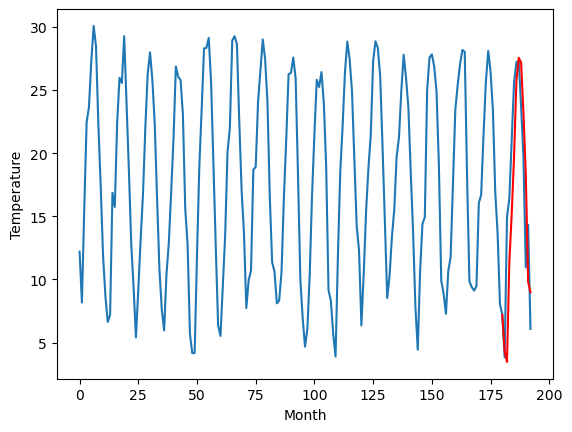

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.87		11.26		-1.61
12.78		10.40		-2.38
17.84		18.31		0.47
19.24		22.11		2.87
23.26		26.61		3.35
26.74		32.64		5.90
27.96		34.48		6.52
28.30		34.10		5.80
26.17		30.15		3.98
23.54		25.24		1.70
18.03		16.73		-1.30
17.79		15.93		-1.86
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[13.23, 11.257078669071198, 10.401196262836457, 18.30657222032547, 22.1092355465889, 26.6093576169014, 32.641404411792756, 34.47981872320175, 34.10152625203133, 30.146387330293656, 25.237280122041703, 16.727797738313676, 15.925401500463487]


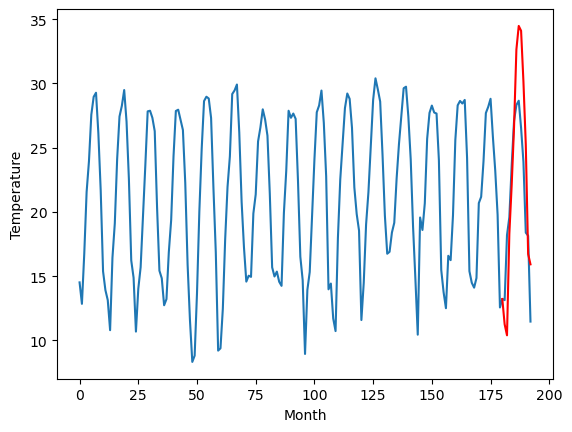

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.34		13.57		-1.77
16.20		12.72		-3.48
22.18		20.62		-1.56
23.82		24.43		0.61
27.80		28.94		1.14
31.94		34.97		3.03
33.70		36.81		3.11
33.98		36.43		2.45
30.41		32.48		2.07
26.53		27.57		1.04
18.17		19.06		0.89
20.35		18.26		-2.09
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.18, 13.565220494270324, 12.716865022182464, 20.62257476568222, 24.4323038649559, 28.93709178686142, 34.96943469762802, 36.807615478038784, 36.433763433694835, 32.4752654325962, 27.572600294351574, 19.056509901285168, 18.262030113935467]


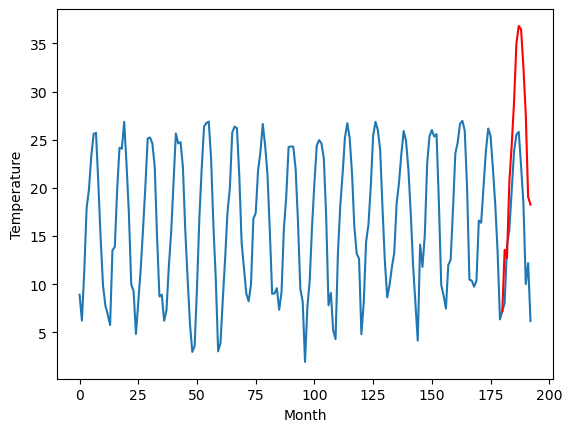

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.00		7.95		-1.05
7.43		7.09		-0.34
15.34		14.99		-0.35
17.13		18.80		1.67
21.10		23.30		2.20
24.38		29.33		4.95
25.01		31.17		6.16
25.06		30.79		5.73
22.55		26.83		4.28
20.24		21.92		1.68
12.15		13.41		1.26
14.92		12.61		-2.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.46, 7.950991008281708, 7.0936860179901124, 14.992043409347534, 18.799761209487915, 23.29923954963684, 29.333839330673218, 31.17219868659973, 30.78850332260132, 26.830207262039185, 21.920184049606323, 13.41144362449646, 12.61466810464859]


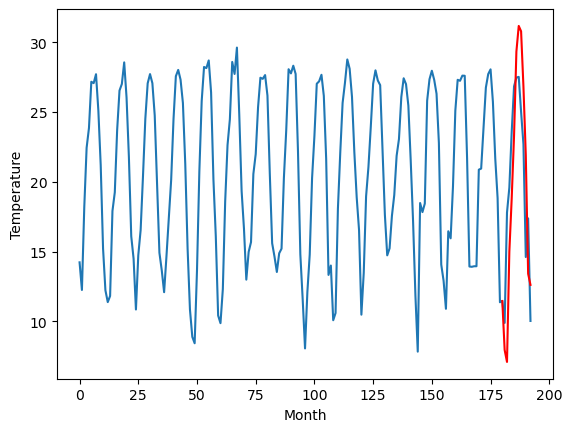

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.27		-0.08
10.26		12.42		2.16
20.16		20.32		0.16
22.09		24.12		2.03
25.95		28.62		2.67
31.15		34.65		3.50
31.58		36.49		4.91
32.34		36.11		3.77
30.33		32.15		1.82
25.98		27.24		1.26
18.41		18.73		0.32
20.74		17.94		-2.80
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.27, 13.273535947799683, 12.415924828052521, 20.317757408618927, 24.124058525562287, 28.624003689289093, 34.650960724353794, 36.492669503688816, 36.109843384027485, 32.14698041558266, 27.244627128839497, 18.733256469964985, 17.93570489764214]


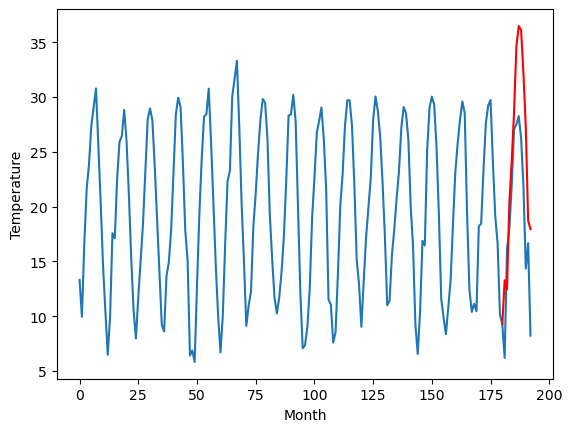

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.52		12.34		0.82
12.17		11.49		-0.68
17.07		19.40		2.33
20.44		23.20		2.76
23.95		27.70		3.75
28.52		33.73		5.21
30.51		35.57		5.06
30.99		35.19		4.20
27.98		31.22		3.24
24.38		26.32		1.94
16.21		17.81		1.60
17.26		17.02		-0.24
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.77, 12.33785640001297, 11.492115545272828, 19.395476388931275, 23.20244483947754, 27.698828983306885, 33.7269061088562, 35.56680970191955, 35.1882385790348, 31.21839328408241, 26.323716121912, 17.810453373193738, 17.019908744096753]


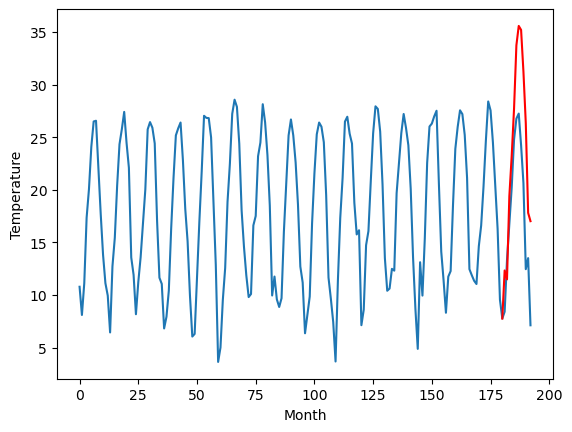

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.21		9.83		-0.38
10.85		8.98		-1.87
17.83		16.88		-0.95
18.86		20.68		1.82
22.57		25.18		2.61
26.90		31.22		4.32
28.52		33.06		4.54
28.46		32.68		4.22
24.41		28.72		4.31
21.18		23.82		2.64
12.53		15.30		2.77
14.47		14.51		0.04
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 9.826725223064422, 8.976307489871978, 16.87805137872696, 20.68469987154007, 25.183636524677276, 31.21541629076004, 33.0560636305809, 32.68125990867615, 28.716156044006347, 23.817440547943114, 15.303380527496337, 14.51086590528488]


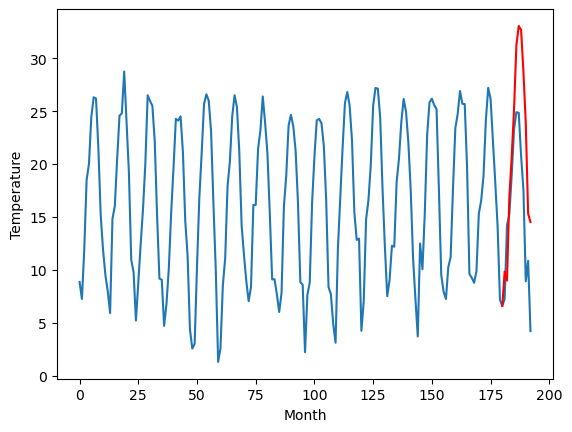

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.91		7.89		-0.02
8.53		7.03		-1.50
15.05		14.93		-0.12
18.68		18.74		0.06
21.70		23.24		1.54
26.49		29.27		2.78
28.61		31.11		2.50
28.56		30.74		2.18
24.05		26.77		2.72
20.20		21.88		1.68
10.70		13.37		2.67
12.76		12.57		-0.19
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.3, 7.886048293113708, 7.029333925247192, 14.931027269363403, 18.736243343353273, 23.238694286346437, 29.268766975402833, 31.10952410697937, 30.737824565172197, 26.77406299710274, 21.879131680727006, 13.365076428651811, 12.57023954987526]


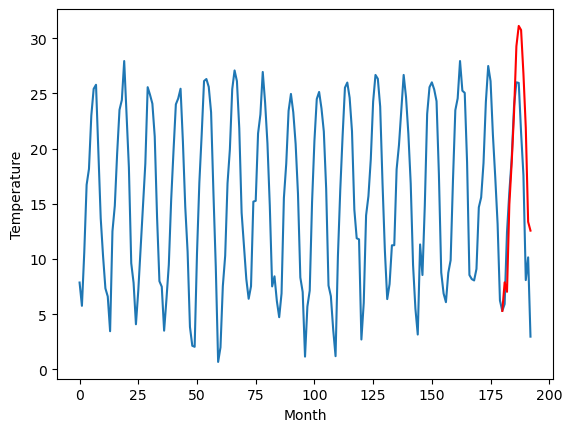

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.08		6.90		-0.18
2.81		6.03		3.22
15.28		13.94		-1.34
17.88		17.75		-0.13
22.57		22.24		-0.33
28.76		28.26		-0.50
29.33		30.12		0.79
29.27		29.74		0.47
25.53		25.78		0.25
21.57		20.90		-0.67
11.53		12.38		0.85
13.33		11.59		-1.74
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.1, 6.897831614017487, 6.03355299949646, 13.936545248031617, 17.746415729522706, 22.24222480773926, 28.262335414886476, 30.12072479248047, 29.74129032611847, 25.779042477607728, 20.896129841804505, 12.381069416999818, 11.590780849456788]


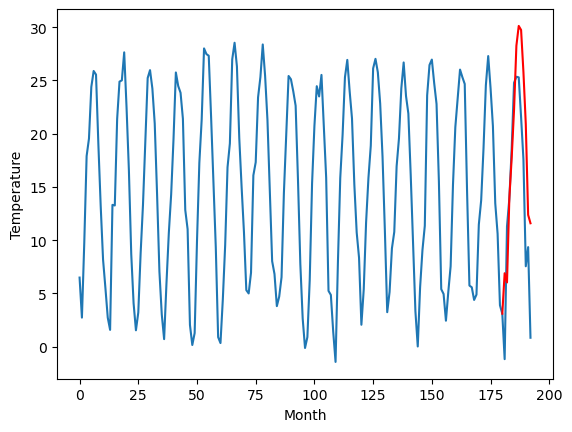

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.90		5.52		0.62
2.73		4.65		1.92
13.48		12.55		-0.93
16.54		16.37		-0.17
21.01		20.86		-0.15
27.49		26.88		-0.61
28.50		28.74		0.24
29.10		28.36		-0.74
25.24		24.40		-0.84
20.77		19.52		-1.25
10.11		11.00		0.89
11.34		10.21		-1.13
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.6, 5.51847421169281, 4.649739494323731, 12.551687469482422, 16.365017166137697, 20.86017107009888, 26.88235019683838, 28.737906208038332, 28.358995636701586, 24.399708708524706, 19.520235499143602, 11.00102086901665, 10.213785489797594]


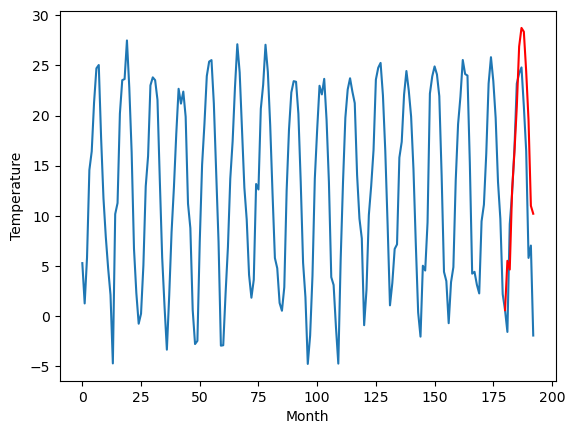

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.68		4.32		0.64
-0.63		3.45		4.08
11.10		11.35		0.25
15.07		15.17		0.10
20.22		19.67		-0.55
27.53		25.70		-1.83
28.12		27.56		-0.56
28.83		27.18		-1.65
24.78		23.22		-1.56
20.43		18.34		-2.09
9.57		9.82		0.25
8.67		9.04		0.37
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.75, 4.321997323036194, 3.447126843929291, 11.354204156398772, 15.174711682796477, 19.67143914937973, 25.697868325710296, 27.55827484369278, 27.17504648208618, 23.220275440216064, 18.342498817443847, 9.821768798828124, 9.035417356491088]


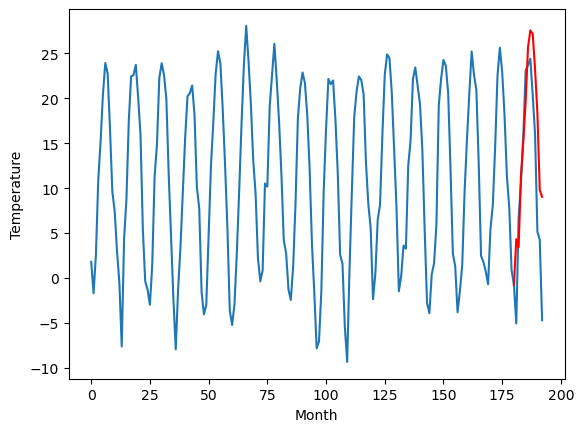

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.43   4.331820
1                 1   12.87  11.257079
2                 2   15.34  13.565220
3                 3    9.00   7.950991
4                 4   13.35  13.273536
5                 5   11.52  12.337856
6                 6   10.21   9.826725
7                 7    7.91   7.886048
8                 8    7.08   6.897832
9                 9    4.90   5.518474
10               10    3.68   4.321997


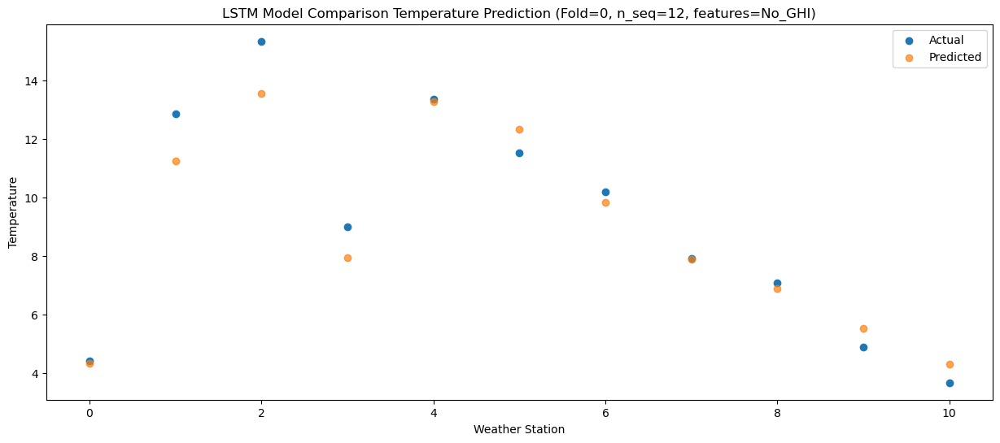

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.08   3.470758
1                 1   12.78  10.401196
2                 2   16.20  12.716865
3                 3    7.43   7.093686
4                 4   10.26  12.415925
5                 5   12.17  11.492116
6                 6   10.85   8.976307
7                 7    8.53   7.029334
8                 8    2.81   6.033553
9                 9    2.73   4.649739
10               10   -0.63   3.447127


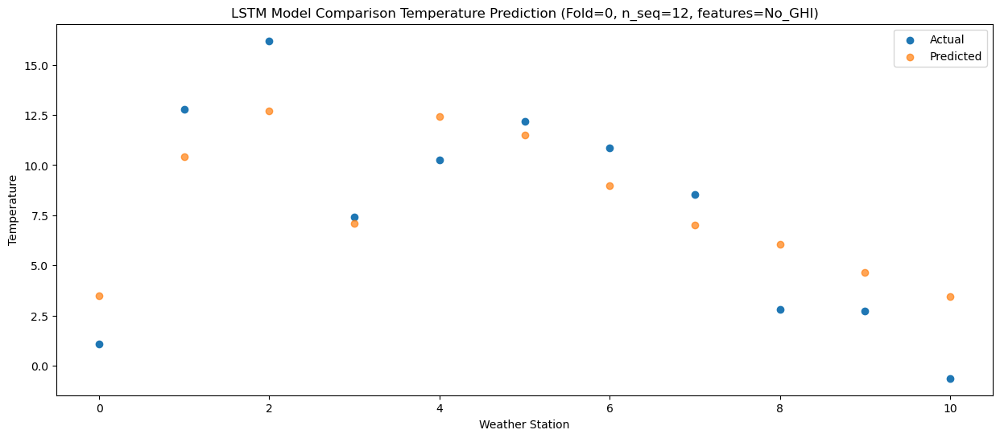

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   12.15  11.379702
1                 1   17.84  18.306572
2                 2   22.18  20.622575
3                 3   15.34  14.992043
4                 4   20.16  20.317757
5                 5   17.07  19.395476
6                 6   17.83  16.878051
7                 7   15.05  14.931027
8                 8   15.28  13.936545
9                 9   13.48  12.551687
10               10   11.10  11.354204


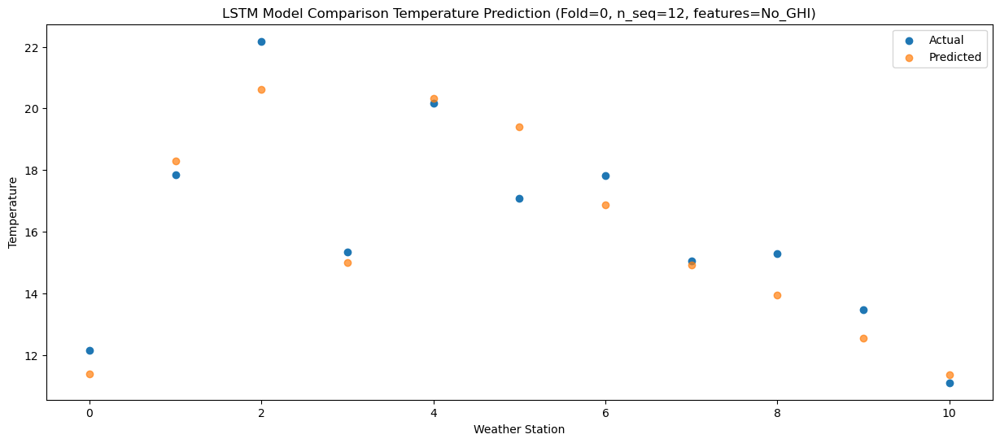

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.68  15.175505
1                 1   19.24  22.109236
2                 2   23.82  24.432304
3                 3   17.13  18.799761
4                 4   22.09  24.124059
5                 5   20.44  23.202445
6                 6   18.86  20.684700
7                 7   18.68  18.736243
8                 8   17.88  17.746416
9                 9   16.54  16.365017
10               10   15.07  15.174712


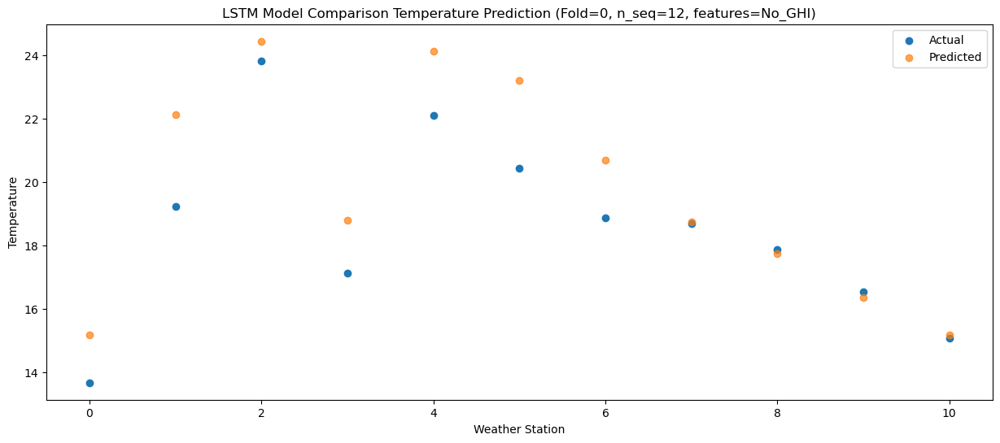

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   18.18  19.686519
1                 1   23.26  26.609358
2                 2   27.80  28.937092
3                 3   21.10  23.299240
4                 4   25.95  28.624004
5                 5   23.95  27.698829
6                 6   22.57  25.183637
7                 7   21.70  23.238694
8                 8   22.57  22.242225
9                 9   21.01  20.860171
10               10   20.22  19.671439


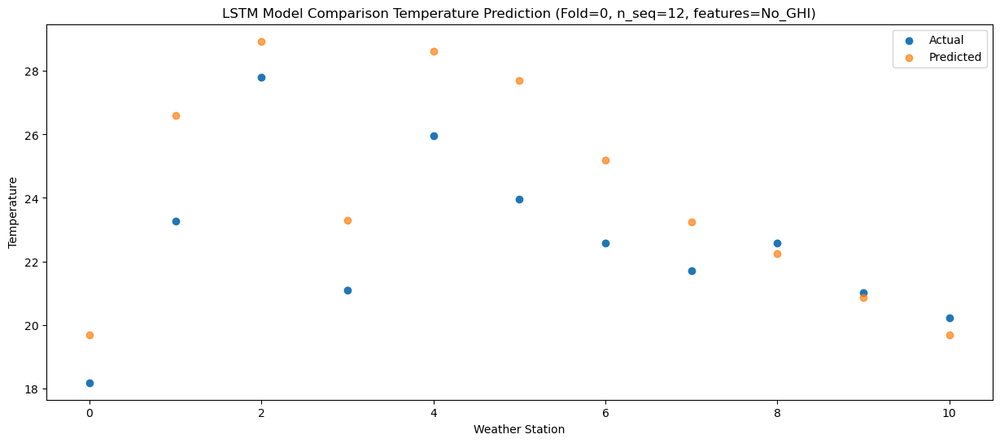

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   22.85  25.710452
1                 1   26.74  32.641404
2                 2   31.94  34.969435
3                 3   24.38  29.333839
4                 4   31.15  34.650961
5                 5   28.52  33.726906
6                 6   26.90  31.215416
7                 7   26.49  29.268767
8                 8   28.76  28.262335
9                 9   27.49  26.882350
10               10   27.53  25.697868


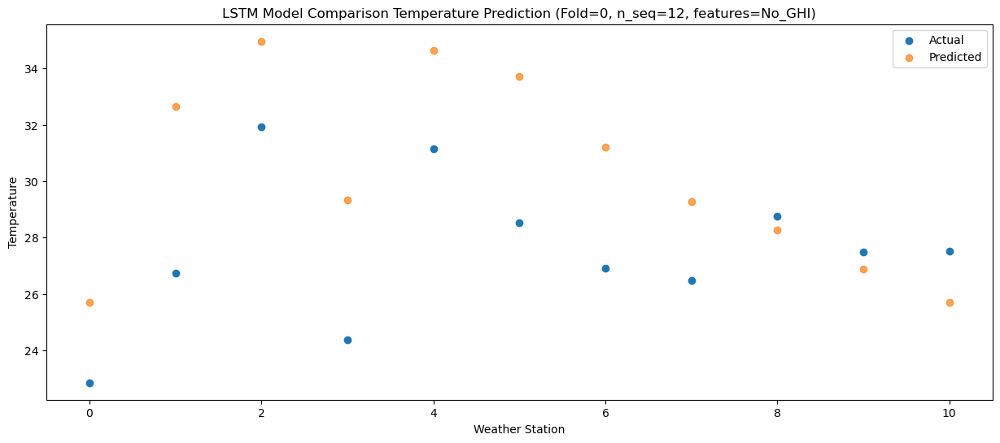

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   24.44  27.554500
1                 1   27.96  34.479819
2                 2   33.70  36.807615
3                 3   25.01  31.172199
4                 4   31.58  36.492670
5                 5   30.51  35.566810
6                 6   28.52  33.056064
7                 7   28.61  31.109524
8                 8   29.33  30.120725
9                 9   28.50  28.737906
10               10   28.12  27.558275


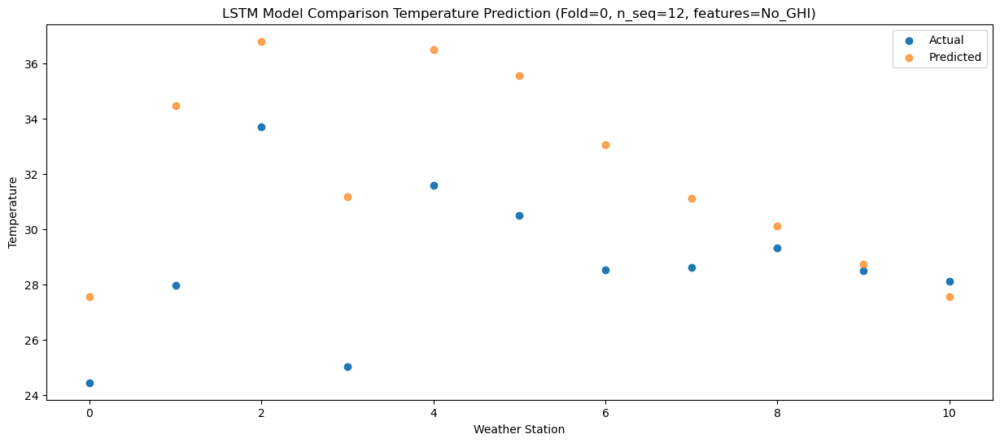

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   24.55  27.176737
1                 1   28.30  34.101526
2                 2   33.98  36.433763
3                 3   25.06  30.788503
4                 4   32.34  36.109843
5                 5   30.99  35.188239
6                 6   28.46  32.681260
7                 7   28.56  30.737825
8                 8   29.27  29.741290
9                 9   29.10  28.358996
10               10   28.83  27.175046


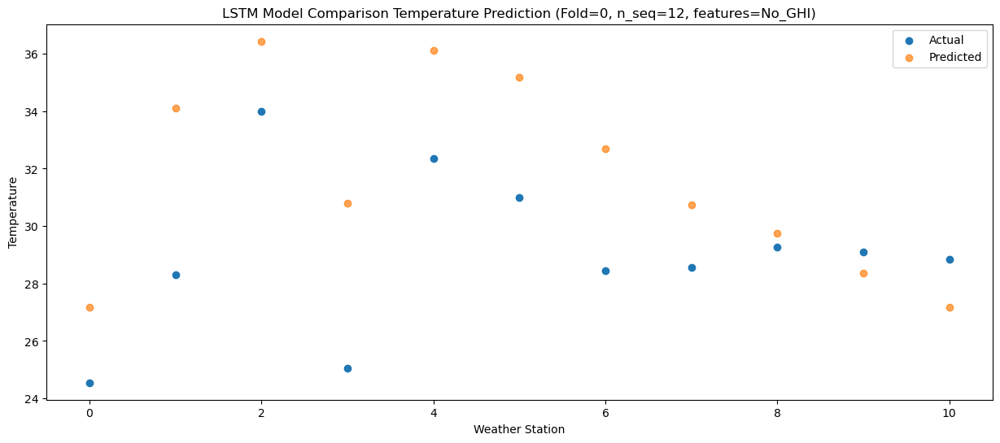

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   20.97  23.217938
1                 1   26.17  30.146387
2                 2   30.41  32.475265
3                 3   22.55  26.830207
4                 4   30.33  32.146980
5                 5   27.98  31.218393
6                 6   24.41  28.716156
7                 7   24.05  26.774063
8                 8   25.53  25.779042
9                 9   25.24  24.399709
10               10   24.78  23.220275


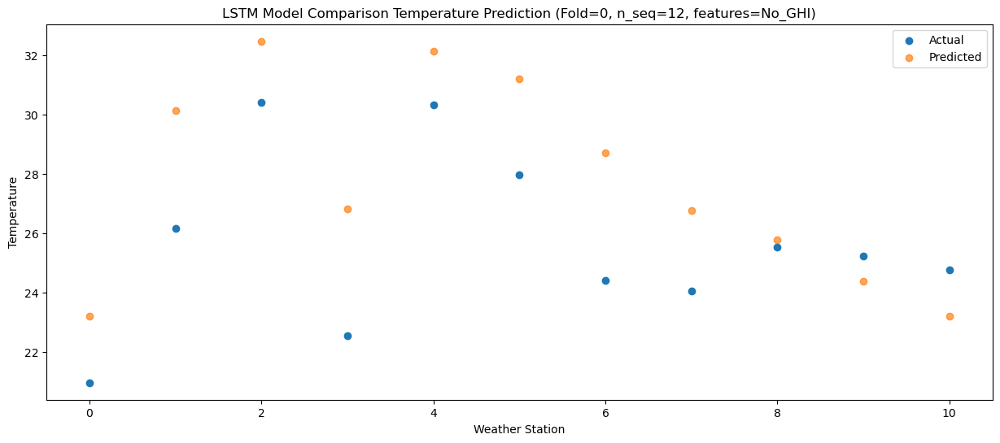

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   16.95  18.316669
1                 1   23.54  25.237280
2                 2   26.53  27.572600
3                 3   20.24  21.920184
4                 4   25.98  27.244627
5                 5   24.38  26.323716
6                 6   21.18  23.817441
7                 7   20.20  21.879132
8                 8   21.57  20.896130
9                 9   20.77  19.520235
10               10   20.43  18.342499


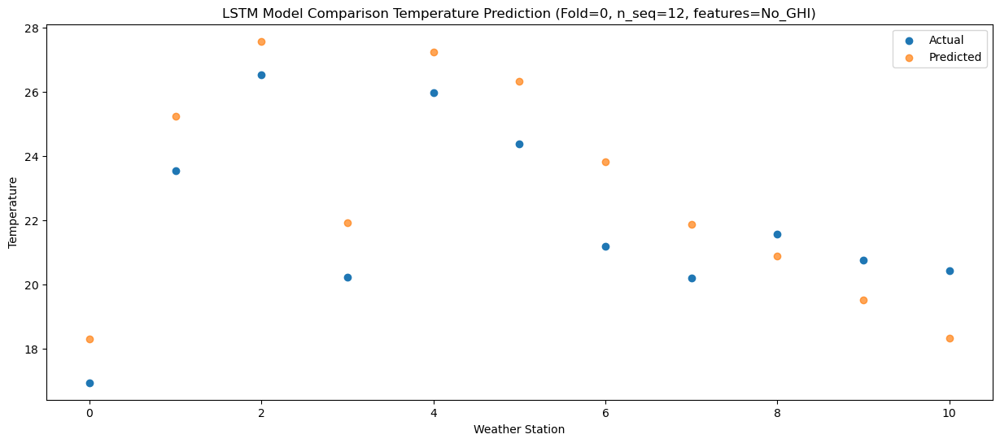

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    8.19   9.794133
1                 1   18.03  16.727798
2                 2   18.17  19.056510
3                 3   12.15  13.411444
4                 4   18.41  18.733256
5                 5   16.21  17.810453
6                 6   12.53  15.303381
7                 7   10.70  13.365076
8                 8   11.53  12.381069
9                 9   10.11  11.001021
10               10    9.57   9.821769


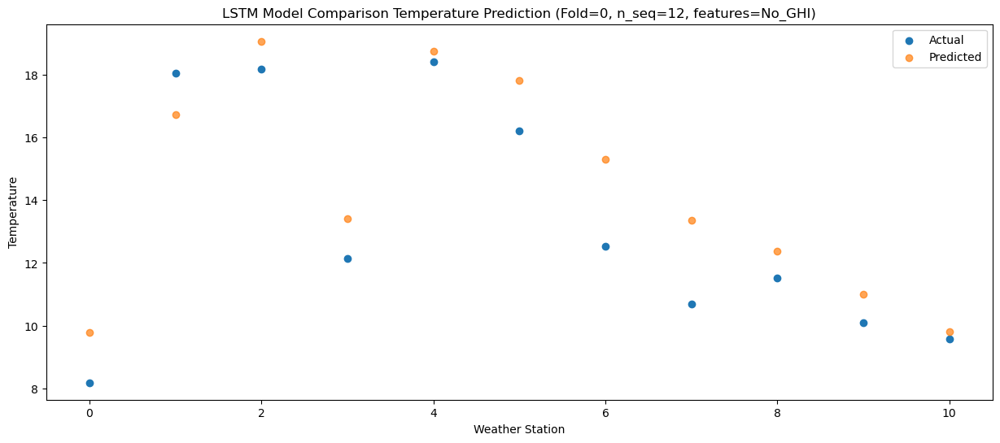

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   11.57   8.995217
1                 1   17.79  15.925402
2                 2   20.35  18.262030
3                 3   14.92  12.614668
4                 4   20.74  17.935705
5                 5   17.26  17.019909
6                 6   14.47  14.510866
7                 7   12.76  12.570240
8                 8   13.33  11.590781
9                 9   11.34  10.213785
10               10    8.67   9.035417


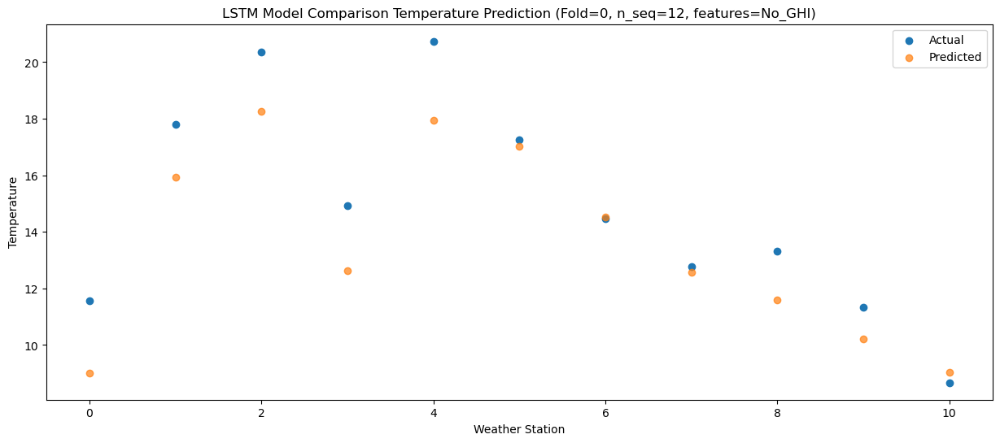

f, t:
[[ 4.43 12.87 15.34  9.   13.35 11.52 10.21  7.91  7.08  4.9   3.68]
 [ 1.08 12.78 16.2   7.43 10.26 12.17 10.85  8.53  2.81  2.73 -0.63]
 [12.15 17.84 22.18 15.34 20.16 17.07 17.83 15.05 15.28 13.48 11.1 ]
 [13.68 19.24 23.82 17.13 22.09 20.44 18.86 18.68 17.88 16.54 15.07]
 [18.18 23.26 27.8  21.1  25.95 23.95 22.57 21.7  22.57 21.01 20.22]
 [22.85 26.74 31.94 24.38 31.15 28.52 26.9  26.49 28.76 27.49 27.53]
 [24.44 27.96 33.7  25.01 31.58 30.51 28.52 28.61 29.33 28.5  28.12]
 [24.55 28.3  33.98 25.06 32.34 30.99 28.46 28.56 29.27 29.1  28.83]
 [20.97 26.17 30.41 22.55 30.33 27.98 24.41 24.05 25.53 25.24 24.78]
 [16.95 23.54 26.53 20.24 25.98 24.38 21.18 20.2  21.57 20.77 20.43]
 [ 8.19 18.03 18.17 12.15 18.41 16.21 12.53 10.7  11.53 10.11  9.57]
 [11.57 17.79 20.35 14.92 20.74 17.26 14.47 12.76 13.33 11.34  8.67]]
[[ 4.33182005 11.25707867 13.56522049  7.95099101 13.27353595 12.3378564
   9.82672522  7.88604829  6.89783161  5.51847421  4.32199732]
 [ 3.47075842 10.40119626 12.

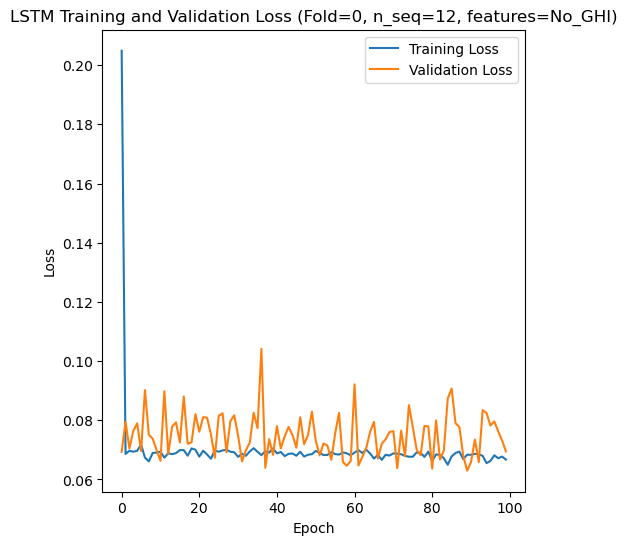

[[12.2  10.03 13.86 ... 24.46 19.58 17.03]
 [ 8.35  6.22 11.74 ... 22.47 18.02 13.98]
 [10.82  7.37 13.36 ... 24.57 19.57 16.15]
 ...
 [ 7.69  4.56 11.66 ... 25.3  19.83 13.28]
 [ 8.93  6.7  14.14 ... 25.37 21.51 12.55]
 [ 7.96  5.46 11.14 ... 25.13 20.28 10.63]]
Epoch 1/100
84/84 [==============================] - 52s 344ms/step - loss: 0.3089 - accuracy: 0.4405 - mae: 0.2762 - rmse: 0.3089 - mape: 61.3157 - pearson: 0.6062 - val_loss: 0.0650 - val_accuracy: 0.8000 - val_mae: 0.0492 - val_rmse: 0.0650 - val_mape: 11.1522 - val_pearson: 0.8307
Epoch 2/100
84/84 [==============================] - 21s 247ms/step - loss: 0.0702 - accuracy: 0.6905 - mae: 0.0546 - rmse: 0.0702 - mape: 12.3151 - pearson: 0.8064 - val_loss: 0.0667 - val_accuracy: 0.8000 - val_mae: 0.0504 - val_rmse: 0.0667 - val_mape: 11.1598 - val_pearson: 0.8236
Epoch 3/100
84/84 [==============================] - 20s 243ms/step - loss: 0.0699 - accuracy: 0.6667 - mae: 0.0548 - rmse: 0.0699 - mape: 12.3273 - pearson: 0.8158

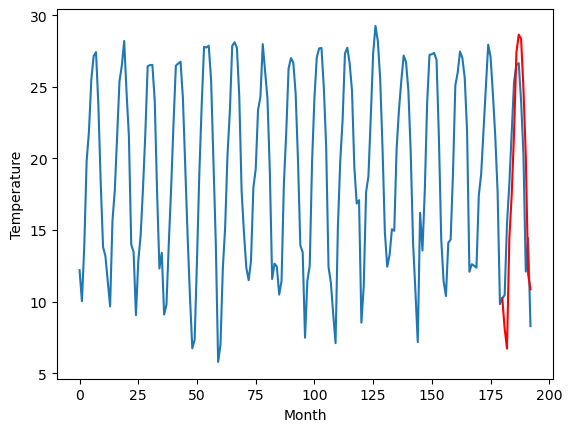

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.00		12.35		0.35
12.66		10.95		-1.71
19.43		18.65		-0.78
21.57		21.68		0.11
25.30		26.02		0.72
29.44		31.62		2.18
30.82		32.87		2.05
31.09		32.59		1.50
27.35		29.12		1.77
23.57		24.39		0.82
15.91		16.15		0.24
17.54		15.10		-2.44
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.41, 12.35103107690811, 10.946072828769683, 18.649444353580474, 21.67612887620926, 26.017403137683868, 31.622869503498077, 32.87103308439255, 32.58901293277741, 29.121245932579043, 24.39181001186371, 16.14859826564789, 15.096306991577151]


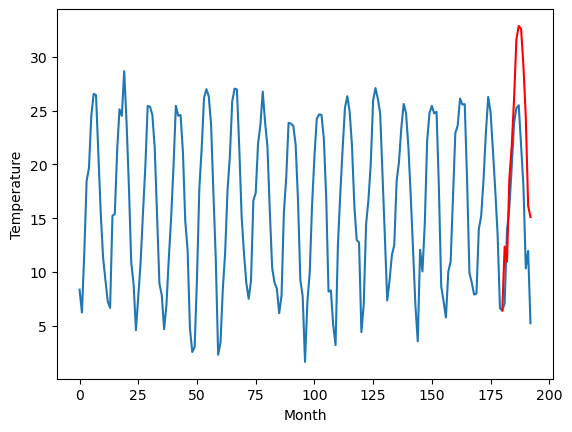

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.77		8.50		-0.27
9.26		7.09		-2.17
16.32		14.80		-1.52
17.72		17.83		0.11
21.84		22.16		0.32
25.72		27.78		2.06
26.49		29.02		2.53
27.15		28.75		1.60
24.13		25.28		1.15
20.35		20.55		0.20
12.61		12.31		-0.30
15.21		11.26		-3.95
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.6, 8.496818041801452, 7.093969321250915, 14.797471976280212, 17.827641463279726, 22.163945174217226, 27.777088141441347, 29.023731207847597, 28.746820306777956, 25.282809352874757, 20.548341369628908, 12.306205368041994, 11.256744718551637]


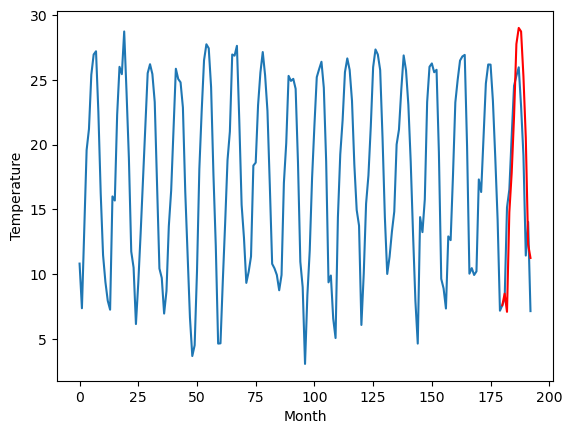

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.72		10.97		0.25
9.13		9.56		0.43
16.50		17.27		0.77
18.84		20.29		1.45
22.73		24.63		1.90
26.62		30.24		3.62
26.50		31.49		4.99
27.47		31.22		3.75
24.46		27.76		3.30
21.77		23.02		1.25
14.61		14.78		0.17
17.98		13.72		-4.26
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.89, 10.968927494883538, 9.564276449084282, 17.266745797991753, 20.291492931246758, 24.627014152407646, 30.240972988009453, 31.485972396731377, 31.220165483355522, 27.75699114024639, 23.020147554278374, 14.776494256854058, 13.721932165026665]


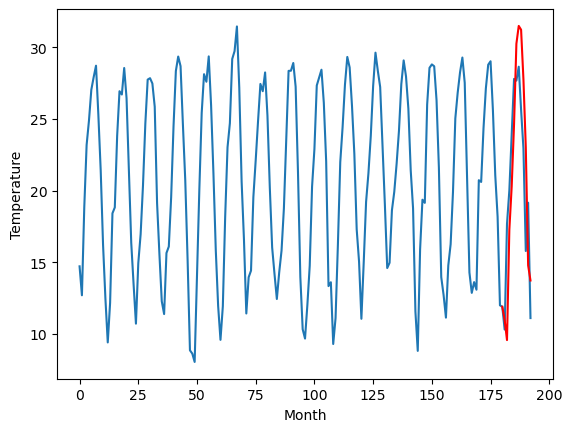

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.70		14.85		0.15
13.00		13.45		0.45
20.61		21.16		0.55
22.91		24.19		1.28
27.03		28.52		1.49
30.50		34.14		3.64
30.59		35.39		4.80
31.56		35.12		3.56
27.98		31.66		3.68
24.94		26.92		1.98
17.39		18.68		1.29
21.27		17.63		-3.64
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.96, 14.854403323531152, 13.451763934493066, 21.161923713088036, 24.18616992890835, 28.52198488175869, 34.14003164231777, 35.38767857015133, 35.12167499125004, 31.65937039911747, 26.92346141397953, 18.6765637165308, 17.625869250893594]


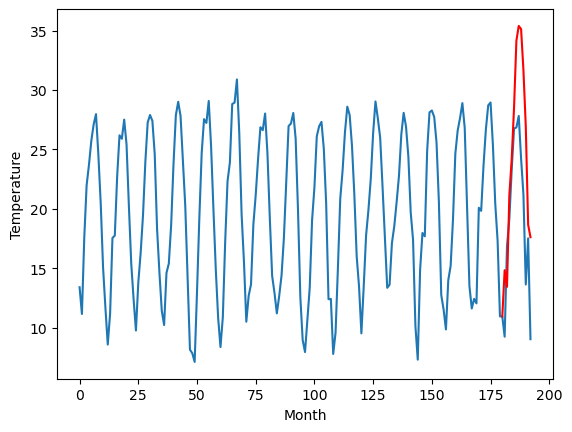

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.91		13.56		1.65
12.29		12.15		-0.14
19.63		19.85		0.22
21.90		22.88		0.98
27.49		27.22		-0.27
31.76		32.85		1.09
31.10		34.09		2.99
30.51		33.83		3.32
30.15		30.37		0.22
25.83		25.64		-0.19
19.36		17.39		-1.97
19.62		16.33		-3.29
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 13.560364453196526, 12.149792162775993, 19.85089394271374, 22.877273051142694, 27.22393032729626, 32.84959694564343, 34.09274121940136, 33.831737337708475, 30.37299805700779, 25.636807261109354, 17.3945701700449, 16.334017215371134]


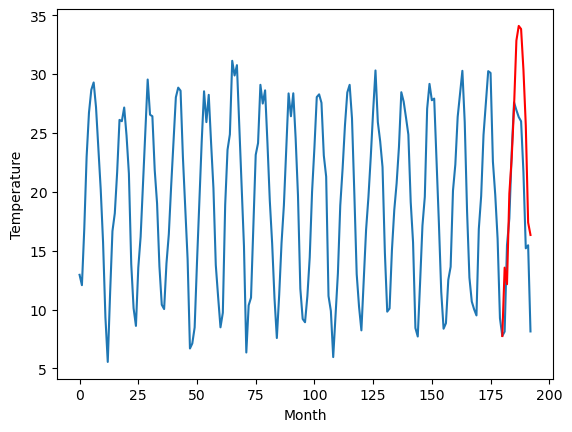

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.75		13.09		0.34
13.53		11.68		-1.85
19.81		19.38		-0.43
22.38		22.42		0.04
26.15		26.76		0.61
30.16		32.39		2.23
31.52		33.63		2.11
31.78		33.36		1.58
28.45		29.90		1.45
24.50		25.16		0.66
16.90		16.92		0.02
18.42		15.87		-2.55
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.17, 13.08839979469776, 11.682535555958747, 19.384457018971442, 22.417970803380012, 26.76405682861805, 32.38709369003773, 33.629887726902965, 33.364440855383876, 29.89846533238888, 25.1614319652319, 16.921716389060023, 15.86635297238827]


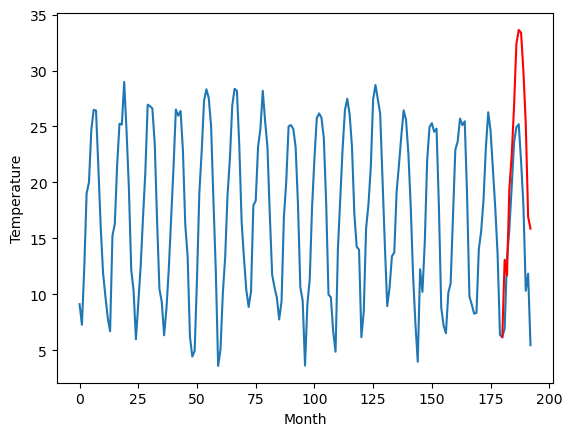

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.81		9.26		0.45
5.81		7.86		2.05
17.13		15.56		-1.57
18.84		18.59		-0.25
23.50		22.93		-0.57
29.58		28.56		-1.02
30.57		29.80		-0.77
31.79		29.54		-2.25
28.08		26.07		-2.01
22.88		21.34		-1.54
13.58		13.09		-0.49
15.99		12.04		-3.95
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.57, 9.261804665327071, 7.858323897123336, 15.563237513303756, 18.593401278257367, 22.934980715513227, 28.561796034574506, 29.79597612738609, 29.536401684284208, 26.07344167947769, 21.337102110385892, 13.094396765232084, 12.041116411685941]


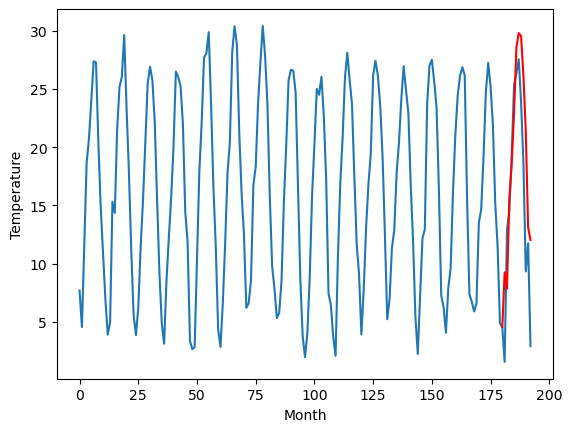

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.34		7.84		0.50
2.56		6.43		3.87
15.12		14.14		-0.98
16.92		17.17		0.25
21.73		21.51		-0.22
27.76		27.14		-0.62
29.27		28.38		-0.89
29.66		28.12		-1.54
27.15		24.66		-2.49
20.90		19.92		-0.98
13.15		11.67		-1.48
12.34		10.62		-1.72
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.46, 7.835943343639374, 6.428032281398774, 14.135581853389741, 17.16658509016037, 21.508096339702607, 27.142210605144502, 28.377872111797334, 28.120460929870607, 24.664882125854493, 19.91954607009888, 11.671305599212648, 10.615895214080812]


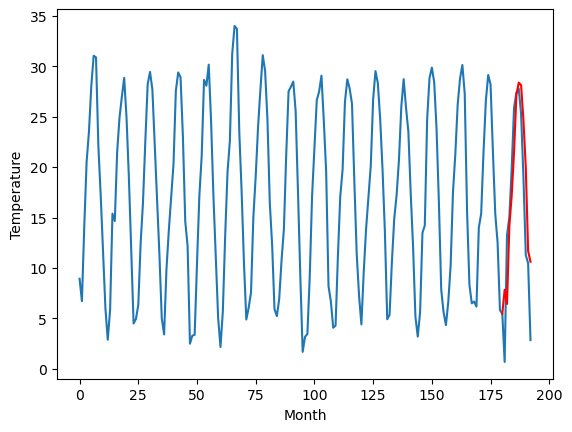

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.04		9.08		0.04
4.67		7.67		3.00
15.38		15.38		0.00
19.14		18.41		-0.73
23.69		22.75		-0.94
30.80		28.40		-2.40
31.47		29.64		-1.83
31.32		29.38		-1.94
29.37		25.93		-3.44
21.93		21.17		-0.76
15.68		12.93		-2.75
14.07		11.87		-2.20
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.42, 9.075395427942276, 7.667666398286819, 15.383903943300247, 18.4133143055439, 22.754422150850296, 28.396150552034378, 29.635079942941665, 29.383110694885254, 25.925707988739013, 21.173440628051758, 12.934727363586425, 11.87015610218048]


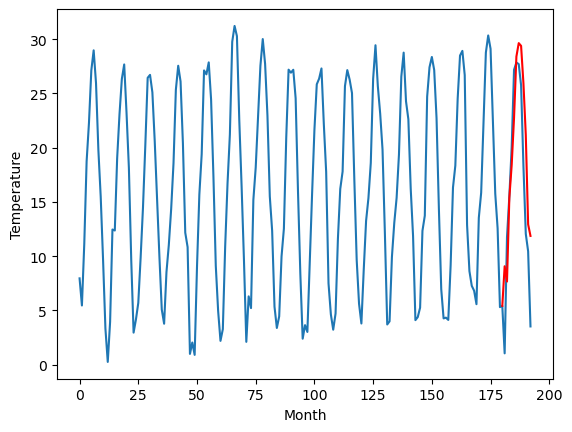

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.12		8.10		1.98
5.16		6.70		1.54
12.38		14.41		2.03
17.03		17.44		0.41
21.57		21.79		0.22
27.66		27.42		-0.24
29.89		28.66		-1.23
29.67		28.40		-1.27
25.97		24.93		-1.04
21.55		20.19		-1.36
12.23		11.94		-0.29
11.46		10.88		-0.58
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.17, 8.100577733516694, 6.695143959522248, 14.40842702150345, 17.443396589756013, 21.787854692935944, 27.41508486032486, 28.656689188480378, 28.398632249832154, 24.92755838394165, 20.1860799407959, 11.939171752929688, 10.876940808296204]


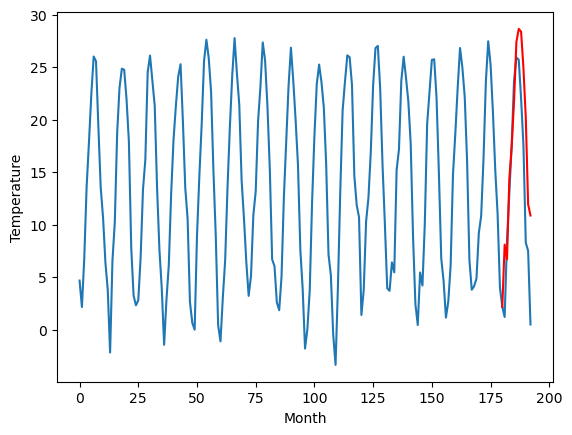

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.38   8.123465
1                 1   12.00  12.351031
2                 2    8.77   8.496818
3                 3   10.72  10.968927
4                 4   14.70  14.854403
5                 5   11.91  13.560364
6                 6   12.75  13.088400
7                 7    8.81   9.261805
8                 8    7.34   7.835943
9                 9    9.04   9.075395
10               10    6.12   8.100578


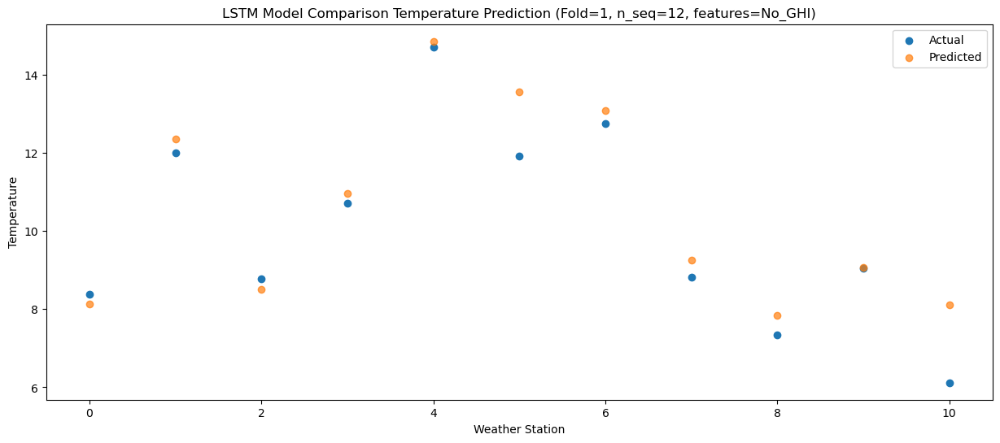

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    8.60   6.718462
1                 1   12.66  10.946073
2                 2    9.26   7.093969
3                 3    9.13   9.564276
4                 4   13.00  13.451764
5                 5   12.29  12.149792
6                 6   13.53  11.682536
7                 7    5.81   7.858324
8                 8    2.56   6.428032
9                 9    4.67   7.667666
10               10    5.16   6.695144


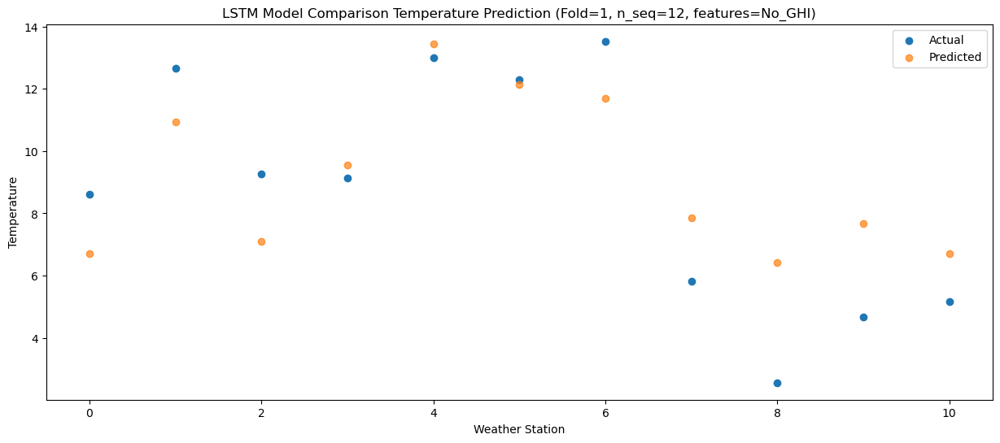

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   13.58  14.421692
1                 1   19.43  18.649444
2                 2   16.32  14.797472
3                 3   16.50  17.266746
4                 4   20.61  21.161924
5                 5   19.63  19.850894
6                 6   19.81  19.384457
7                 7   17.13  15.563238
8                 8   15.12  14.135582
9                 9   15.38  15.383904
10               10   12.38  14.408427


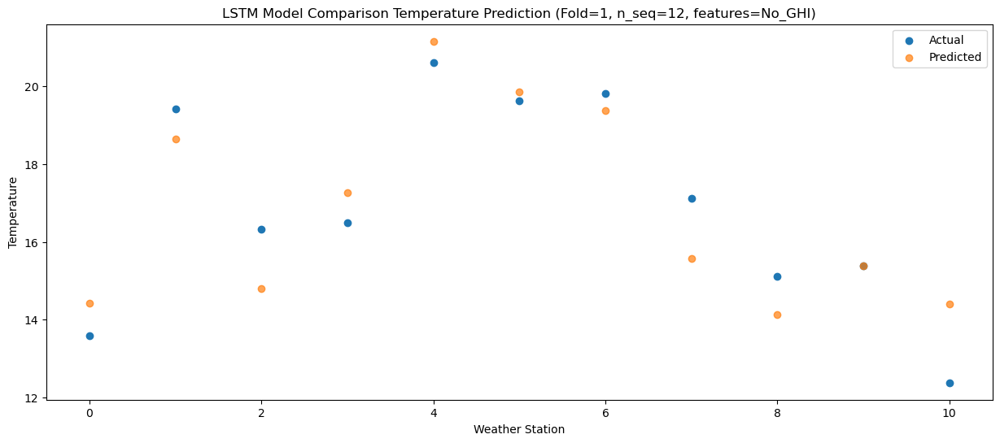

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   16.39  17.444768
1                 1   21.57  21.676129
2                 2   17.72  17.827641
3                 3   18.84  20.291493
4                 4   22.91  24.186170
5                 5   21.90  22.877273
6                 6   22.38  22.417971
7                 7   18.84  18.593401
8                 8   16.92  17.166585
9                 9   19.14  18.413314
10               10   17.03  17.443397


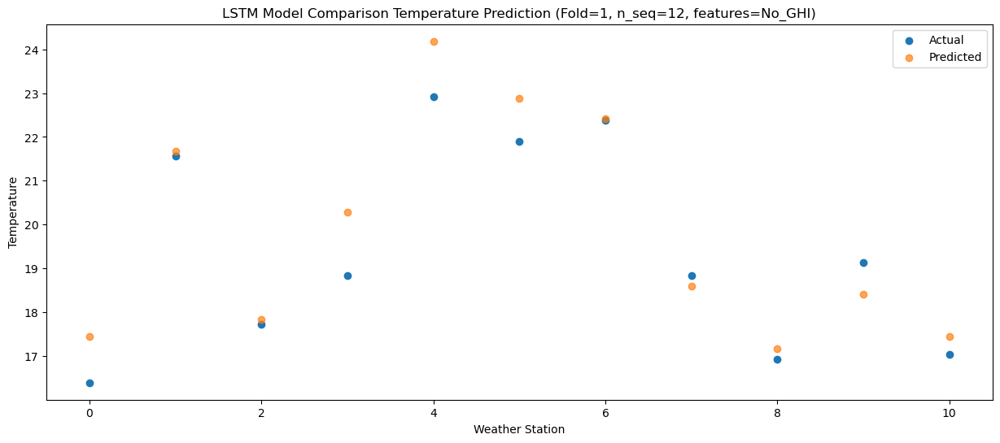

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   20.00  21.788739
1                 1   25.30  26.017403
2                 2   21.84  22.163945
3                 3   22.73  24.627014
4                 4   27.03  28.521985
5                 5   27.49  27.223930
6                 6   26.15  26.764057
7                 7   23.50  22.934981
8                 8   21.73  21.508096
9                 9   23.69  22.754422
10               10   21.57  21.787855


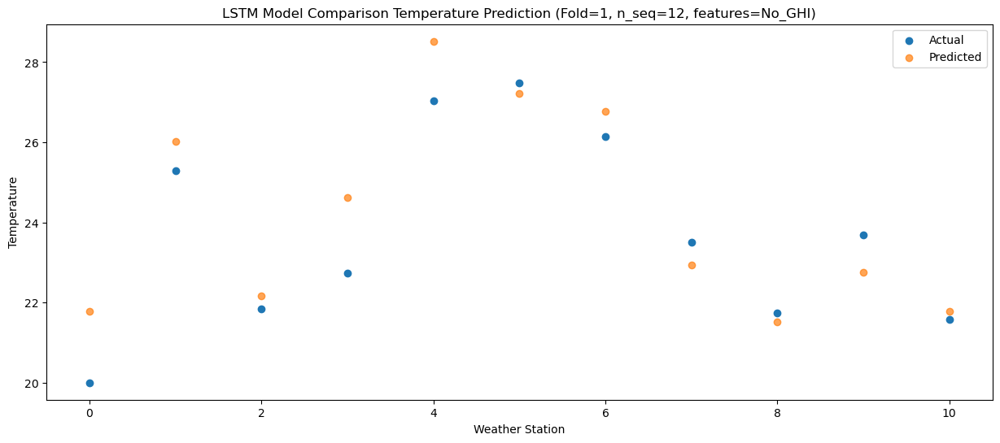

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   23.49  27.395951
1                 1   29.44  31.622870
2                 2   25.72  27.777088
3                 3   26.62  30.240973
4                 4   30.50  34.140032
5                 5   31.76  32.849597
6                 6   30.16  32.387094
7                 7   29.58  28.561796
8                 8   27.76  27.142211
9                 9   30.80  28.396151
10               10   27.66  27.415085


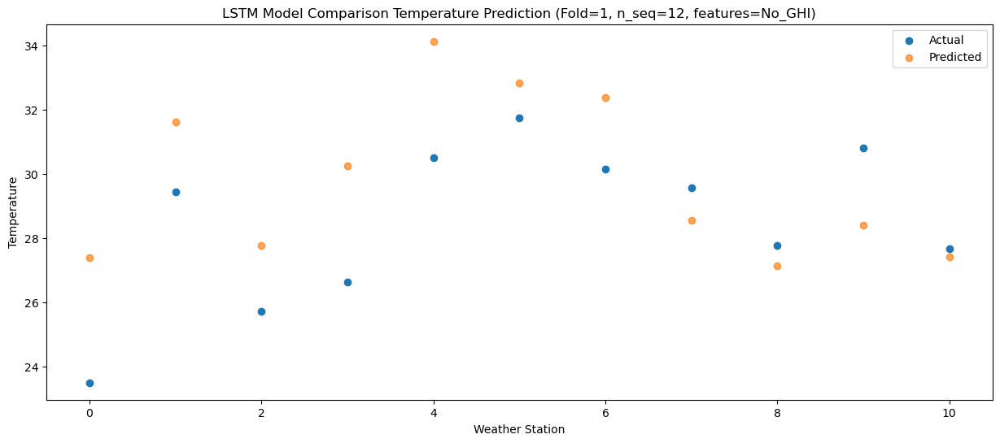

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   24.69  28.650261
1                 1   30.82  32.871033
2                 2   26.49  29.023731
3                 3   26.50  31.485972
4                 4   30.59  35.387679
5                 5   31.10  34.092741
6                 6   31.52  33.629888
7                 7   30.57  29.795976
8                 8   29.27  28.377872
9                 9   31.47  29.635080
10               10   29.89  28.656689


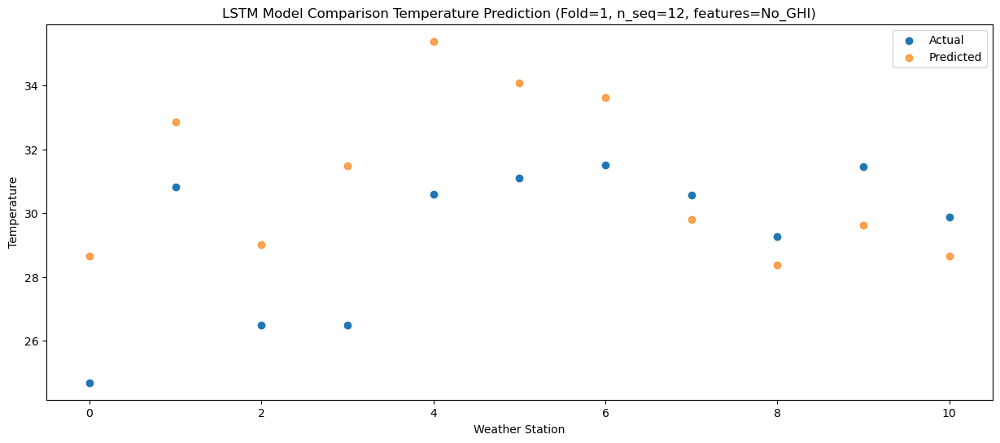

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   24.80  28.361610
1                 1   31.09  32.589013
2                 2   27.15  28.746820
3                 3   27.47  31.220165
4                 4   31.56  35.121675
5                 5   30.51  33.831737
6                 6   31.78  33.364441
7                 7   31.79  29.536402
8                 8   29.66  28.120461
9                 9   31.32  29.383111
10               10   29.67  28.398632


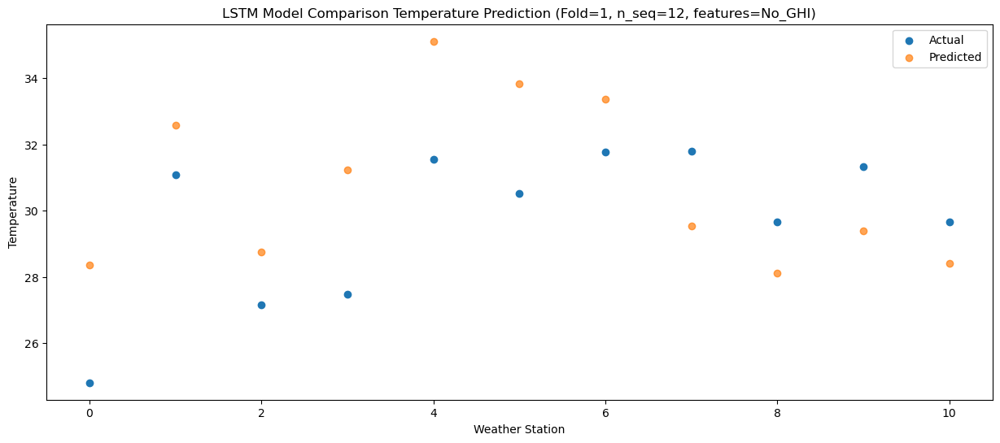

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   22.15  24.894330
1                 1   27.35  29.121246
2                 2   24.13  25.282809
3                 3   24.46  27.756991
4                 4   27.98  31.659370
5                 5   30.15  30.372998
6                 6   28.45  29.898465
7                 7   28.08  26.073442
8                 8   27.15  24.664882
9                 9   29.37  25.925708
10               10   25.97  24.927558


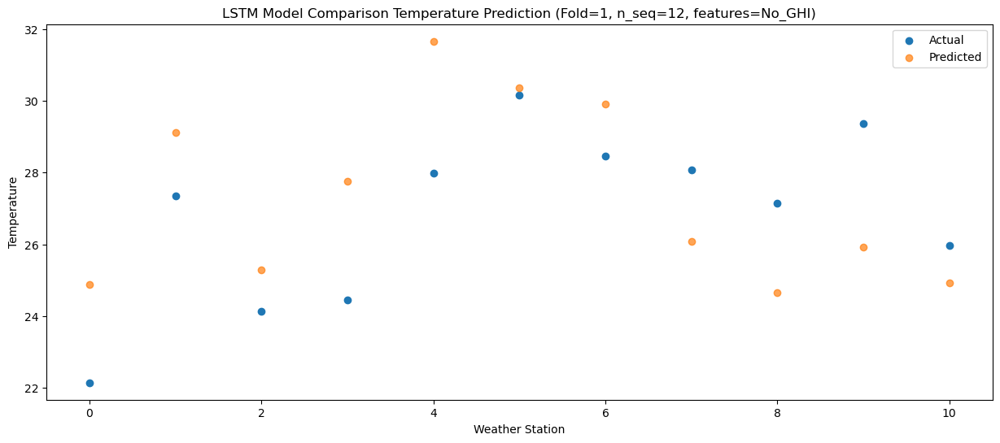

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   18.45  20.164191
1                 1   23.57  24.391810
2                 2   20.35  20.548341
3                 3   21.77  23.020148
4                 4   24.94  26.923461
5                 5   25.83  25.636807
6                 6   24.50  25.161432
7                 7   22.88  21.337102
8                 8   20.90  19.919546
9                 9   21.93  21.173441
10               10   21.55  20.186080


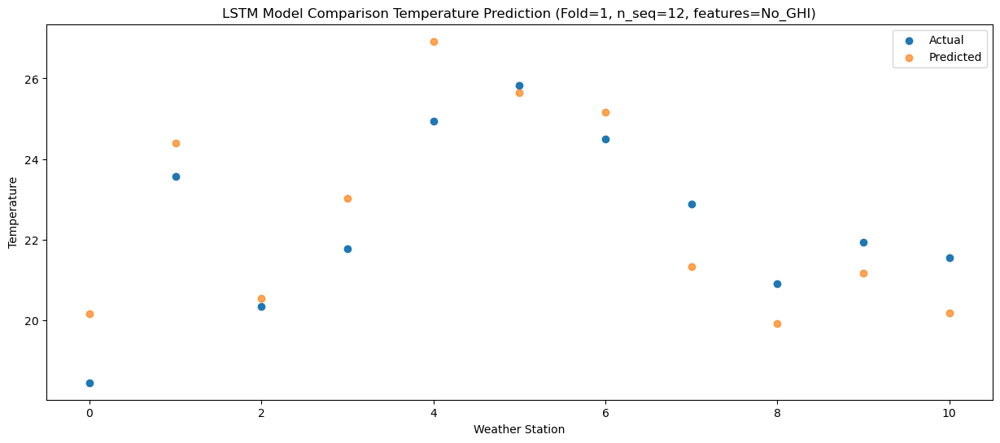

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   10.24  11.918490
1                 1   15.91  16.148598
2                 2   12.61  12.306205
3                 3   14.61  14.776494
4                 4   17.39  18.676564
5                 5   19.36  17.394570
6                 6   16.90  16.921716
7                 7   13.58  13.094397
8                 8   13.15  11.671306
9                 9   15.68  12.934727
10               10   12.23  11.939172


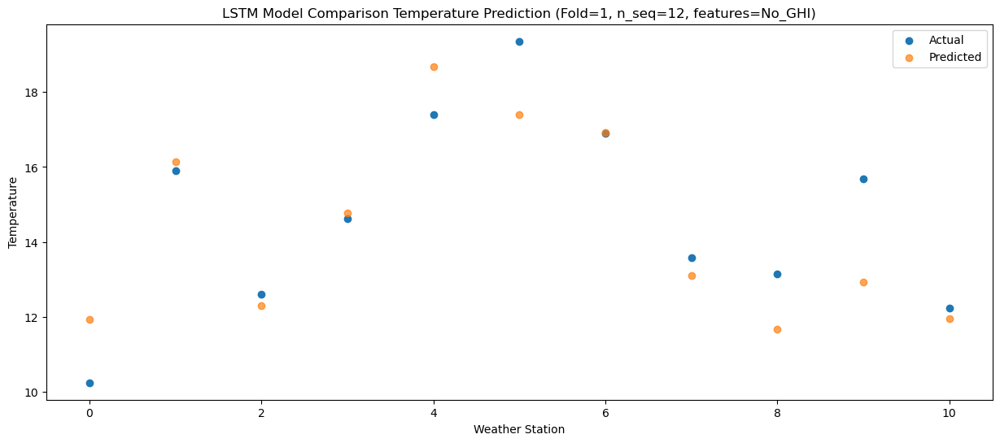

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   12.59  10.862637
1                 1   17.54  15.096307
2                 2   15.21  11.256745
3                 3   17.98  13.721932
4                 4   21.27  17.625869
5                 5   19.62  16.334017
6                 6   18.42  15.866353
7                 7   15.99  12.041116
8                 8   12.34  10.615895
9                 9   14.07  11.870156
10               10   11.46  10.876941


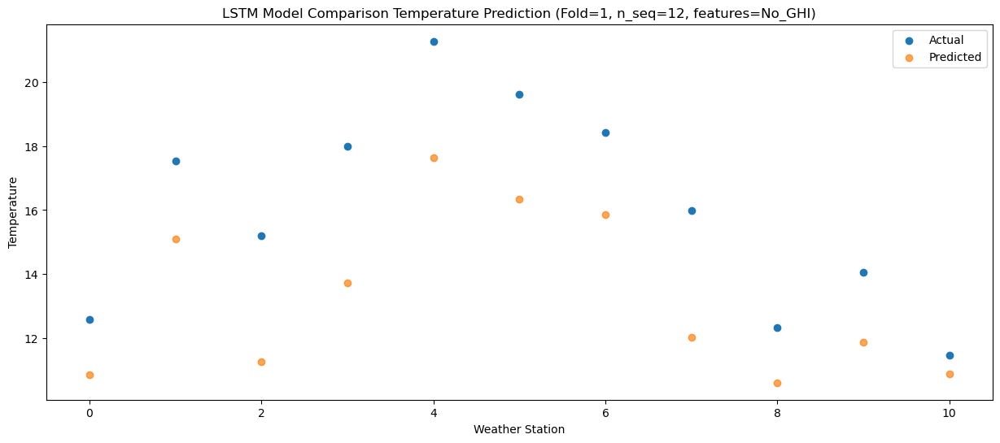

f, t:
[[ 8.38 12.    8.77 10.72 14.7  11.91 12.75  8.81  7.34  9.04  6.12]
 [ 8.6  12.66  9.26  9.13 13.   12.29 13.53  5.81  2.56  4.67  5.16]
 [13.58 19.43 16.32 16.5  20.61 19.63 19.81 17.13 15.12 15.38 12.38]
 [16.39 21.57 17.72 18.84 22.91 21.9  22.38 18.84 16.92 19.14 17.03]
 [20.   25.3  21.84 22.73 27.03 27.49 26.15 23.5  21.73 23.69 21.57]
 [23.49 29.44 25.72 26.62 30.5  31.76 30.16 29.58 27.76 30.8  27.66]
 [24.69 30.82 26.49 26.5  30.59 31.1  31.52 30.57 29.27 31.47 29.89]
 [24.8  31.09 27.15 27.47 31.56 30.51 31.78 31.79 29.66 31.32 29.67]
 [22.15 27.35 24.13 24.46 27.98 30.15 28.45 28.08 27.15 29.37 25.97]
 [18.45 23.57 20.35 21.77 24.94 25.83 24.5  22.88 20.9  21.93 21.55]
 [10.24 15.91 12.61 14.61 17.39 19.36 16.9  13.58 13.15 15.68 12.23]
 [12.59 17.54 15.21 17.98 21.27 19.62 18.42 15.99 12.34 14.07 11.46]]
[[ 8.12346471 12.35103108  8.49681804 10.96892749 14.85440332 13.56036445
  13.08839979  9.26180467  7.83594334  9.07539543  8.10057773]
 [ 6.71846152 10.94607283  7

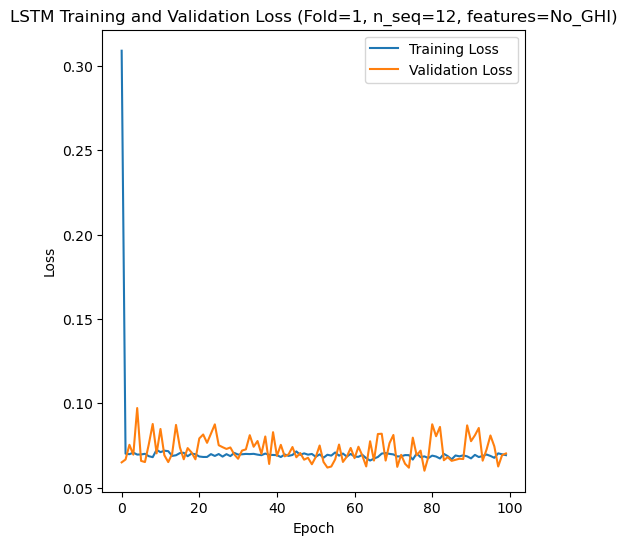

[[ 8.61  4.71 12.22 ... 22.49 18.22 13.52]
 [ 6.28  3.18  8.73 ... 22.36 17.39  7.52]
 [17.82 16.52 20.35 ... 28.79 25.32 22.93]
 ...
 [ 6.77  9.55 12.16 ... 24.55 20.29 10.24]
 [12.04 12.81 10.78 ... 23.32 20.33 13.93]
 [ 8.57  6.56 11.36 ... 21.36 16.14 12.65]]
Epoch 1/100
84/84 [==============================] - 57s 346ms/step - loss: 0.2524 - accuracy: 0.4286 - mae: 0.2123 - rmse: 0.2524 - mape: 44.8498 - pearson: 0.5367 - val_loss: 0.0825 - val_accuracy: 0.9000 - val_mae: 0.0651 - val_rmse: 0.0825 - val_mape: 14.2473 - val_pearson: 0.8180
Epoch 2/100
84/84 [==============================] - 22s 264ms/step - loss: 0.0715 - accuracy: 0.7381 - mae: 0.0560 - rmse: 0.0715 - mape: 12.6406 - pearson: 0.8131 - val_loss: 0.0637 - val_accuracy: 0.9000 - val_mae: 0.0531 - val_rmse: 0.0637 - val_mape: 13.5633 - val_pearson: 0.8527
Epoch 3/100
84/84 [==============================] - 23s 277ms/step - loss: 0.0722 - accuracy: 0.7143 - mae: 0.0565 - rmse: 0.0722 - mape: 12.6256 - pearson: 0.8128

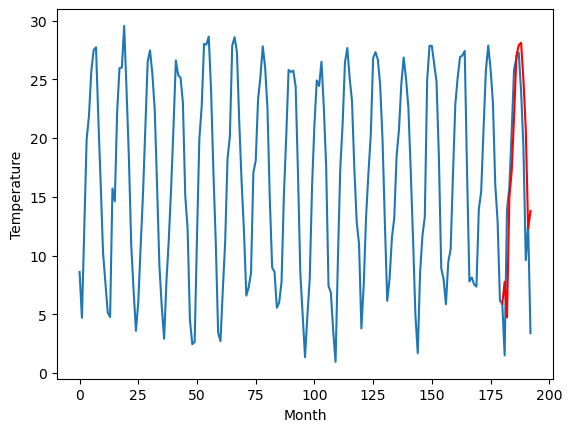

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		7.81		-0.72
4.49		4.77		0.28
14.68		14.99		0.31
18.44		17.23		-1.21
23.62		21.77		-1.85
30.87		27.03		-3.84
31.56		27.95		-3.61
32.32		28.14		-4.18
30.08		25.00		-5.08
21.82		20.70		-1.12
15.11		12.34		-2.77
12.72		13.82		1.10
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.63, 7.811583087444305, 4.771486566066741, 14.992068574428558, 17.230725333690643, 21.773083255290985, 27.034560248851776, 27.94938980102539, 28.138332605957984, 25.003906965851783, 20.70322728216648, 12.336089373230934, 13.822891951203346]


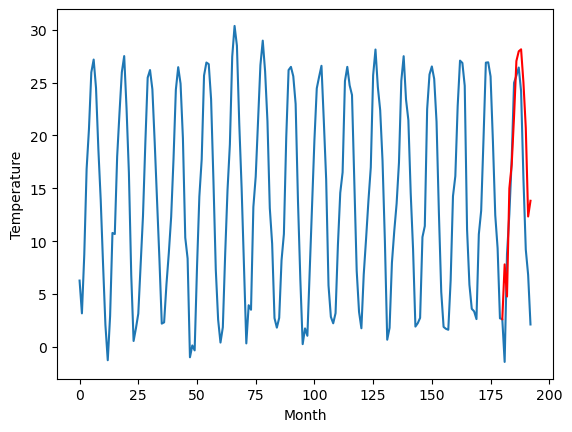

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.94		5.50		-1.44
9.67		2.47		-7.20
11.48		12.68		1.20
13.29		14.91		1.62
16.87		19.46		2.59
18.09		24.71		6.62
18.88		25.63		6.75
18.93		25.83		6.90
17.65		22.71		5.06
16.51		18.40		1.89
9.66		10.03		0.37
10.56		11.53		0.97
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[16.55, 5.49530169248581, 2.470061986446381, 12.678911893367768, 14.909835784435273, 19.456312625408174, 24.706134288311006, 25.632736949920655, 25.82897712171078, 22.70746375501156, 18.40392543256283, 10.0259823936224, 11.525248779654504]


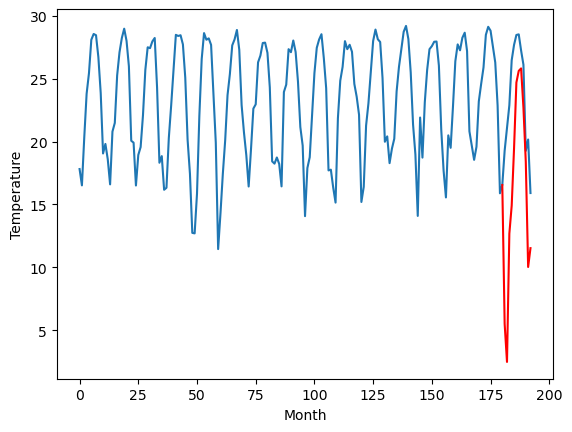

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.74		17.02		2.28
14.76		13.98		-0.78
18.87		24.20		5.33
23.37		26.42		3.05
28.63		30.97		2.34
34.20		36.23		2.03
36.20		37.15		0.95
37.26		37.35		0.09
34.09		34.22		0.13
30.26		29.92		-0.34
22.18		21.55		-0.63
20.26		23.04		2.78
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.83, 17.016532428264618, 13.982738502025605, 24.197266585826874, 26.424391515254975, 30.97427440404892, 36.227690942287445, 37.1516034078598, 37.34891492843628, 34.21579224586487, 29.921921319961548, 21.550972528457642, 23.040424056053162]


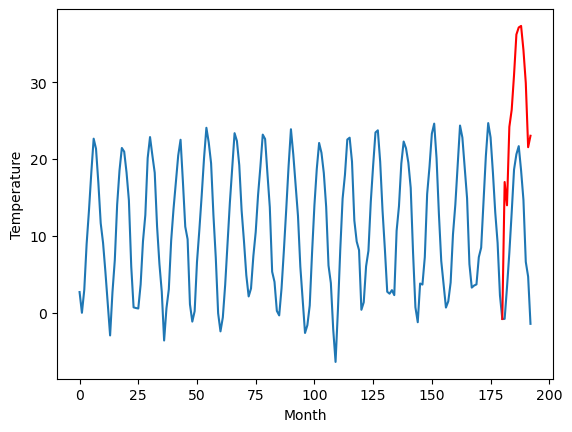

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.03		1.88		-1.15
2.29		-1.15		-3.44
9.62		9.07		-0.55
10.49		11.30		0.81
14.96		15.84		0.88
18.44		21.09		2.65
19.03		22.02		2.99
19.20		22.22		3.02
16.66		19.10		2.44
13.92		14.80		0.88
5.65		6.43		0.78
9.06		7.92		-1.14
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.52, 1.8843674588203432, -1.1477203440666197, 9.068242065906524, 11.298286907672882, 15.844161026477813, 21.09394740343094, 22.02247887134552, 22.221413113474846, 19.101770617365837, 14.796942927241325, 6.428146578669548, 7.920939661860466]


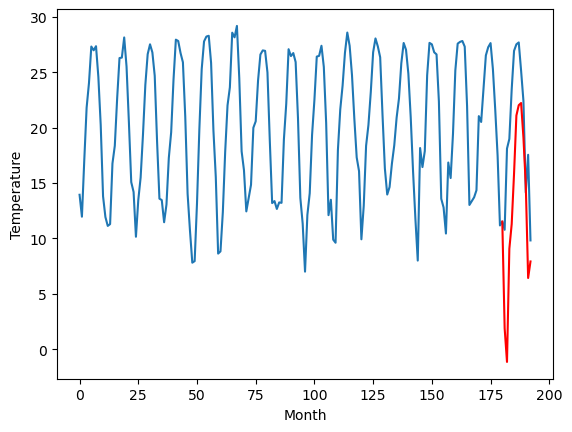

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.14		-0.21
11.00		10.10		-0.90
19.38		20.32		0.94
21.50		22.56		1.06
25.54		27.10		1.56
30.09		32.36		2.27
30.17		33.28		3.11
31.28		33.48		2.20
28.54		30.36		1.82
25.24		26.05		0.81
17.60		17.69		0.09
20.84		19.18		-1.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.47, 13.139988842010498, 10.10467022895813, 20.318196001052854, 22.55818504333496, 27.103213729858396, 32.36239141464233, 33.283857049942014, 33.482879596352575, 30.364153581261633, 26.04895277559757, 17.691205697655676, 19.17820640146732]


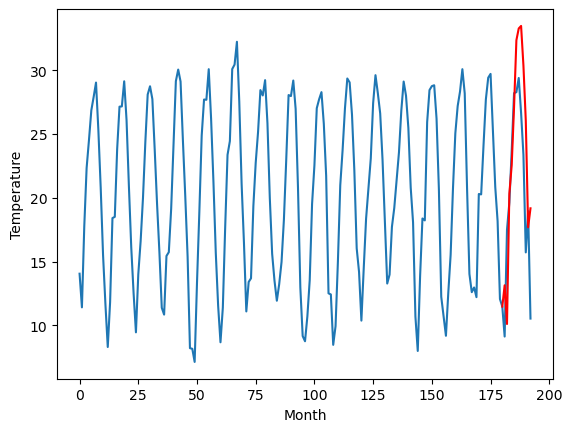

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.25		-0.10
10.24		10.21		-0.03
20.61		20.42		-0.19
22.31		22.66		0.35
26.39		27.21		0.82
31.95		32.46		0.51
32.84		33.39		0.55
33.40		33.59		0.19
31.13		30.46		-0.67
26.62		26.15		-0.47
18.65		17.79		-0.86
20.94		19.28		-1.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 13.2464048743248, 10.20630739927292, 20.421524035930634, 22.66279433965683, 27.206013906002045, 32.46198724508285, 33.38916676044464, 33.58923319280147, 30.463685545325276, 26.149292024970052, 17.79490664899349, 19.282552990317342]


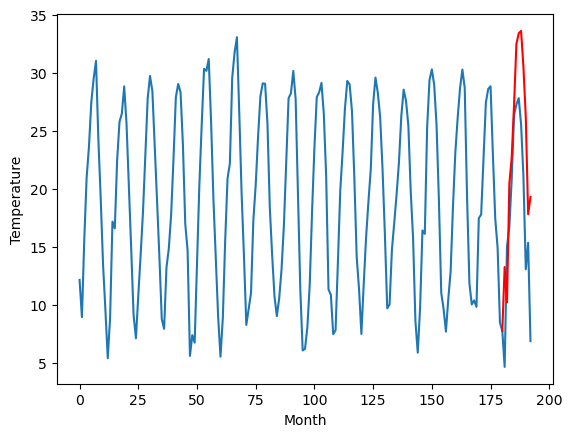

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.68		11.34		-1.34
15.60		8.30		-7.30
18.70		18.51		-0.19
25.36		20.75		-4.61
30.37		25.28		-5.09
35.36		30.53		-4.83
34.16		31.45		-2.71
33.64		31.64		-2.00
31.46		28.53		-2.93
24.90		24.20		-0.70
19.50		15.85		-3.65
16.15		17.34		1.19
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.9, 11.342474892139435, 8.300466253757477, 18.51144285440445, 20.74694056749344, 25.280288174152375, 30.526322796344758, 31.44572420358658, 31.64403644144535, 28.530461936593056, 24.20342126429081, 15.851071982979775, 17.342927127480507]


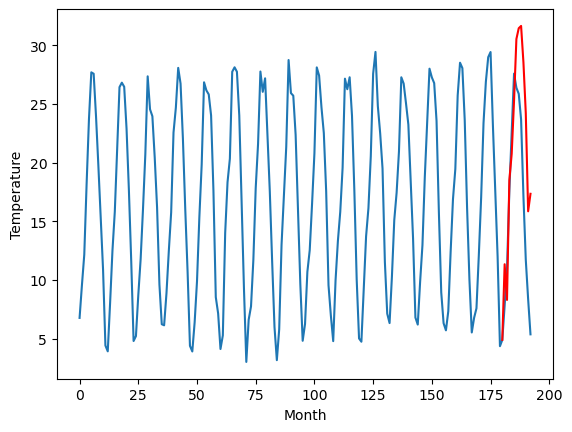

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.71		5.99		-0.72
5.79		2.94		-2.85
5.39		13.14		7.75
9.25		15.37		6.12
11.47		19.90		8.43
15.71		25.15		9.44
18.69		26.07		7.38
18.29		26.27		7.98
16.51		23.17		6.66
11.53		18.83		7.30
10.27		10.48		0.21
3.76		11.96		8.20
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.14, 5.987736780643463, 2.9388771843910213, 13.144081194400787, 15.374225933551788, 19.902444202899932, 25.148885090351104, 26.06782736301422, 26.272773746848106, 23.166324142813682, 18.825219635367393, 10.479695801138877, 11.96097875058651]


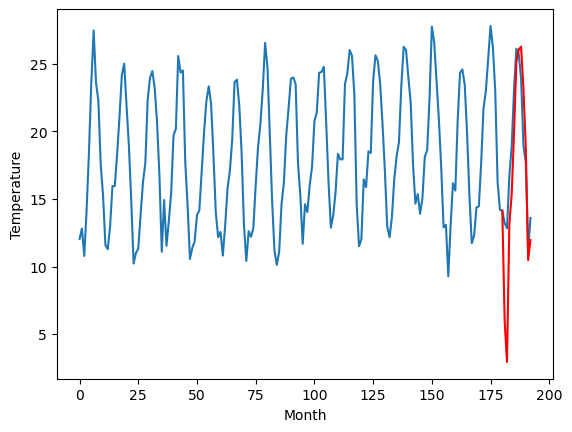

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.63		11.25		-0.38
12.13		8.22		-3.91
19.01		18.44		-0.57
21.80		20.67		-1.13
25.82		25.21		-0.61
30.11		30.46		0.35
31.68		31.39		-0.29
31.77		31.61		-0.16
27.66		28.50		0.84
24.38		24.18		-0.20
15.47		15.83		0.36
17.39		17.32		-0.07
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.55, 11.253374853134154, 8.223859586715697, 18.438625135421752, 20.669207611083984, 25.208839931488036, 30.45800832748413, 31.391710140705108, 31.606887348890304, 28.504313954114913, 24.182974346876144, 15.8268113219738, 17.318203457593917]


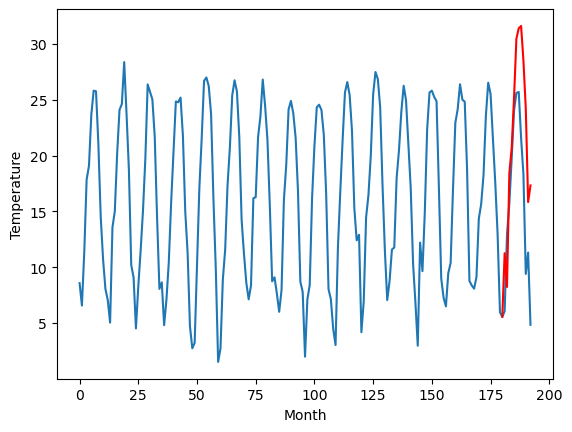

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.90		7.78		-1.12
10.25		4.75		-5.50
16.46		14.97		-1.49
18.43		17.20		-1.23
23.34		21.75		-1.59
28.75		26.99		-1.76
30.06		27.93		-2.13
30.14		28.14		-2.00
25.65		25.04		-0.61
21.89		20.72		-1.17
11.67		12.36		0.69
13.77		13.86		0.09
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.19, 7.78102511882782, 4.7509121370315555, 14.971564717292786, 17.201611466407776, 21.746512360572815, 26.99420732975006, 27.926013655662537, 28.140247054100037, 25.035346455574036, 20.720901913642884, 12.362912602424622, 13.856186456680298]


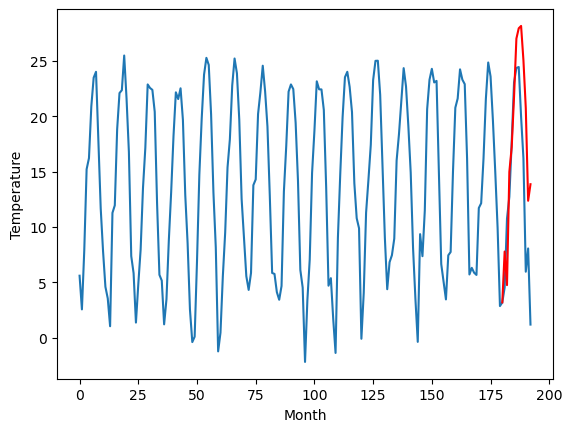

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.31   7.772937
1                 1    8.53   7.811583
2                 2    6.94   5.495302
3                 3   14.74  17.016532
4                 4    3.03   1.884367
5                 5   13.35  13.139989
6                 6   13.35  13.246405
7                 7   12.68  11.342475
8                 8    6.71   5.987737
9                 9   11.63  11.253375
10               10    8.90   7.781025


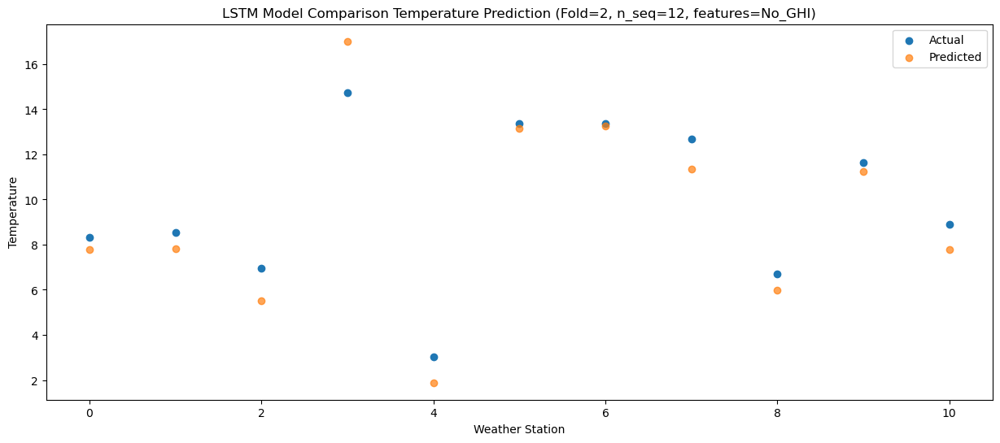

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.91   4.734625
1                 1    4.49   4.771487
2                 2    9.67   2.470062
3                 3   14.76  13.982739
4                 4    2.29  -1.147720
5                 5   11.00  10.104670
6                 6   10.24  10.206307
7                 7   15.60   8.300466
8                 8    5.79   2.938877
9                 9   12.13   8.223860
10               10   10.25   4.750912


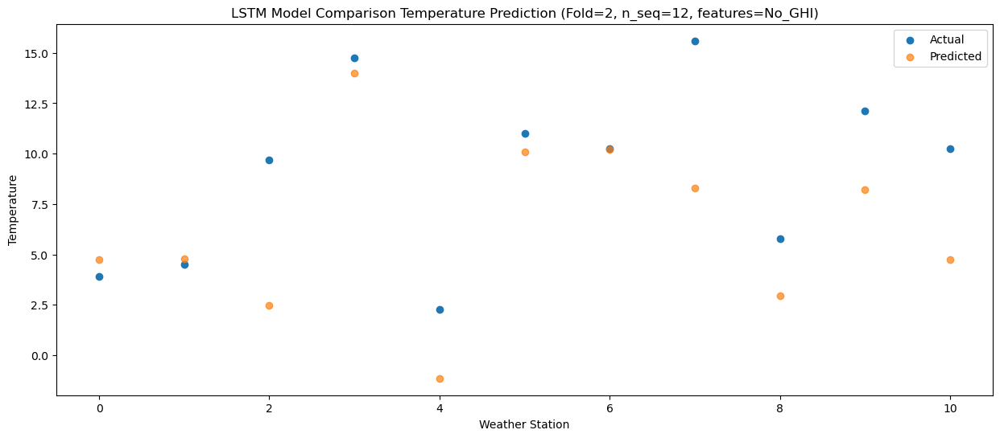

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.33  14.955070
1                 1   14.68  14.992069
2                 2   11.48  12.678912
3                 3   18.87  24.197267
4                 4    9.62   9.068242
5                 5   19.38  20.318196
6                 6   20.61  20.421524
7                 7   18.70  18.511443
8                 8    5.39  13.144081
9                 9   19.01  18.438625
10               10   16.46  14.971565


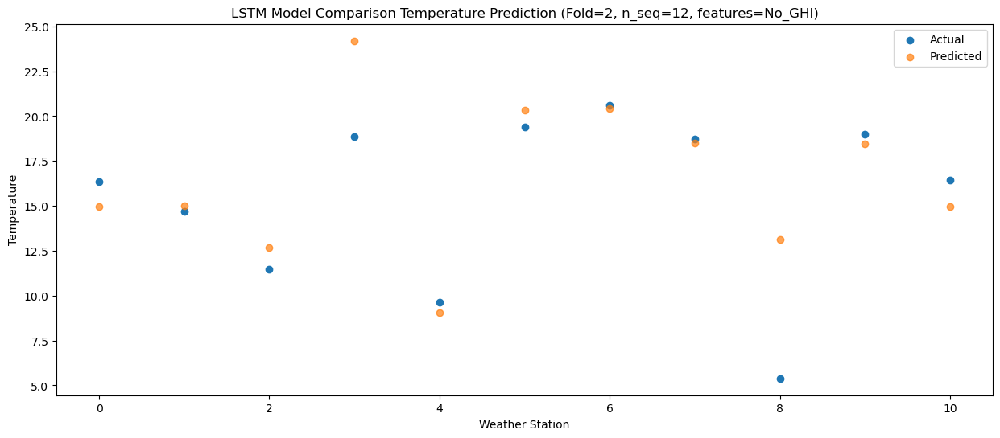

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.20  17.193564
1                 1   18.44  17.230725
2                 2   13.29  14.909836
3                 3   23.37  26.424392
4                 4   10.49  11.298287
5                 5   21.50  22.558185
6                 6   22.31  22.662794
7                 7   25.36  20.746941
8                 8    9.25  15.374226
9                 9   21.80  20.669208
10               10   18.43  17.201611


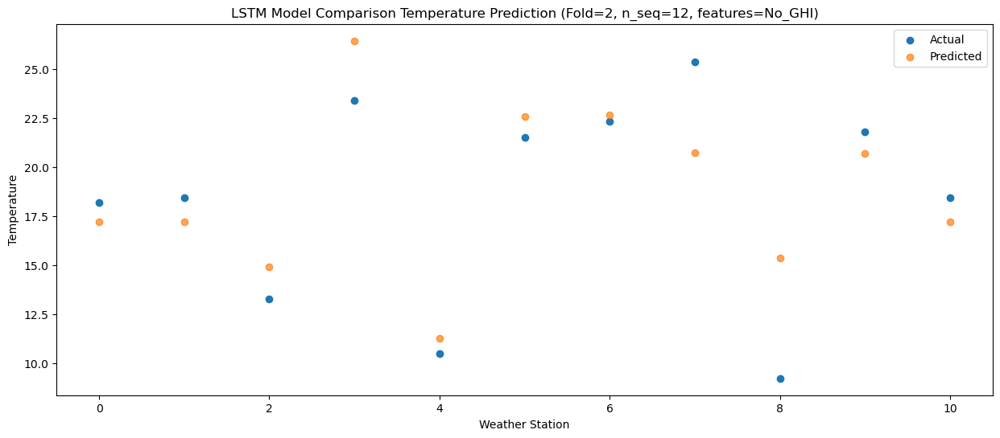

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   22.98  21.750573
1                 1   23.62  21.773083
2                 2   16.87  19.456313
3                 3   28.63  30.974274
4                 4   14.96  15.844161
5                 5   25.54  27.103214
6                 6   26.39  27.206014
7                 7   30.37  25.280288
8                 8   11.47  19.902444
9                 9   25.82  25.208840
10               10   23.34  21.746512


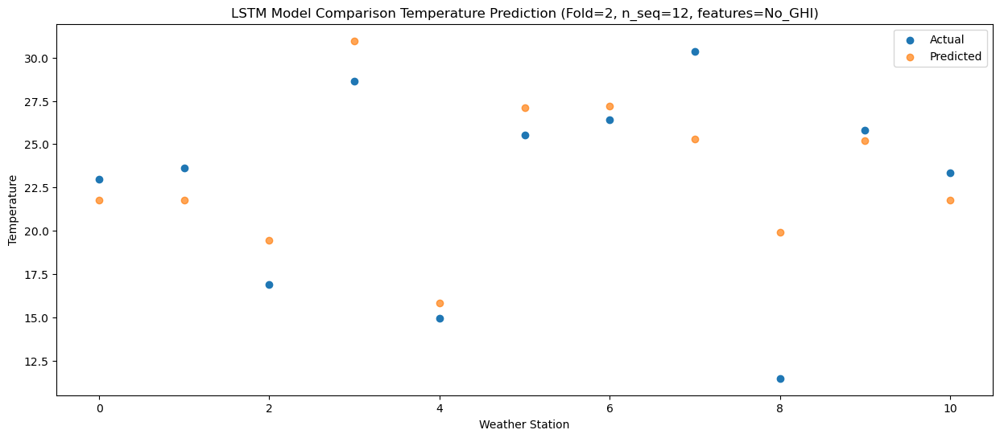

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   28.23  27.001133
1                 1   30.87  27.034560
2                 2   18.09  24.706134
3                 3   34.20  36.227691
4                 4   18.44  21.093947
5                 5   30.09  32.362391
6                 6   31.95  32.461987
7                 7   35.36  30.526323
8                 8   15.71  25.148885
9                 9   30.11  30.458008
10               10   28.75  26.994207


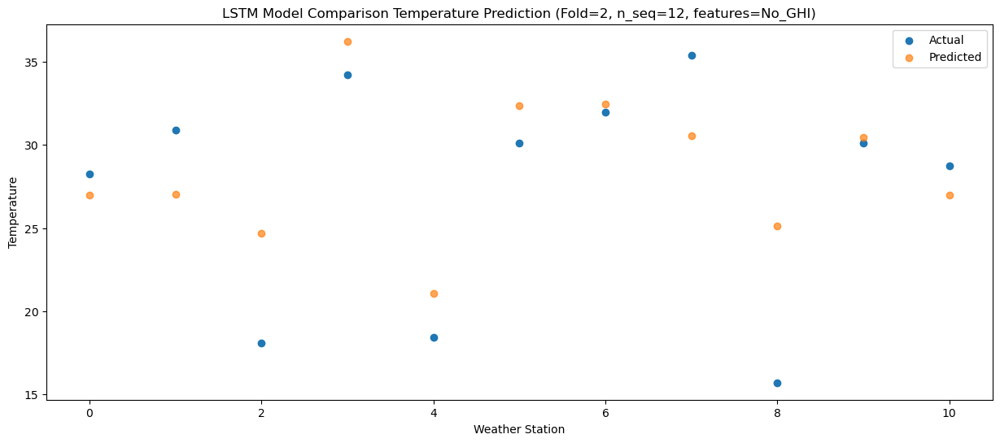

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   29.24  27.919322
1                 1   31.56  27.949390
2                 2   18.88  25.632737
3                 3   36.20  37.151603
4                 4   19.03  22.022479
5                 5   30.17  33.283857
6                 6   32.84  33.389167
7                 7   34.16  31.445724
8                 8   18.69  26.067827
9                 9   31.68  31.391710
10               10   30.06  27.926014


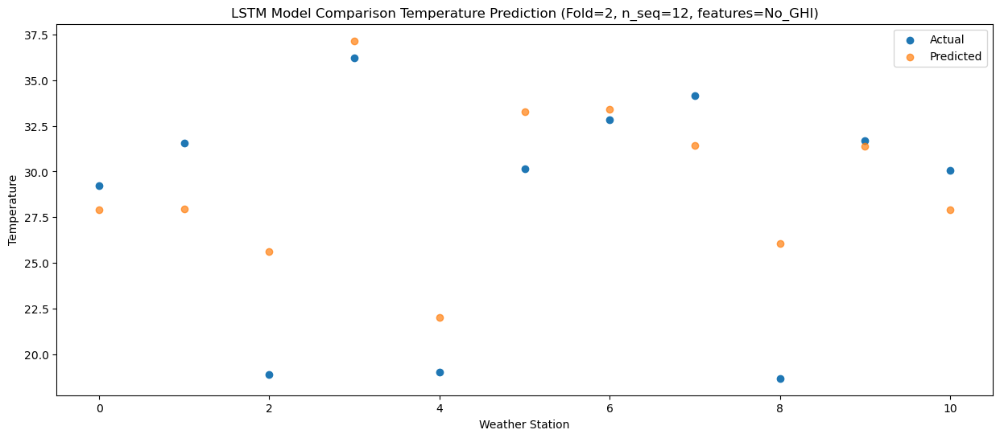

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   29.69  28.113282
1                 1   32.32  28.138333
2                 2   18.93  25.828977
3                 3   37.26  37.348915
4                 4   19.20  22.221413
5                 5   31.28  33.482880
6                 6   33.40  33.589233
7                 7   33.64  31.644036
8                 8   18.29  26.272774
9                 9   31.77  31.606887
10               10   30.14  28.140247


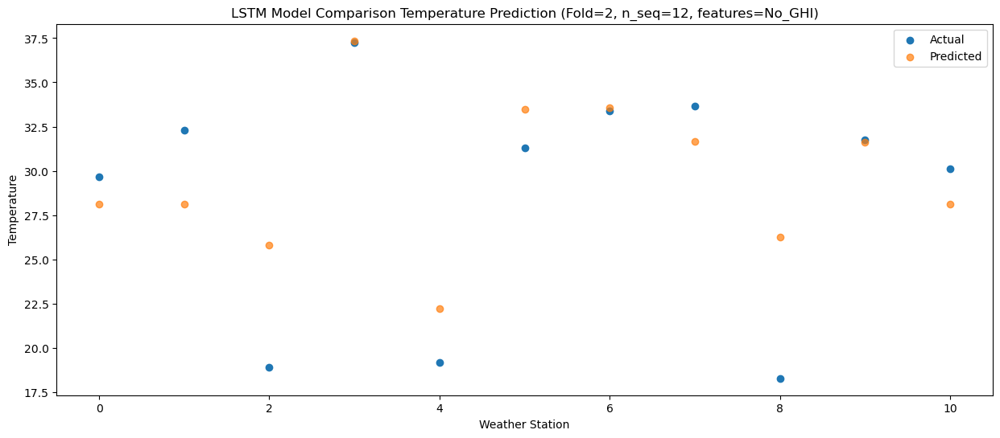

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   26.39  24.972895
1                 1   30.08  25.003907
2                 2   17.65  22.707464
3                 3   34.09  34.215792
4                 4   16.66  19.101771
5                 5   28.54  30.364154
6                 6   31.13  30.463686
7                 7   31.46  28.530462
8                 8   16.51  23.166324
9                 9   27.66  28.504314
10               10   25.65  25.035346


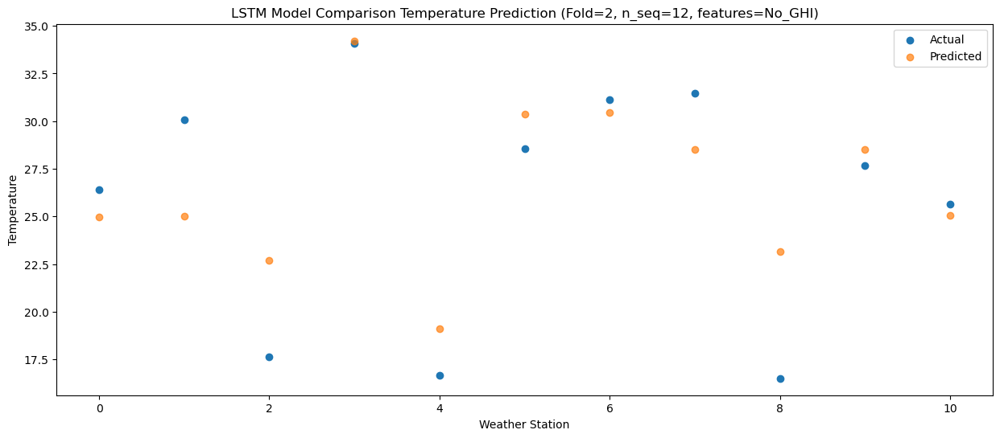

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   21.64  20.681853
1                 1   21.82  20.703227
2                 2   16.51  18.403925
3                 3   30.26  29.921921
4                 4   13.92  14.796943
5                 5   25.24  26.048953
6                 6   26.62  26.149292
7                 7   24.90  24.203421
8                 8   11.53  18.825220
9                 9   24.38  24.182974
10               10   21.89  20.720902


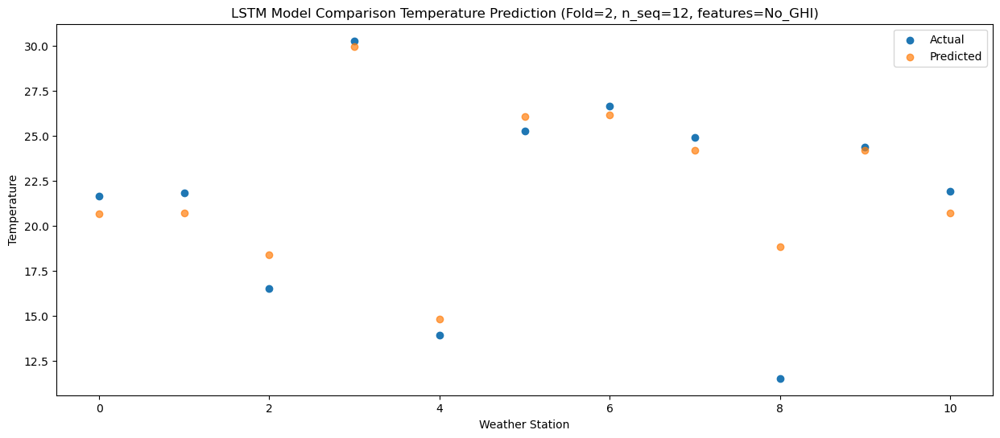

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   12.02  12.300551
1                 1   15.11  12.336089
2                 2    9.66  10.025982
3                 3   22.18  21.550973
4                 4    5.65   6.428147
5                 5   17.60  17.691206
6                 6   18.65  17.794907
7                 7   19.50  15.851072
8                 8   10.27  10.479696
9                 9   15.47  15.826811
10               10   11.67  12.362913


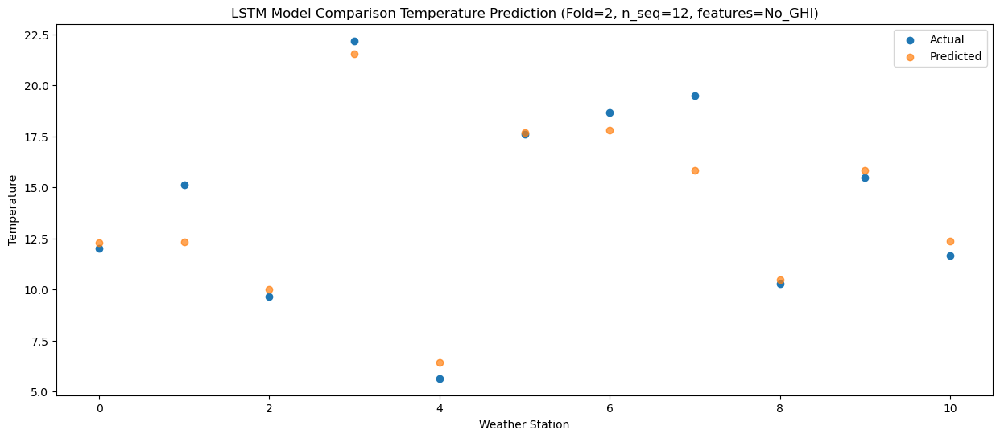

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   15.11  13.796918
1                 1   12.72  13.822892
2                 2   10.56  11.525249
3                 3   20.26  23.040424
4                 4    9.06   7.920940
5                 5   20.84  19.178206
6                 6   20.94  19.282553
7                 7   16.15  17.342927
8                 8    3.76  11.960979
9                 9   17.39  17.318203
10               10   13.77  13.856186


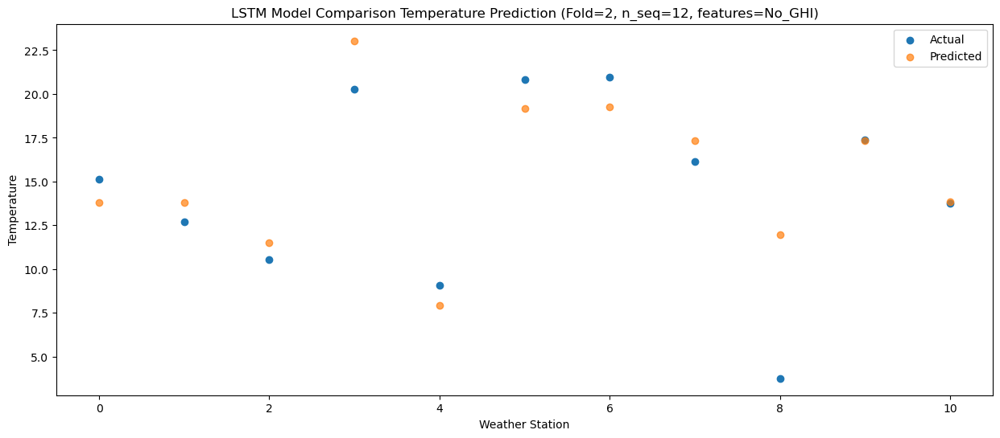

f, t:
[[ 8.31  8.53  6.94 14.74  3.03 13.35 13.35 12.68  6.71 11.63  8.9 ]
 [ 3.91  4.49  9.67 14.76  2.29 11.   10.24 15.6   5.79 12.13 10.25]
 [16.33 14.68 11.48 18.87  9.62 19.38 20.61 18.7   5.39 19.01 16.46]
 [18.2  18.44 13.29 23.37 10.49 21.5  22.31 25.36  9.25 21.8  18.43]
 [22.98 23.62 16.87 28.63 14.96 25.54 26.39 30.37 11.47 25.82 23.34]
 [28.23 30.87 18.09 34.2  18.44 30.09 31.95 35.36 15.71 30.11 28.75]
 [29.24 31.56 18.88 36.2  19.03 30.17 32.84 34.16 18.69 31.68 30.06]
 [29.69 32.32 18.93 37.26 19.2  31.28 33.4  33.64 18.29 31.77 30.14]
 [26.39 30.08 17.65 34.09 16.66 28.54 31.13 31.46 16.51 27.66 25.65]
 [21.64 21.82 16.51 30.26 13.92 25.24 26.62 24.9  11.53 24.38 21.89]
 [12.02 15.11  9.66 22.18  5.65 17.6  18.65 19.5  10.27 15.47 11.67]
 [15.11 12.72 10.56 20.26  9.06 20.84 20.94 16.15  3.76 17.39 13.77]]
[[ 7.77293701  7.81158309  5.49530169 17.01653243  1.88436746 13.13998884
  13.24640487 11.34247489  5.98773678 11.25337485  7.78102512]
 [ 4.73462505  4.77148657  2

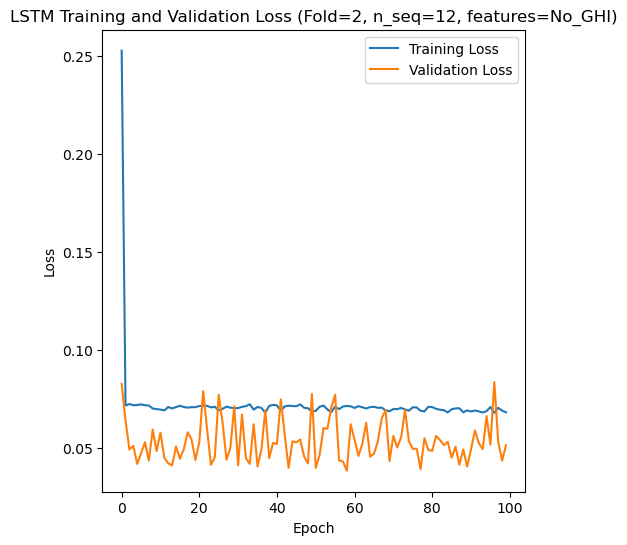

[[ 8.9   6.89 11.3  ... 22.19 16.88 13.54]
 [ 7.02  3.15 10.24 ... 22.31 18.92 11.32]
 [ 7.65  9.7   9.44 ... 25.68 20.65 11.46]
 ...
 [ 9.57 11.93 12.22 ... 30.9  25.01 12.37]
 [ 9.04  9.3   8.59 ... 17.72 17.26 10.73]
 [ 3.2   0.4   3.78 ... 18.92 14.39 10.04]]
Epoch 1/100
84/84 [==============================] - 56s 355ms/step - loss: 0.1549 - accuracy: 0.5833 - mae: 0.1164 - rmse: 0.1549 - mape: 24.1794 - pearson: 0.6631 - val_loss: 0.0825 - val_accuracy: 0.7000 - val_mae: 0.0666 - val_rmse: 0.0825 - val_mape: 18.1132 - val_pearson: 0.7545
Epoch 2/100
84/84 [==============================] - 24s 282ms/step - loss: 0.0687 - accuracy: 0.7976 - mae: 0.0532 - rmse: 0.0687 - mape: 12.4129 - pearson: 0.8364 - val_loss: 0.0895 - val_accuracy: 0.7000 - val_mae: 0.0705 - val_rmse: 0.0895 - val_mape: 19.2528 - val_pearson: 0.7280
Epoch 3/100
84/84 [==============================] - 23s 267ms/step - loss: 0.0686 - accuracy: 0.7976 - mae: 0.0532 - rmse: 0.0686 - mape: 12.4912 - pearson: 0.8339

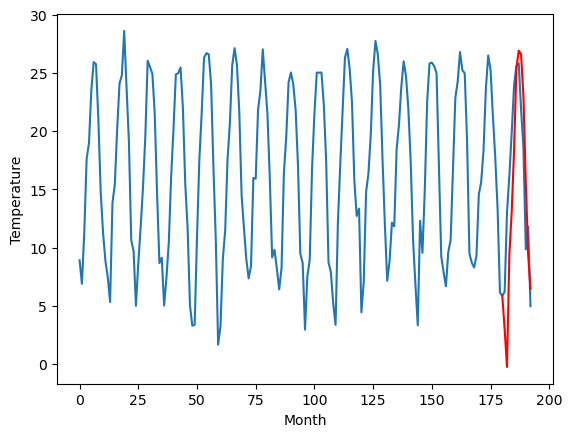

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.75		8.68		0.93
4.03		5.45		1.42
16.00		15.09		-0.91
17.86		18.77		0.91
22.08		24.00		1.92
28.79		31.12		2.33
30.10		32.64		2.54
30.67		32.28		1.61
27.94		28.70		0.76
21.34		21.34		0.00
13.63		15.13		1.50
14.94		12.19		-2.75
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.2, 8.681124904751778, 5.44577286541462, 15.087592819333077, 18.771717765927313, 24.004122474789618, 31.124246338009833, 32.64097342789173, 32.28372607529163, 28.696501114964484, 21.34025893509388, 15.13204369843006, 12.18534837067127]


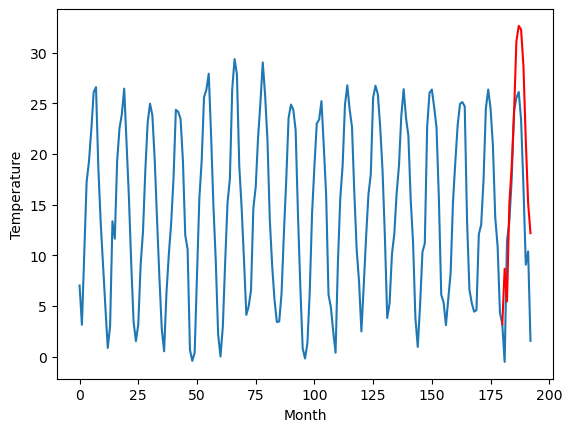

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.28		6.80		-1.48
10.58		3.58		-7.00
11.73		13.20		1.47
17.46		16.89		-0.57
22.26		22.12		-0.14
27.11		29.26		2.15
30.24		30.76		0.52
28.04		30.39		2.35
24.73		26.81		2.08
16.07		19.45		3.38
11.73		13.24		1.51
7.81		10.30		2.49
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[8.48, 6.7997709256410594, 3.576597307324409, 13.20390329182148, 16.890696619153022, 22.119370554089546, 29.258956049084663, 30.757116172909736, 30.394095305800438, 26.810641650557518, 19.451449756026268, 13.240228061079979, 10.295177344679832]


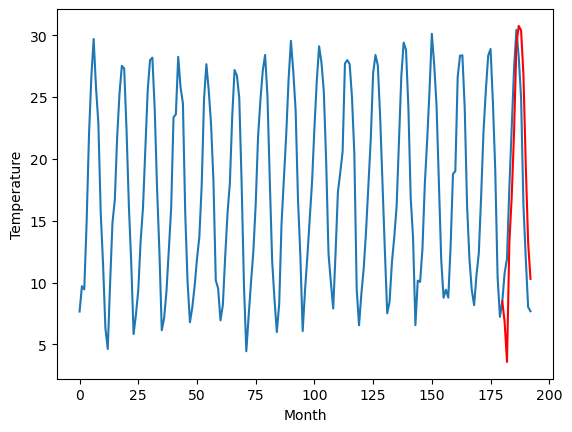

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.19		7.43		1.24
4.87		4.20		-0.67
15.08		13.84		-1.24
17.43		17.52		0.09
21.50		22.75		1.25
27.42		29.88		2.46
28.41		31.39		2.98
28.93		31.03		2.10
24.80		27.43		2.63
21.22		20.07		-1.15
11.56		13.86		2.30
13.05		10.92		-2.13
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.55, 7.430730500817299, 4.20322314798832, 13.840557017922402, 17.517109075188635, 22.75409380495548, 29.876155534386633, 31.39161447584629, 31.030254223942755, 27.430679181218146, 20.073490479588507, 13.860252717137335, 10.921916344761847]


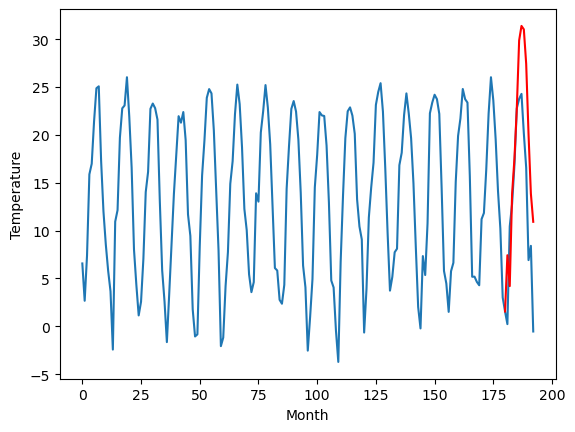

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.10		6.35		1.25
1.23		3.12		1.89
14.31		12.76		-1.55
17.60		16.44		-1.16
22.17		21.67		-0.50
29.65		28.80		-0.85
29.65		30.31		0.66
29.77		29.96		0.19
26.41		26.36		-0.05
20.99		19.00		-1.99
11.25		12.78		1.53
10.89		9.84		-1.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.08, 6.348805673122406, 3.118803508281708, 12.760058887004853, 16.43951321363449, 21.67290116071701, 28.796595103740692, 30.31391096830368, 29.963097639083863, 26.36122495651245, 18.996860809326172, 12.782745189666748, 9.841023273468018]


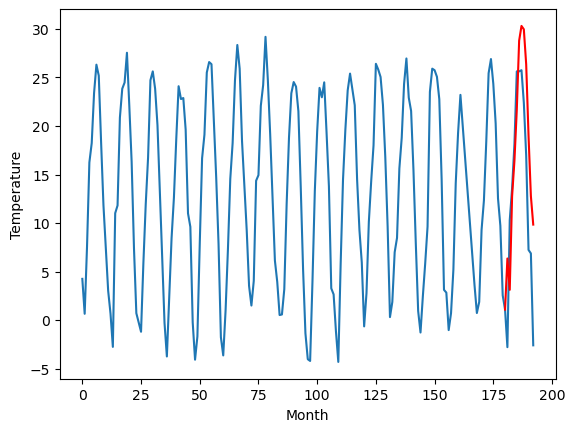

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.80		4.03		1.23
0.08		0.80		0.72
11.41		10.44		-0.97
14.86		14.12		-0.74
19.14		19.36		0.22
25.85		26.48		0.63
26.23		28.00		1.77
26.55		27.65		1.10
23.29		24.04		0.75
18.71		16.68		-2.03
7.86		10.46		2.60
8.91		7.52		-1.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.21, 4.030537083745003, 0.798813059926033, 10.440138056874275, 14.117541268467903, 19.358505681157112, 26.4758610278368, 27.999445751309395, 27.645040348172188, 24.036438301205635, 16.678798511624336, 10.46355564892292, 7.521834686398506]


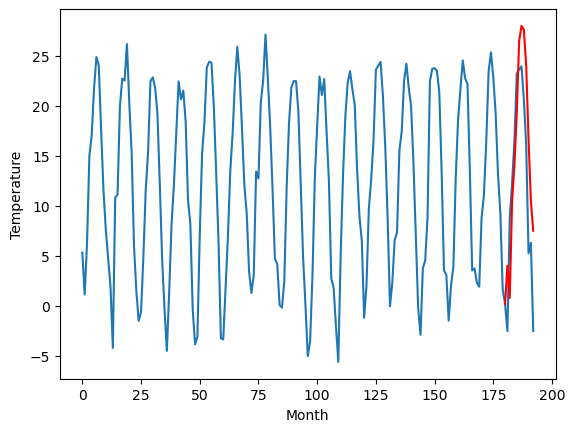

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.60		5.10		-0.50
5.70		1.87		-3.83
8.67		11.50		2.83
13.45		15.19		1.74
18.50		20.43		1.93
25.89		27.56		1.67
27.73		29.08		1.35
25.81		28.72		2.91
23.94		25.12		1.18
15.97		17.76		1.79
13.23		11.55		-1.68
8.47		8.61		0.14
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-8.22, 5.101625325083733, 1.87140143096447, 11.504788042902947, 15.190407397150993, 20.427803637385367, 27.560919882655142, 29.075712682604788, 28.71540069758892, 25.11958098590374, 17.757154704928396, 11.55353522479534, 8.611427547335623]


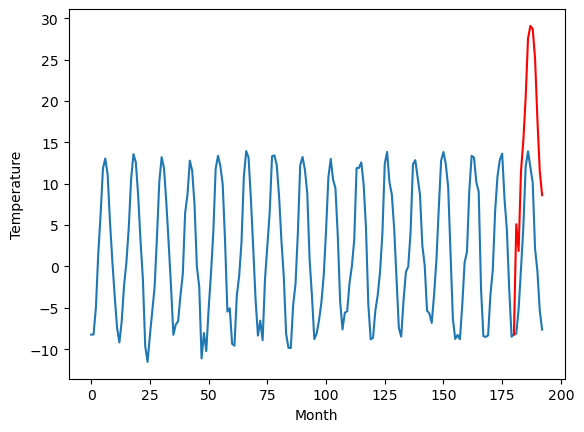

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-7.69		-8.46		-0.77
-4.84		-11.69		-6.85
-3.24		-2.06		1.18
4.73		1.62		-3.11
9.16		6.85		-2.31
16.80		13.99		-2.81
17.88		15.49		-2.39
16.65		15.13		-1.52
12.68		11.54		-1.14
2.33		4.18		1.85
-0.19		-2.02		-1.83
-7.46		-4.97		2.49
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.04, -8.46399191558361, -11.691638981699944, -2.0646992081403734, 1.6230187064409254, 6.852051222920418, 13.9920386916399, 15.493093574643135, 15.12538802087307, 11.541357869505882, 4.181770676970482, -2.024353151917458, -4.970266228318215]


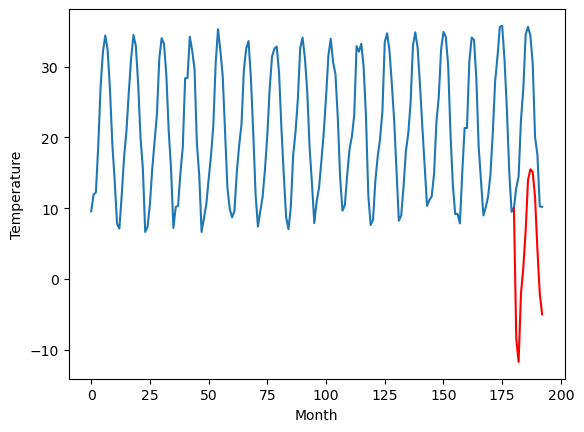

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		9.35		-1.44
11.72		6.13		-5.59
11.50		15.75		4.25
13.69		19.43		5.74
17.98		24.67		6.69
19.68		31.81		12.13
18.86		33.31		14.45
19.41		32.94		13.53
18.86		29.35		10.49
16.10		22.00		5.90
13.28		15.79		2.51
9.58		12.85		3.27
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.17, 9.34575521171093, 6.132197014689446, 15.748827568888665, 19.432246796488762, 24.666174523234368, 31.809862248301506, 33.30920933902264, 32.93645771563053, 29.354109845757485, 21.99742420732975, 15.78541477739811, 12.847338758111]


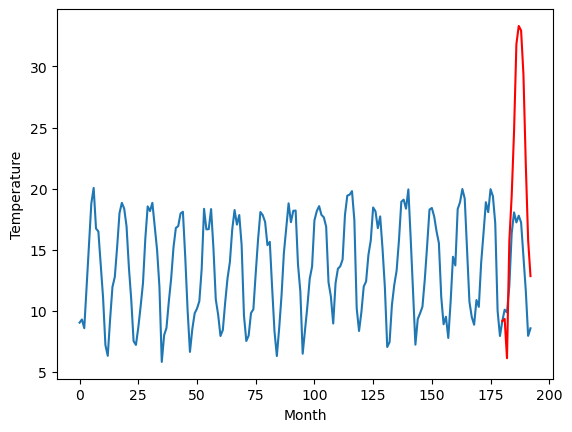

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.02		8.82		2.80
5.90		5.60		-0.30
10.90		15.23		4.33
15.52		18.91		3.39
20.35		24.15		3.80
26.22		31.29		5.07
28.36		32.82		4.46
28.98		32.45		3.47
25.66		28.85		3.19
21.22		21.50		0.28
12.30		15.29		2.99
10.70		12.35		1.65
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.94, 8.81946427464485, 5.600325175523757, 15.226076670885085, 18.905000754594802, 24.148718425035476, 31.288011142015456, 32.81750816941261, 32.44952804684639, 28.84941417813301, 21.50103647351265, 15.289553471803664, 12.346143552064895]


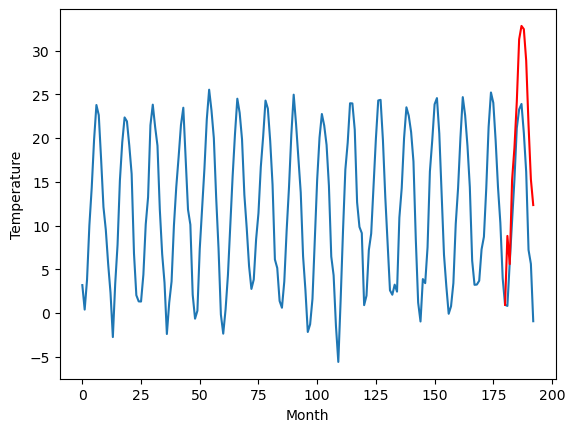

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.64		2.98		1.34
0.84		-0.24		-1.08
8.03		9.39		1.36
12.90		13.06		0.16
17.16		18.31		1.15
23.33		25.44		2.11
24.97		26.98		2.01
24.70		26.61		1.91
20.44		23.00		2.56
16.32		15.66		-0.66
6.10		9.45		3.35
5.69		6.51		0.82
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.13, 2.982163739204407, -0.23940889835357648, 9.385217261314391, 13.05984456539154, 18.310178351402282, 25.443249297142028, 26.97836036682129, 26.6128957092762, 23.00321815609932, 15.662244302034377, 9.450423699617385, 6.505611640214919]


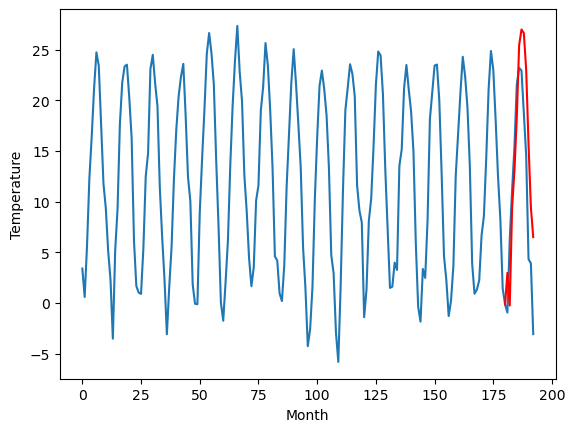

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.92   2.975395
1                 1    7.75   8.681125
2                 2    8.28   6.799771
3                 3    6.19   7.430731
4                 4    5.10   6.348806
5                 5    2.80   4.030537
6                 6    5.60   5.101625
7                 7   -7.69  -8.463992
8                 8   10.79   9.345755
9                 9    6.02   8.819464
10               10    1.64   2.982164


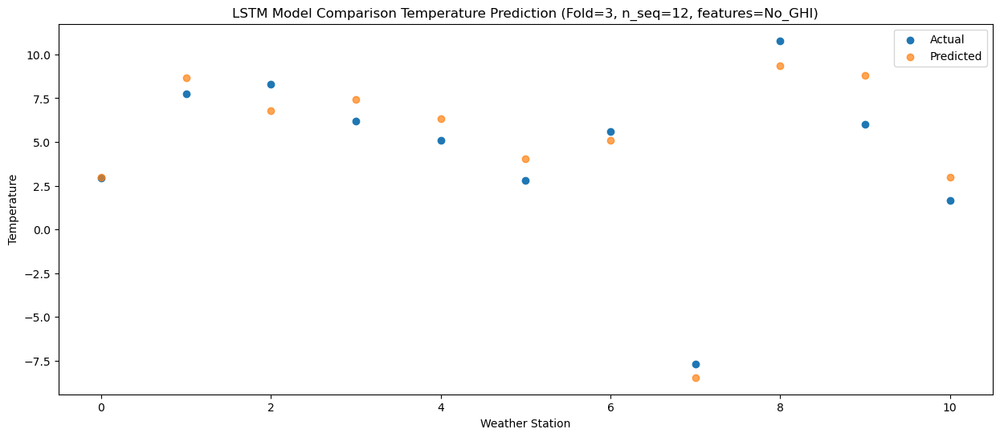

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.29  -0.250032
1                 1    4.03   5.445773
2                 2   10.58   3.576597
3                 3    4.87   4.203223
4                 4    1.23   3.118804
5                 5    0.08   0.798813
6                 6    5.70   1.871401
7                 7   -4.84 -11.691639
8                 8   11.72   6.132197
9                 9    5.90   5.600325
10               10    0.84  -0.239409


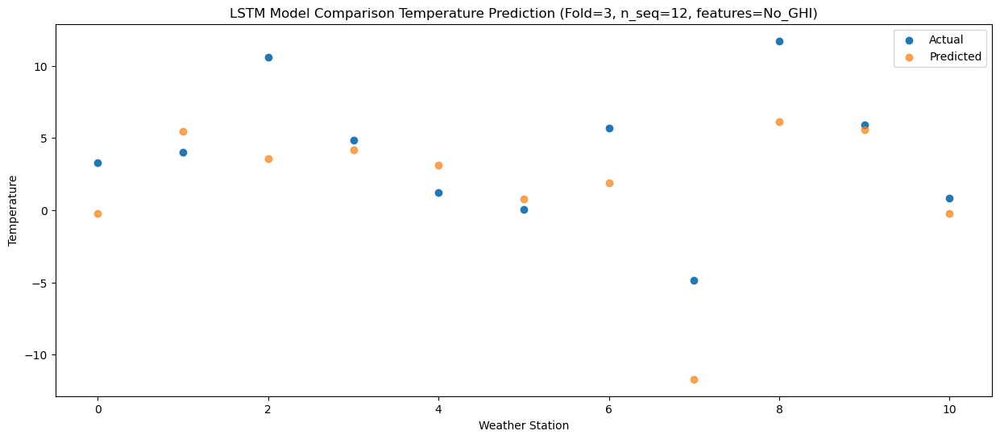

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.09   9.376340
1                 1   16.00  15.087593
2                 2   11.73  13.203903
3                 3   15.08  13.840557
4                 4   14.31  12.760059
5                 5   11.41  10.440138
6                 6    8.67  11.504788
7                 7   -3.24  -2.064699
8                 8   11.50  15.748828
9                 9   10.90  15.226077
10               10    8.03   9.385217


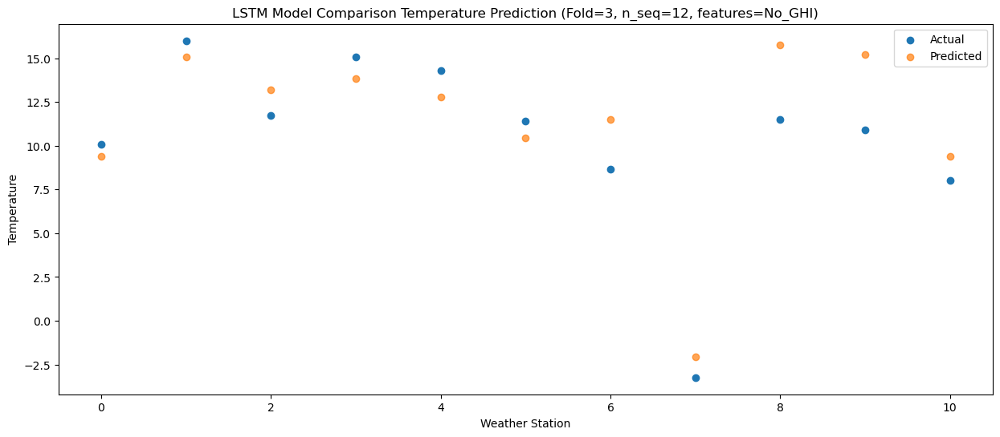

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.25  13.054402
1                 1   17.86  18.771718
2                 2   17.46  16.890697
3                 3   17.43  17.517109
4                 4   17.60  16.439513
5                 5   14.86  14.117541
6                 6   13.45  15.190407
7                 7    4.73   1.623019
8                 8   13.69  19.432247
9                 9   15.52  18.905001
10               10   12.90  13.059845


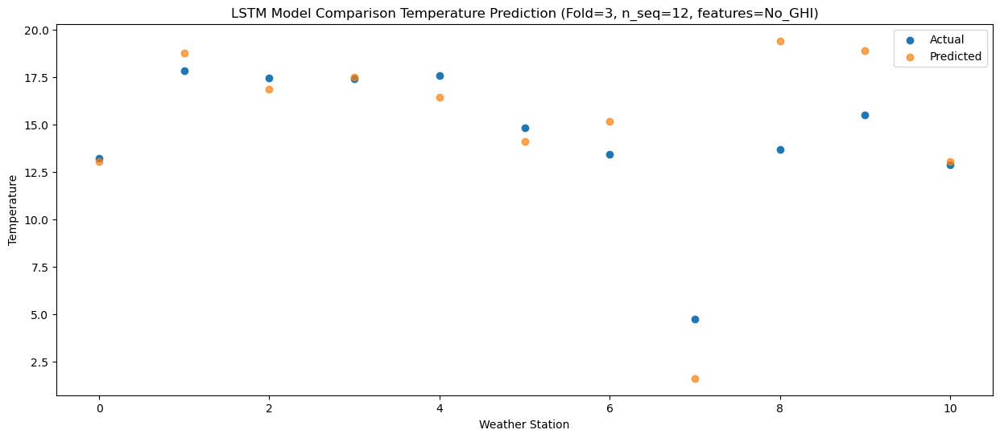

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   16.91  18.286097
1                 1   22.08  24.004122
2                 2   22.26  22.119371
3                 3   21.50  22.754094
4                 4   22.17  21.672901
5                 5   19.14  19.358506
6                 6   18.50  20.427804
7                 7    9.16   6.852051
8                 8   17.98  24.666175
9                 9   20.35  24.148718
10               10   17.16  18.310178


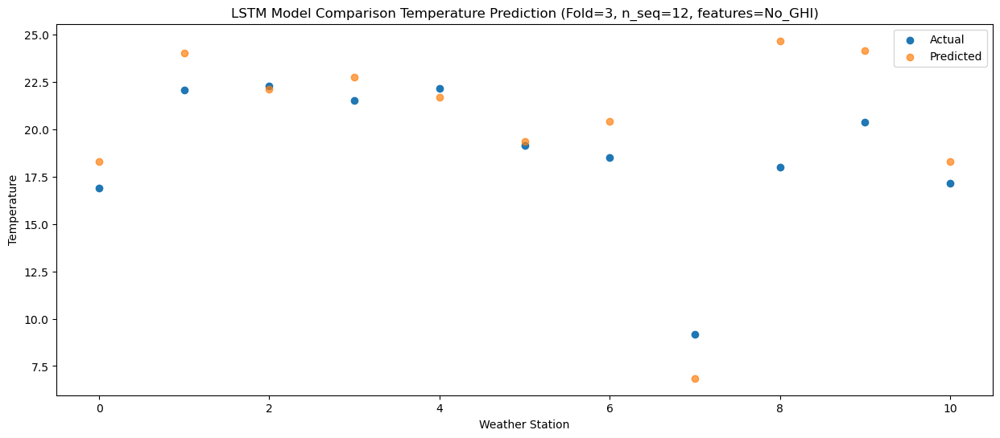

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   20.97  25.404813
1                 1   28.79  31.124246
2                 2   27.11  29.258956
3                 3   27.42  29.876156
4                 4   29.65  28.796595
5                 5   25.85  26.475861
6                 6   25.89  27.560920
7                 7   16.80  13.992039
8                 8   19.68  31.809862
9                 9   26.22  31.288011
10               10   23.33  25.443249


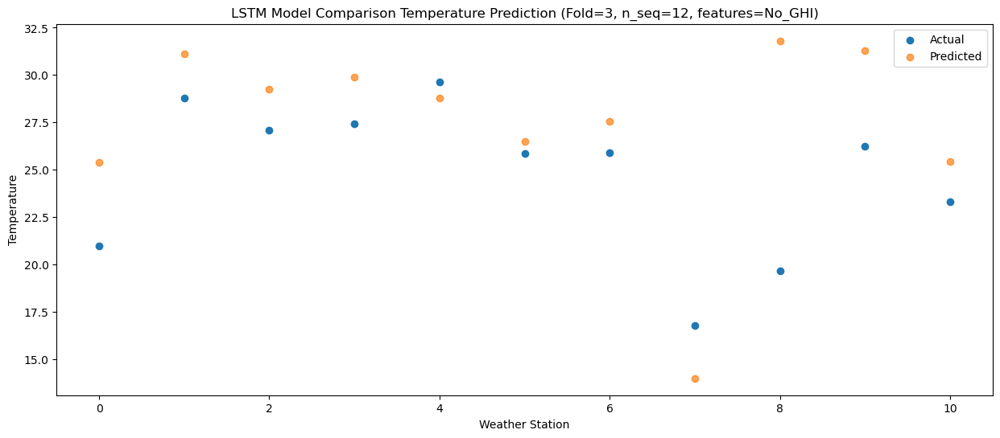

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   22.68  26.925356
1                 1   30.10  32.640973
2                 2   30.24  30.757116
3                 3   28.41  31.391614
4                 4   29.65  30.313911
5                 5   26.23  27.999446
6                 6   27.73  29.075713
7                 7   17.88  15.493094
8                 8   18.86  33.309209
9                 9   28.36  32.817508
10               10   24.97  26.978360


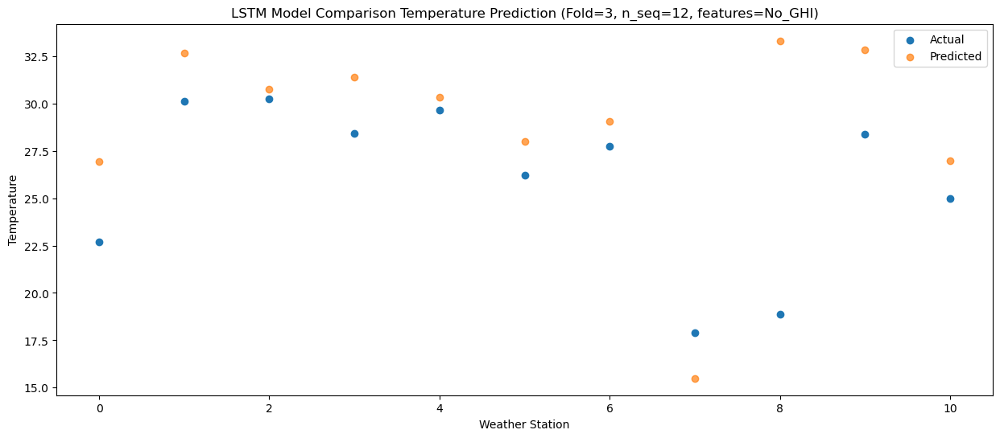

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   22.90  26.562751
1                 1   30.67  32.283726
2                 2   28.04  30.394095
3                 3   28.93  31.030254
4                 4   29.77  29.963098
5                 5   26.55  27.645040
6                 6   25.81  28.715401
7                 7   16.65  15.125388
8                 8   19.41  32.936458
9                 9   28.98  32.449528
10               10   24.70  26.612896


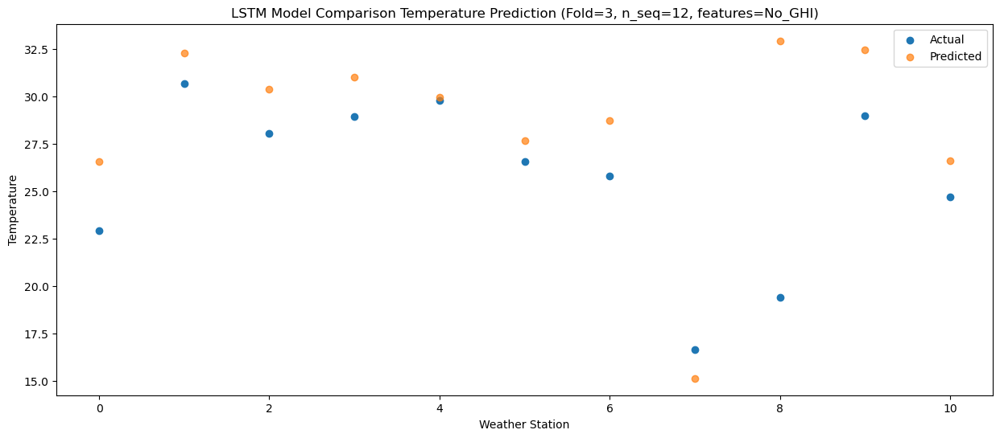

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   18.91  22.969984
1                 1   27.94  28.696501
2                 2   24.73  26.810642
3                 3   24.80  27.430679
4                 4   26.41  26.361225
5                 5   23.29  24.036438
6                 6   23.94  25.119581
7                 7   12.68  11.541358
8                 8   18.86  29.354110
9                 9   25.66  28.849414
10               10   20.44  23.003218


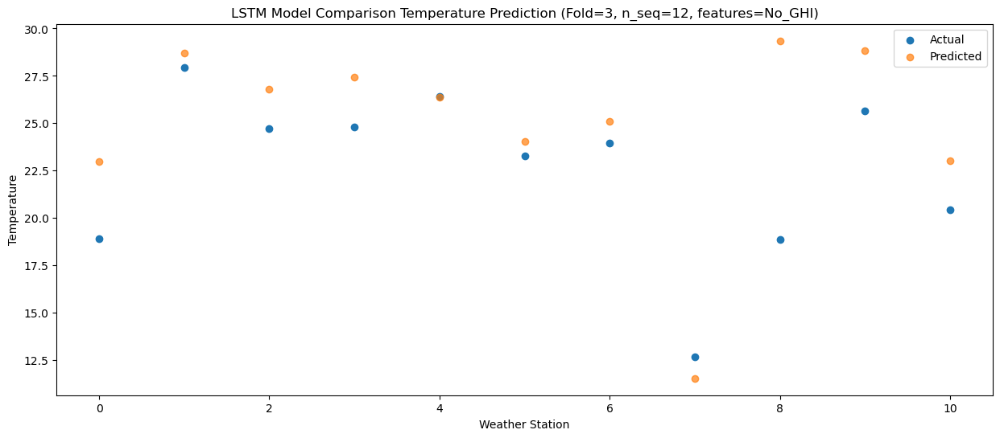

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   15.68  15.619021
1                 1   21.34  21.340259
2                 2   16.07  19.451450
3                 3   21.22  20.073490
4                 4   20.99  18.996861
5                 5   18.71  16.678799
6                 6   15.97  17.757155
7                 7    2.33   4.181771
8                 8   16.10  21.997424
9                 9   21.22  21.501036
10               10   16.32  15.662244


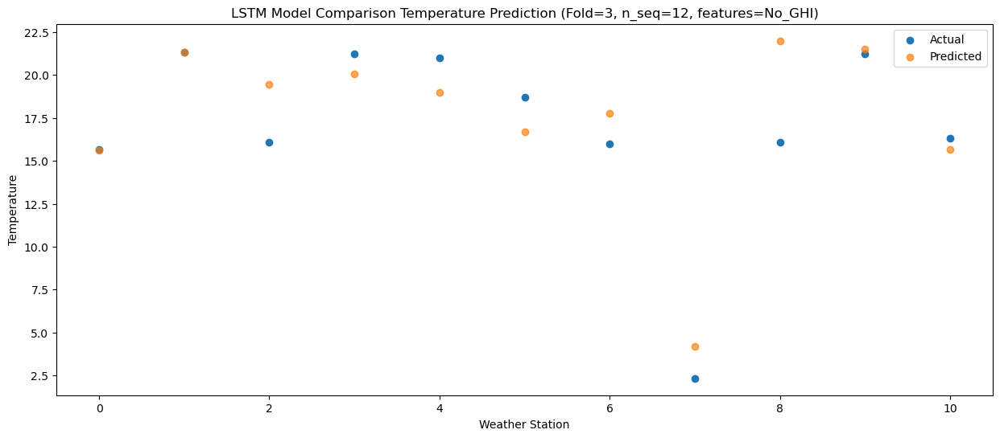

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    6.92   9.409745
1                 1   13.63  15.132044
2                 2   11.73  13.240228
3                 3   11.56  13.860253
4                 4   11.25  12.782745
5                 5    7.86  10.463556
6                 6   13.23  11.553535
7                 7   -0.19  -2.024353
8                 8   13.28  15.785415
9                 9   12.30  15.289553
10               10    6.10   9.450424


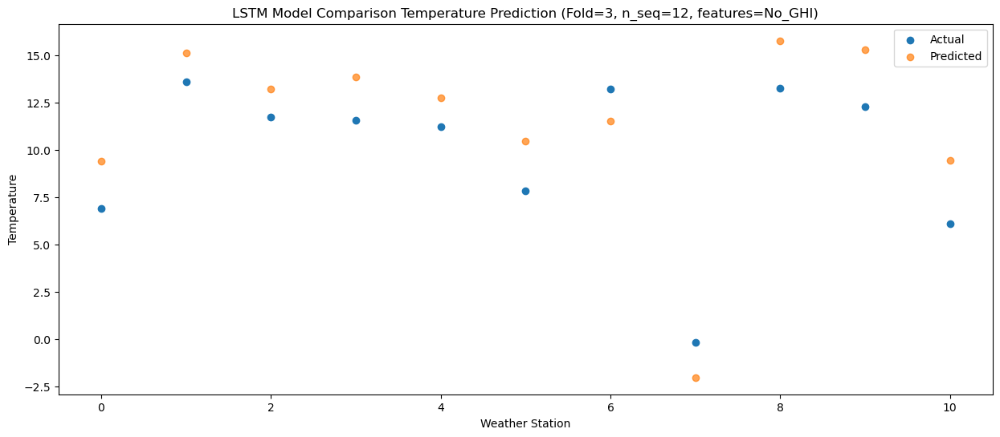

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    8.88   6.475970
1                 1   14.94  12.185348
2                 2    7.81  10.295177
3                 3   13.05  10.921916
4                 4   10.89   9.841023
5                 5    8.91   7.521835
6                 6    8.47   8.611428
7                 7   -7.46  -4.970266
8                 8    9.58  12.847339
9                 9   10.70  12.346144
10               10    5.69   6.505612


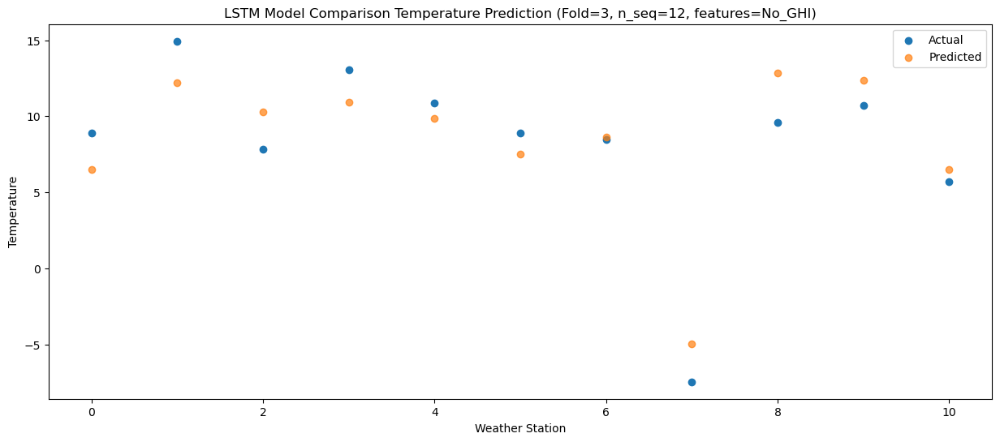

f, t:
[[ 2.92  7.75  8.28  6.19  5.1   2.8   5.6  -7.69 10.79  6.02  1.64]
 [ 3.29  4.03 10.58  4.87  1.23  0.08  5.7  -4.84 11.72  5.9   0.84]
 [10.09 16.   11.73 15.08 14.31 11.41  8.67 -3.24 11.5  10.9   8.03]
 [13.25 17.86 17.46 17.43 17.6  14.86 13.45  4.73 13.69 15.52 12.9 ]
 [16.91 22.08 22.26 21.5  22.17 19.14 18.5   9.16 17.98 20.35 17.16]
 [20.97 28.79 27.11 27.42 29.65 25.85 25.89 16.8  19.68 26.22 23.33]
 [22.68 30.1  30.24 28.41 29.65 26.23 27.73 17.88 18.86 28.36 24.97]
 [22.9  30.67 28.04 28.93 29.77 26.55 25.81 16.65 19.41 28.98 24.7 ]
 [18.91 27.94 24.73 24.8  26.41 23.29 23.94 12.68 18.86 25.66 20.44]
 [15.68 21.34 16.07 21.22 20.99 18.71 15.97  2.33 16.1  21.22 16.32]
 [ 6.92 13.63 11.73 11.56 11.25  7.86 13.23 -0.19 13.28 12.3   6.1 ]
 [ 8.88 14.94  7.81 13.05 10.89  8.91  8.47 -7.46  9.58 10.7   5.69]]
[[  2.97539478   8.6811249    6.79977093   7.4307305    6.34880567
    4.03053708   5.10162533  -8.46399192   9.34575521   8.81946427
    2.98216374]
 [ -0.25003213 

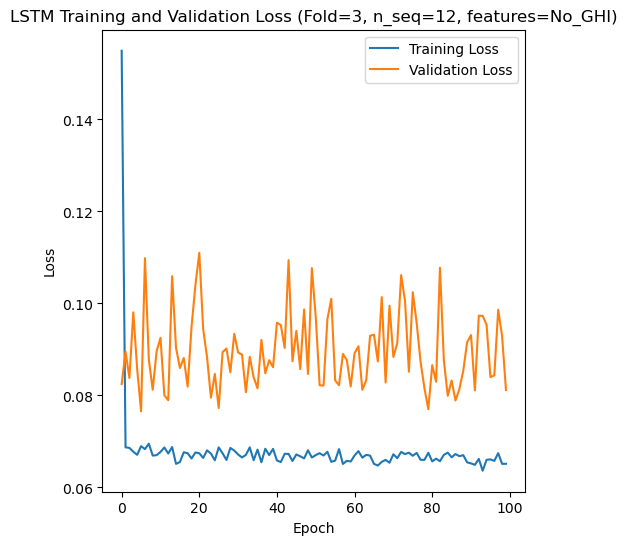

[[ 4.89  1.26  7.78 ... 22.59 18.46  9.82]
 [15.38 13.87 17.63 ... 26.66 22.89 20.2 ]
 [11.49  8.39 14.48 ... 24.97 20.83 17.82]
 ...
 [ 7.64  3.61 10.44 ... 21.3  17.62 11.34]
 [ 4.26  0.29  5.21 ... 21.47 15.54  9.34]
 [ 3.62 -0.32  6.05 ... 19.99 14.92  8.29]]
Epoch 1/100
84/84 [==============================] - 60s 380ms/step - loss: 0.2046 - accuracy: 0.7024 - mae: 0.1570 - rmse: 0.2046 - mape: 37.2560 - pearson: 0.6865 - val_loss: 0.0760 - val_accuracy: 0.7000 - val_mae: 0.0607 - val_rmse: 0.0760 - val_mape: 14.4071 - val_pearson: 0.8272
Epoch 2/100
84/84 [==============================] - 22s 267ms/step - loss: 0.0684 - accuracy: 0.7024 - mae: 0.0534 - rmse: 0.0684 - mape: 12.0410 - pearson: 0.8070 - val_loss: 0.1043 - val_accuracy: 0.7000 - val_mae: 0.0831 - val_rmse: 0.1043 - val_mape: 19.2789 - val_pearson: 0.7048
Epoch 3/100
84/84 [==============================] - 23s 279ms/step - loss: 0.0676 - accuracy: 0.7024 - mae: 0.0528 - rmse: 0.0676 - mape: 11.7771 - pearson: 0.8153

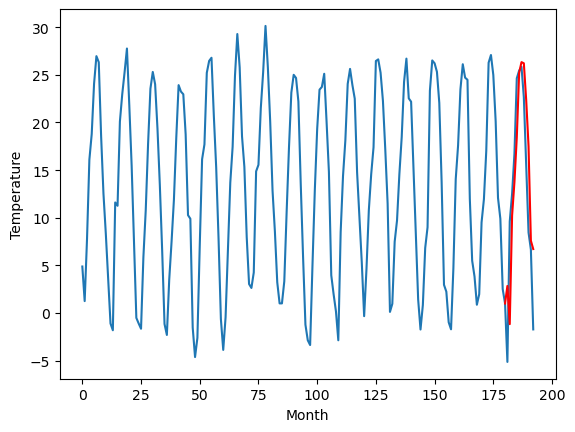

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.59		4.12		-1.47
9.02		0.14		-8.88
10.62		11.52		0.90
12.06		15.03		2.97
16.10		19.72		3.62
17.73		26.49		8.76
18.10		27.61		9.51
18.38		27.47		9.09
17.09		23.61		6.52
15.25		18.77		3.52
8.09		8.85		0.76
9.89		7.98		-1.91
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.25, 4.121641829013824, 0.13897843599319426, 11.523473217487336, 15.02539057970047, 19.720626308918, 26.4853705906868, 27.605446650981904, 27.46602173089981, 23.614633514881135, 18.77491612672806, 8.848040058612824, 7.97859008550644]


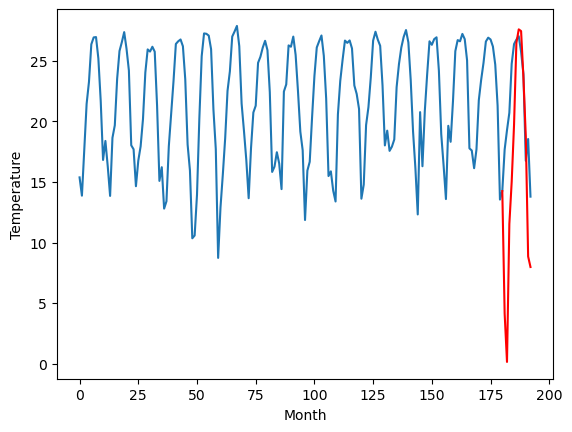

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.41		14.61		-0.80
13.49		10.63		-2.86
22.82		22.02		-0.80
23.89		25.52		1.63
28.36		30.22		1.86
32.62		36.98		4.36
33.28		38.11		4.83
33.93		37.97		4.04
30.81		34.12		3.31
27.42		29.28		1.86
18.75		19.34		0.59
22.26		18.48		-3.78
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.06, 14.610953097343446, 10.632651572227479, 22.015033011436465, 25.52370620250702, 30.21822000026703, 36.9760887670517, 38.1066743183136, 37.967504476308825, 34.11870930075646, 29.28042814612389, 19.341676925420764, 18.478131209611895]


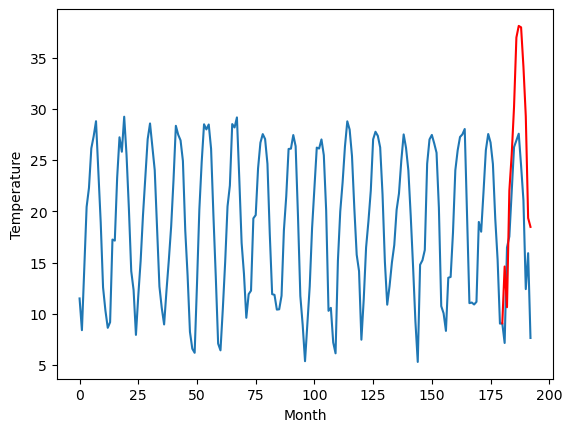

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.57		10.72		0.15
7.11		6.73		-0.38
18.07		18.12		0.05
19.76		21.63		1.87
23.92		26.32		2.40
29.60		33.07		3.47
31.19		34.20		3.01
31.56		34.06		2.50
28.77		30.21		1.44
24.12		25.37		1.25
16.12		15.44		-0.68
18.12		14.56		-3.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.48, 10.71744369506836, 6.727667322158814, 18.12057827949524, 21.629995098114016, 26.31851600646973, 33.06779455184937, 34.19718908309937, 34.062258546948435, 30.213448589444162, 25.365261619687082, 15.435952728390696, 14.55903959810734]


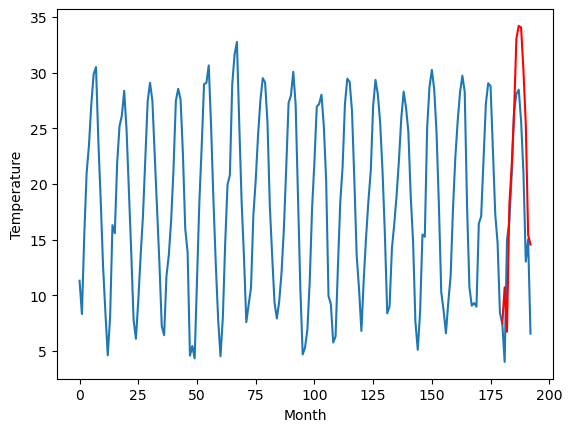

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.71		10.54		-0.17
6.82		6.55		-0.27
17.74		17.94		0.20
19.92		21.45		1.53
23.45		26.13		2.68
30.30		32.88		2.58
31.79		34.01		2.22
32.16		33.88		1.72
28.73		30.03		1.30
23.86		25.17		1.31
16.02		15.24		-0.78
17.76		14.36		-3.40
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.33, 10.536658821105958, 6.546492156982422, 17.940591392517092, 21.451677856445315, 26.133888778686526, 32.878897247314455, 34.00627857208252, 33.87582084298134, 30.026680198907854, 25.173961368799212, 15.24298736214638, 14.358883825540545]


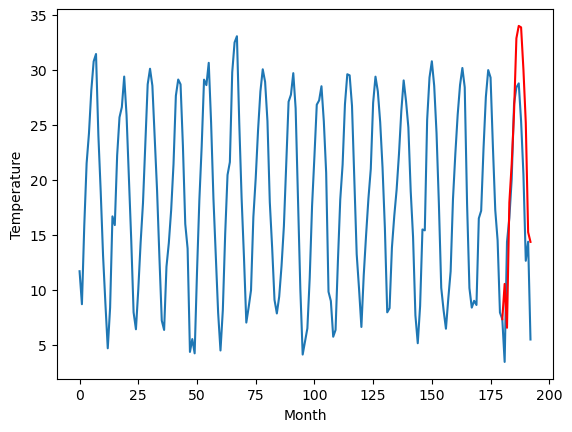

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.59		10.91		0.32
9.02		6.93		-2.09
18.27		18.32		0.05
20.50		21.83		1.33
25.99		26.52		0.53
30.95		33.26		2.31
30.69		34.39		3.70
31.01		34.27		3.26
30.32		30.42		0.10
24.62		25.57		0.95
17.68		15.64		-2.04
18.09		14.76		-3.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 10.914366009235382, 6.926105501651763, 18.320670130252836, 21.83251214265823, 26.515664818286893, 33.26236701250076, 34.389512898921964, 34.26607389241457, 30.4203464487195, 25.56940240651369, 15.641831109821794, 14.764815936386583]


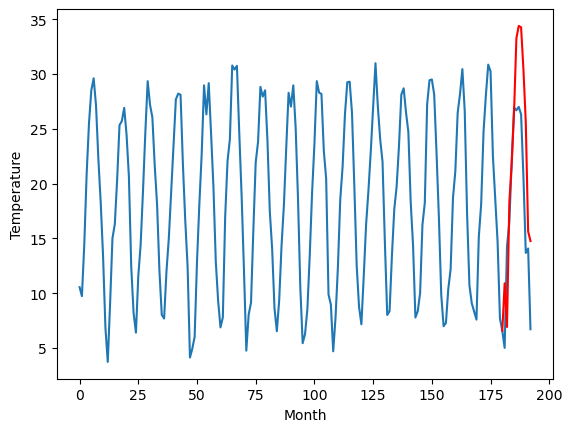

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		9.78		-1.01
11.46		5.80		-5.66
17.86		17.18		-0.68
20.59		20.69		0.10
24.04		25.38		1.34
28.06		32.13		4.07
29.80		33.26		3.46
29.93		33.12		3.19
25.96		29.27		3.31
22.16		24.42		2.26
14.00		14.48		0.48
15.91		13.61		-2.30
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.04, 9.778531489372254, 5.800191817283631, 17.17607873439789, 20.68609398365021, 25.375270543098452, 32.127525506019595, 33.2613977766037, 33.124826861023905, 29.268120957016947, 24.422180367112162, 14.475239945054057, 13.606851530671122]


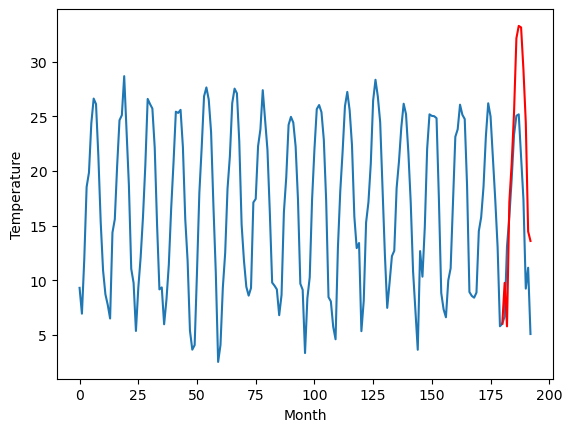

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.65		8.53		0.88
4.04		4.55		0.51
16.31		15.93		-0.38
18.21		19.44		1.23
22.25		24.12		1.87
28.55		30.87		2.32
29.84		32.01		2.17
30.36		31.87		1.51
27.32		28.02		0.70
21.55		23.17		1.62
13.61		13.23		-0.38
15.07		12.36		-2.71
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.13, 8.533036358356476, 4.548129208087921, 15.932106144428253, 19.436556704044342, 24.12313354730606, 30.870909101963043, 32.005876190662384, 31.874511934518814, 28.016051985025406, 23.171689249277115, 13.229276872873307, 12.357655740976334]


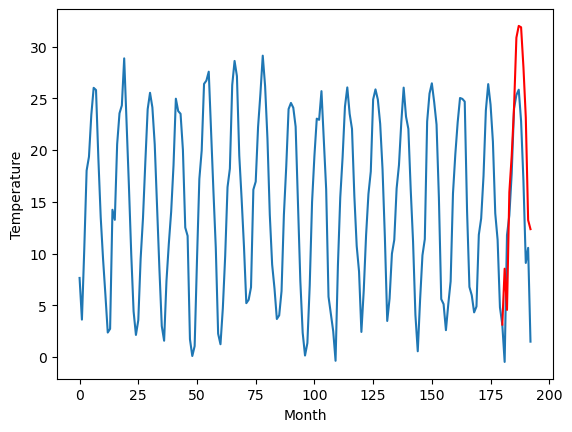

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.06		6.84		0.78
2.70		2.86		0.16
14.67		14.24		-0.43
18.32		17.74		-0.58
22.73		22.43		-0.30
29.97		29.18		-0.79
30.54		30.31		-0.23
31.40		30.18		-1.22
27.91		26.32		-1.59
22.56		21.47		-1.09
11.70		11.52		-0.18
12.02		10.65		-1.37
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.29, 6.842311098575592, 2.8577856564521786, 14.238008930683137, 17.740251972675324, 22.429022266864777, 29.175279095172883, 30.31194551229477, 30.1824492508173, 26.317830949425698, 21.47366133272648, 11.519869714379311, 10.652799873948098]


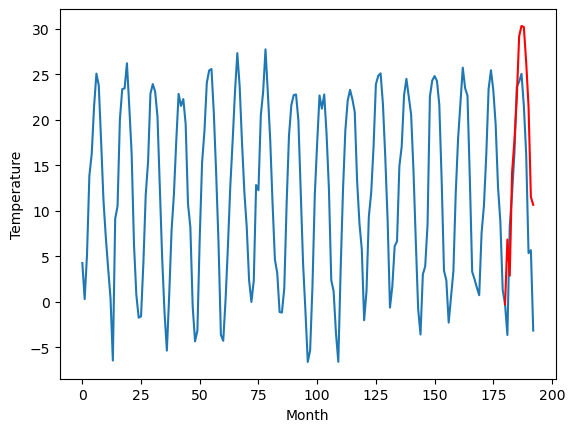

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.23		3.46		1.23
-2.21		-0.53		1.68
11.65		10.87		-0.78
15.36		14.37		-0.99
20.14		19.05		-1.09
27.53		25.80		-1.73
27.24		26.94		-0.30
27.52		26.81		-0.71
24.41		22.94		-1.47
18.95		18.10		-0.85
8.64		8.15		-0.49
8.39		7.28		-1.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-1.03, 3.4641682600975034, -0.5274014973640444, 10.865877578258514, 14.36569542646408, 19.05434412717819, 25.79925675153732, 26.935407111644743, 26.808421457409857, 22.94404848873615, 18.096656883358953, 8.145543182492254, 7.276172721982]


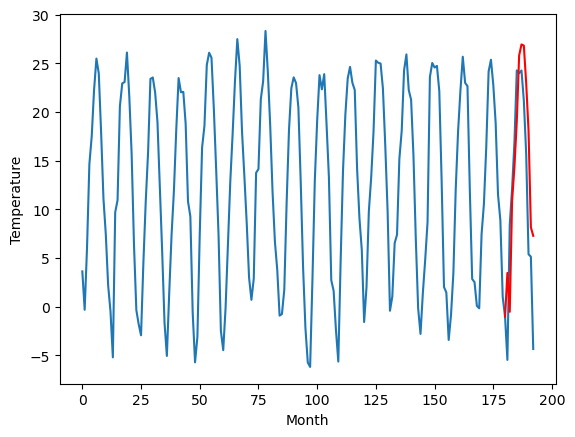

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.70		2.82		1.12
-0.54		-1.17		-0.63
9.35		10.21		0.86
13.15		13.71		0.56
17.68		18.41		0.73
24.57		25.15		0.58
24.73		26.29		1.56
25.93		26.16		0.23
21.64		22.29		0.65
18.11		17.44		-0.67
7.71		7.48		-0.23
6.85		6.61		-0.24
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-2.29, 2.815658266544342, -1.1660023379325866, 10.214831287860871, 13.712102110385896, 18.40619581460953, 25.15196769952774, 26.285092289447785, 26.158051694631578, 22.285605157613755, 17.441727842092515, 7.477531636953355, 6.611924613714219]


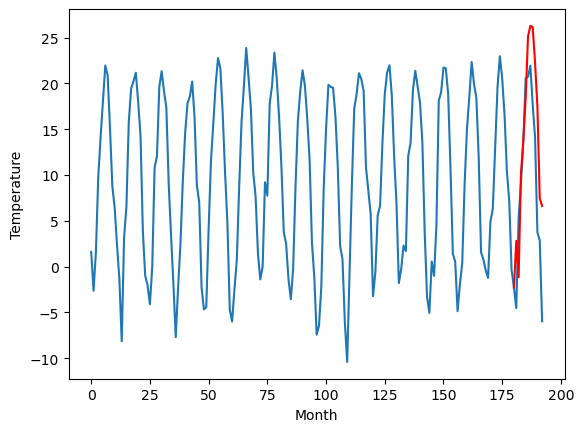

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.11   2.848682
1                 1    5.59   4.121642
2                 2   15.41  14.610953
3                 3   10.57  10.717444
4                 4   10.71  10.536659
5                 5   10.59  10.914366
6                 6   10.79   9.778531
7                 7    7.65   8.533036
8                 8    6.06   6.842311
9                 9    2.23   3.464168
10               10    1.70   2.815658


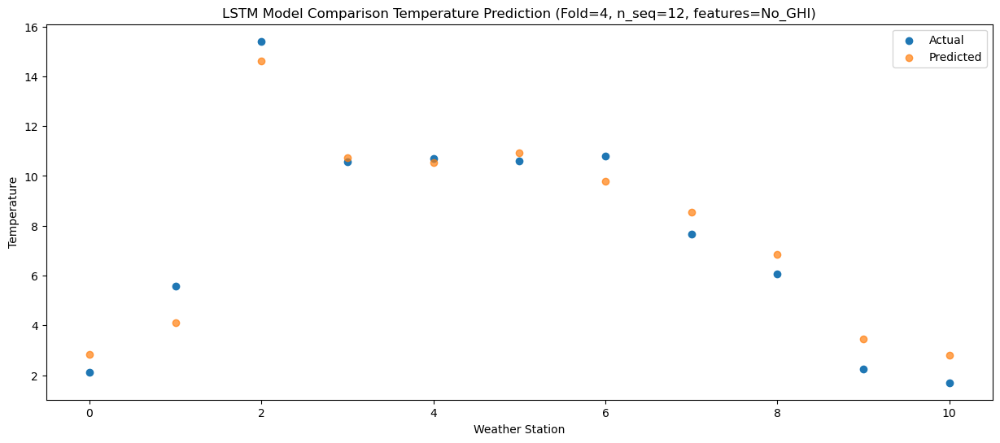

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -4.02  -1.155484
1                 1    9.02   0.138978
2                 2   13.49  10.632652
3                 3    7.11   6.727667
4                 4    6.82   6.546492
5                 5    9.02   6.926106
6                 6   11.46   5.800192
7                 7    4.04   4.548129
8                 8    2.70   2.857786
9                 9   -2.21  -0.527401
10               10   -0.54  -1.166002


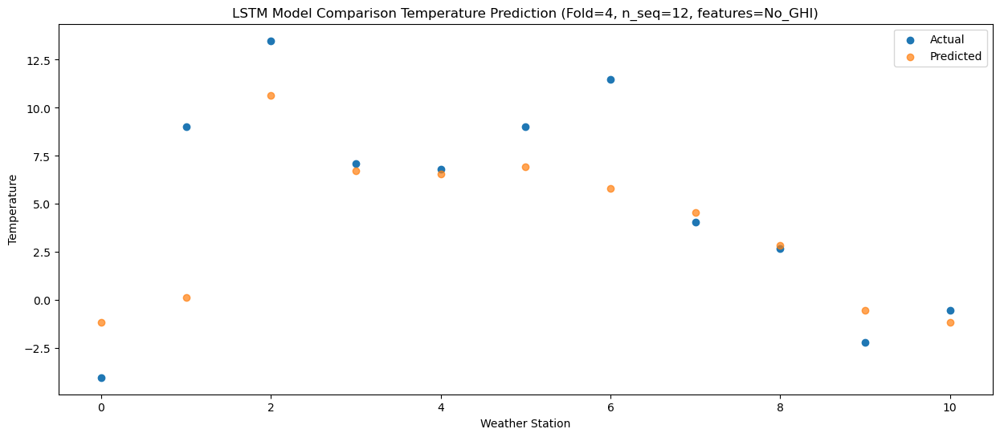

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.71  10.245163
1                 1   10.62  11.523473
2                 2   22.82  22.015033
3                 3   18.07  18.120578
4                 4   17.74  17.940591
5                 5   18.27  18.320670
6                 6   17.86  17.176079
7                 7   16.31  15.932106
8                 8   14.67  14.238009
9                 9   11.65  10.865878
10               10    9.35  10.214831


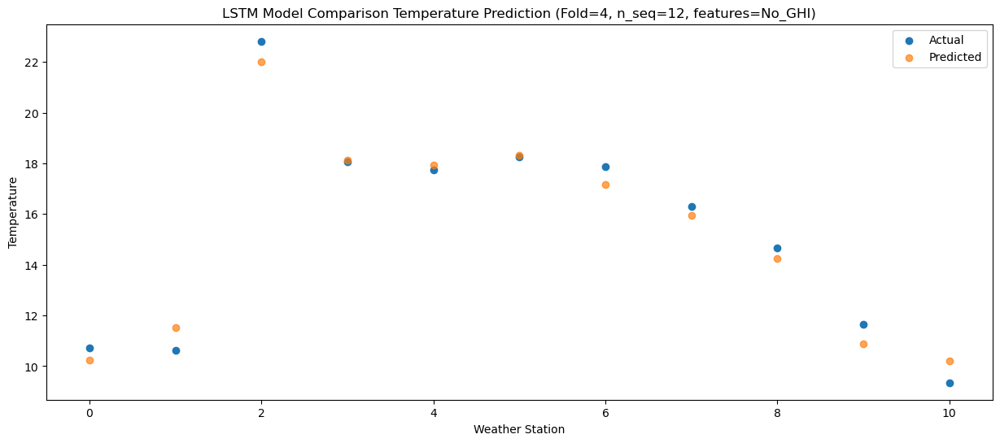

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.62  13.757982
1                 1   12.06  15.025391
2                 2   23.89  25.523706
3                 3   19.76  21.629995
4                 4   19.92  21.451678
5                 5   20.50  21.832512
6                 6   20.59  20.686094
7                 7   18.21  19.436557
8                 8   18.32  17.740252
9                 9   15.36  14.365695
10               10   13.15  13.712102


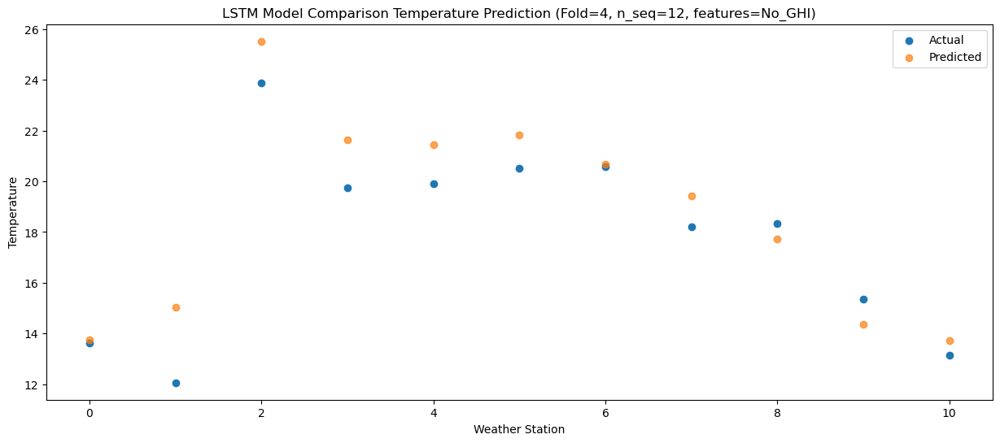

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   17.83  18.449649
1                 1   16.10  19.720626
2                 2   28.36  30.218220
3                 3   23.92  26.318516
4                 4   23.45  26.133889
5                 5   25.99  26.515665
6                 6   24.04  25.375271
7                 7   22.25  24.123134
8                 8   22.73  22.429022
9                 9   20.14  19.054344
10               10   17.68  18.406196


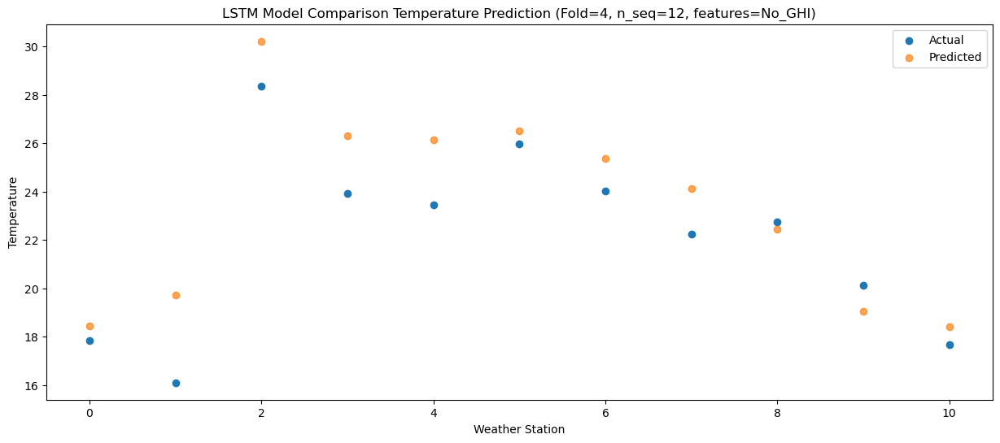

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   25.74  25.208601
1                 1   17.73  26.485371
2                 2   32.62  36.976089
3                 3   29.60  33.067795
4                 4   30.30  32.878897
5                 5   30.95  33.262367
6                 6   28.06  32.127526
7                 7   28.55  30.870909
8                 8   29.97  29.175279
9                 9   27.53  25.799257
10               10   24.57  25.151968


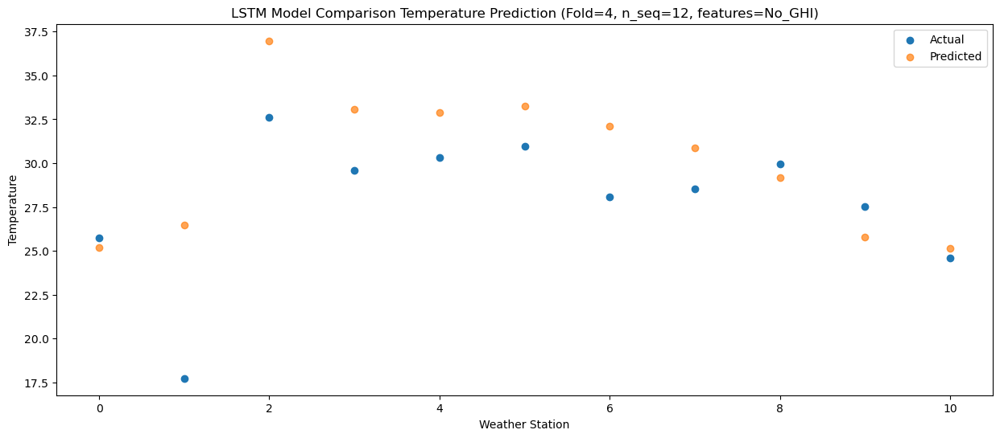

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   26.54  26.333675
1                 1   18.10  27.605447
2                 2   33.28  38.106674
3                 3   31.19  34.197189
4                 4   31.79  34.006279
5                 5   30.69  34.389513
6                 6   29.80  33.261398
7                 7   29.84  32.005876
8                 8   30.54  30.311946
9                 9   27.24  26.935407
10               10   24.73  26.285092


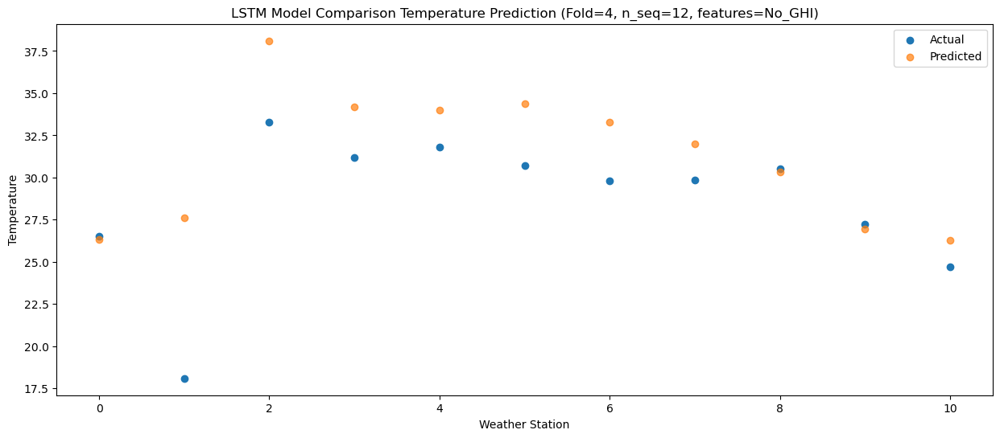

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   26.94  26.208895
1                 1   18.38  27.466022
2                 2   33.93  37.967504
3                 3   31.56  34.062259
4                 4   32.16  33.875821
5                 5   31.01  34.266074
6                 6   29.93  33.124827
7                 7   30.36  31.874512
8                 8   31.40  30.182449
9                 9   27.52  26.808421
10               10   25.93  26.158052


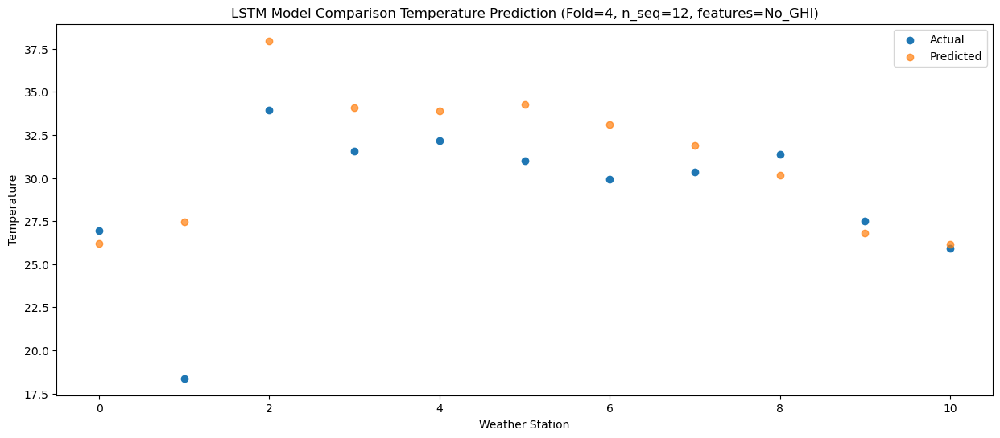

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   23.75  22.361964
1                 1   17.09  23.614634
2                 2   30.81  34.118709
3                 3   28.77  30.213449
4                 4   28.73  30.026680
5                 5   30.32  30.420346
6                 6   25.96  29.268121
7                 7   27.32  28.016052
8                 8   27.91  26.317831
9                 9   24.41  22.944048
10               10   21.64  22.285605


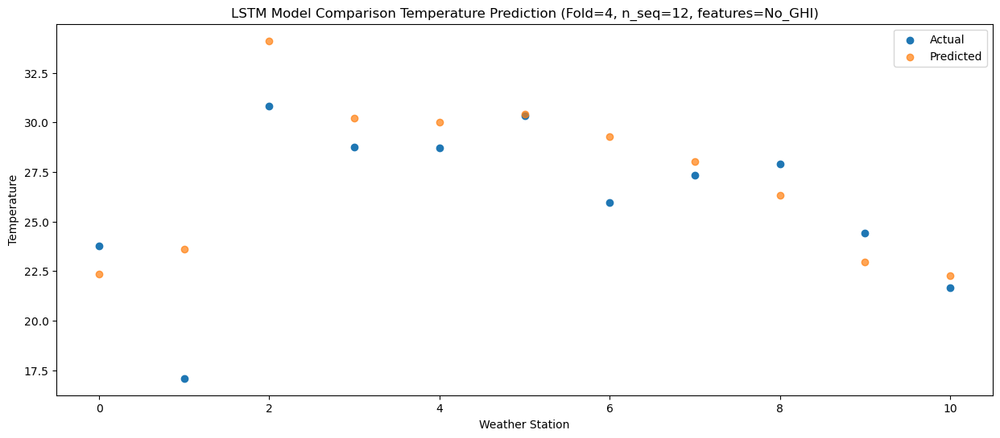

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   16.62  17.517122
1                 1   15.25  18.774916
2                 2   27.42  29.280428
3                 3   24.12  25.365262
4                 4   23.86  25.173961
5                 5   24.62  25.569402
6                 6   22.16  24.422180
7                 7   21.55  23.171689
8                 8   22.56  21.473661
9                 9   18.95  18.096657
10               10   18.11  17.441728


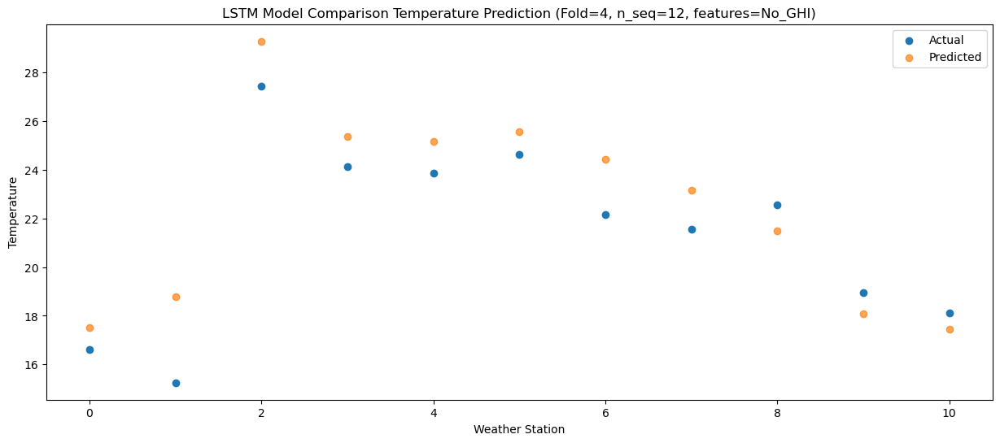

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    9.56   7.598046
1                 1    8.09   8.848040
2                 2   18.75  19.341677
3                 3   16.12  15.435953
4                 4   16.02  15.242987
5                 5   17.68  15.641831
6                 6   14.00  14.475240
7                 7   13.61  13.229277
8                 8   11.70  11.519870
9                 9    8.64   8.145543
10               10    7.71   7.477532


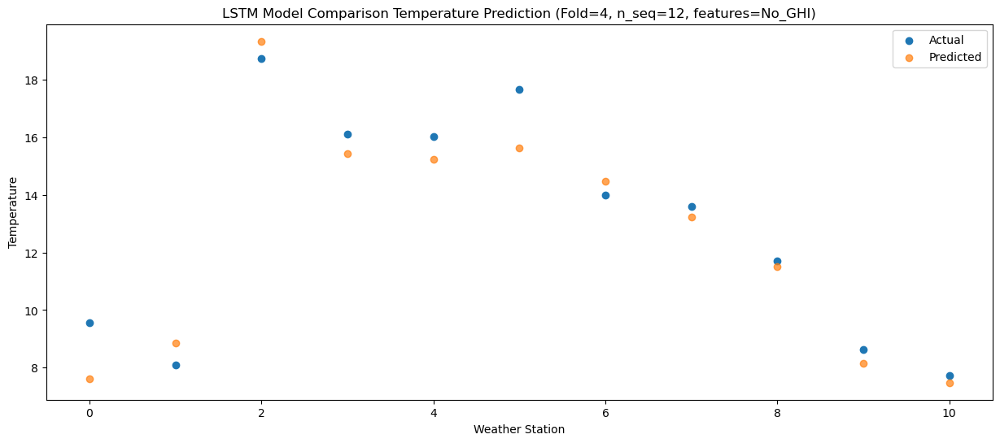

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.77   6.720936
1                 1    9.89   7.978590
2                 2   22.26  18.478131
3                 3   18.12  14.559040
4                 4   17.76  14.358884
5                 5   18.09  14.764816
6                 6   15.91  13.606852
7                 7   15.07  12.357656
8                 8   12.02  10.652800
9                 9    8.39   7.276173
10               10    6.85   6.611925


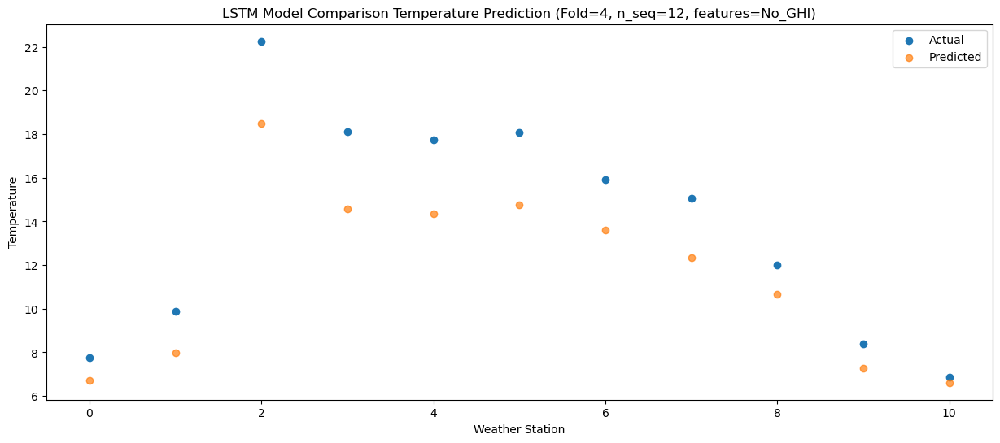

f, t:
[[ 2.11  5.59 15.41 10.57 10.71 10.59 10.79  7.65  6.06  2.23  1.7 ]
 [-4.02  9.02 13.49  7.11  6.82  9.02 11.46  4.04  2.7  -2.21 -0.54]
 [10.71 10.62 22.82 18.07 17.74 18.27 17.86 16.31 14.67 11.65  9.35]
 [13.62 12.06 23.89 19.76 19.92 20.5  20.59 18.21 18.32 15.36 13.15]
 [17.83 16.1  28.36 23.92 23.45 25.99 24.04 22.25 22.73 20.14 17.68]
 [25.74 17.73 32.62 29.6  30.3  30.95 28.06 28.55 29.97 27.53 24.57]
 [26.54 18.1  33.28 31.19 31.79 30.69 29.8  29.84 30.54 27.24 24.73]
 [26.94 18.38 33.93 31.56 32.16 31.01 29.93 30.36 31.4  27.52 25.93]
 [23.75 17.09 30.81 28.77 28.73 30.32 25.96 27.32 27.91 24.41 21.64]
 [16.62 15.25 27.42 24.12 23.86 24.62 22.16 21.55 22.56 18.95 18.11]
 [ 9.56  8.09 18.75 16.12 16.02 17.68 14.   13.61 11.7   8.64  7.71]
 [ 7.77  9.89 22.26 18.12 17.76 18.09 15.91 15.07 12.02  8.39  6.85]]
[[ 2.84868186  4.12164183 14.6109531  10.7174437  10.53665882 10.91436601
   9.77853149  8.53303636  6.8423111   3.46416826  2.81565827]
 [-1.15548426  0.13897844 10

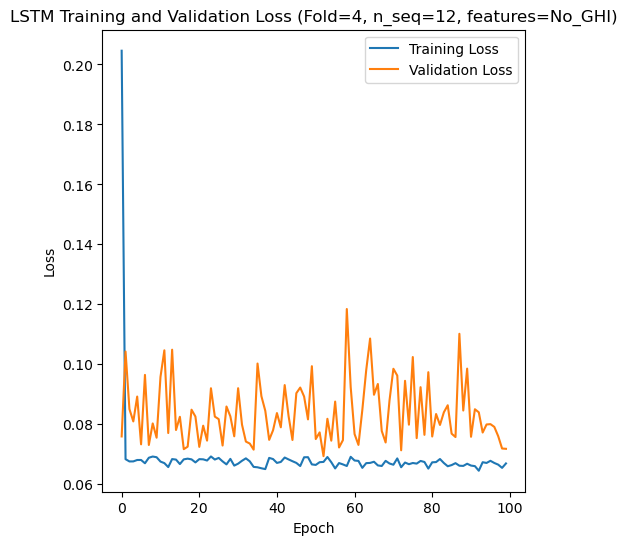

[[2.463230975196771], [1.9551670610248946], [3.093355663297587], [3.3043678187005736], [2.5154532869625816]]
[[array(2.46323098)], [array(1.95516706)], [array(3.09335566)], [array(3.30436782)], [array(2.51545329)]]
[[1.9337526019233644], [1.5416217043995855], [2.1519161935060316], [2.325878318241148], [1.7613703307690043]]
[[0.1706109806057684], [0.09392012201555412], [0.16171364244298617], [0.3542351398618362], [0.1276898024273784]]
[[0.9019374162930285], [0.9318550848571284], [0.8716822001029545], [0.8632613693724316], [0.9189913192028796]]
[[array(0.07255598)], [array(0.09392012)], [array(0.16171364)], [array(0.17442819)], [array(0.08779304)]]
[[array(0.94905019)], [array(0.94298181)], [array(0.87642776)], [array(0.91493879)], [array(0.94356697)]]
[ 4.43  1.08 12.15 13.68 18.18 22.85 24.44 24.55 20.97 16.95  8.19 11.57
 12.87 12.78 17.84 19.24 23.26 26.74 27.96 28.3  26.17 23.54 18.03 17.79
 15.34 16.2  22.18 23.82 27.8  31.94 33.7  33.98 30.41 26.53 18.17 20.35
  9.    7.43 15.34 1

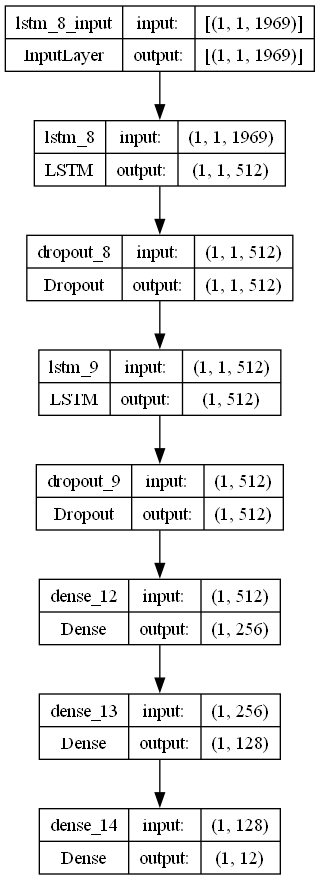

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    lr = 0.009732454793797442
    optimizer = SGD(learning_rate = lr)
    activation_function = 'sigmoid'
    lstm_units = 512
    dropout_rate = 0.24295407842767164

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # Plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # Plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_GHI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_GHI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_CV_S12_No_GHI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)